**Capstone Project: Predicting share price movement based on Earnings Call Transcripts**

In [3]:
import requests
import bs4
from bs4 import BeautifulSoup
import numpy as np
import pandas as pd
from tqdm import tqdm
import re
from datetime import datetime, date, timedelta
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import cross_val_score, train_test_split, StratifiedKFold

In [6]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, plot_confusion_matrix
from sklearn.metrics import roc_auc_score, average_precision_score, plot_roc_curve, plot_precision_recall_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn import naive_bayes
from sklearn import svm, linear_model
from sklearn.neural_network import MLPRegressor

In [5]:
import joblib

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(font_scale=1.5)

%config InlineBackend.figure_format = 'retina'


%matplotlib inline

# Data Collection

## Scraping Earnings Call Transcripts

### Scraping the individual URLs from the website 

In [154]:
ref_container=[]
for j in tqdm(range(1,1092)):
    url_j='https://www.fool.com/earnings-call-transcripts/?page={}'.format(j)
    r_j = requests.get(url_j)
    soup_j= BeautifulSoup(r_j.text, 'html.parser')
    references=soup_j.find('div', attrs={'class':'list-content'}).find_all('a')
    for ref in references:
        ref_container.append(ref['href'])

100%|██████████| 1091/1091 [09:31<00:00,  1.91it/s]


In [155]:
len(ref_container)

21820

In [158]:
ref_df=pd.DataFrame(ref_container, columns=['url'])

In [159]:
ref_df.head()

,url
0,/earnings/call-transcripts/2020/10/22/pool-cor...
1,/earnings/call-transcripts/2020/10/22/lindsay-...
2,/earnings/call-transcripts/2020/10/22/kimberly...
3,/earnings/call-transcripts/2020/10/22/safehold...
4,/earnings/call-transcripts/2020/10/22/heritage...


In [160]:
ref_df.shape

(21820, 1)

In [161]:
ref_df.to_csv(r'ref_df.csv', header = True)

### Scraping individual earnings call transcripts

In [2]:
references=pd.read_csv('ref_df.csv')

references.drop(columns = ['Unnamed: 0'], inplace=True)

In [27]:
references.shape

(21820, 1)

I scraped the individual transcripts in batches. These codes could have been more efficient. I did not prepare the code for unexpceted errors. And an unexpected error only occured in the batch I scraped last, therefore I did not go back to implement a try - except formula.
Also, I missed a batch originally, and did it later, hence there is a logical skip in he numbering.
(I later renamed the files on my computer)

In [13]:
pages = []
for i in tqdm(range(2000)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages.append(soup_i.find('div', attrs={'class':'full_article'}))
    

100%|██████████| 2000/2000 [54:41<00:00,  1.64s/it]    


In [23]:
pages_df=pd.DataFrame(pages)

In [24]:
pages_df.to_csv(r'pages_df.csv', header = True)

In [28]:
pages2 = []
for i in tqdm(range(2001,4001)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages2.append(soup_i.find('div', attrs={'class':'full_article'}))

pages2_df=pd.DataFrame(pages2)
pages2_df.to_csv(r'pages2_df.csv', header = True)

100%|██████████| 2000/2000 [21:01<00:00,  1.58it/s]


In [29]:
pages3 = []
for i in tqdm(range(4001,6001)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages3.append(soup_i.find('div', attrs={'class':'full_article'}))

pages3_df=pd.DataFrame(pages3)
pages3_df.to_csv(r'pages3_df.csv', header = True)

100%|██████████| 2000/2000 [22:16<00:00,  1.50it/s]  


In [30]:
pages4 = []
for i in tqdm(range(6001,8001)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages4.append(soup_i.find('div', attrs={'class':'full_article'}))

pages4_df=pd.DataFrame(pages4)
pages4_df.to_csv(r'pages4_df.csv', header = True)

100%|██████████| 2000/2000 [23:55<00:00,  1.39it/s]  


In [31]:
pages5 = []
for i in tqdm(range(8001,10001)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages5.append(soup_i.find('div', attrs={'class':'full_article'}))

pages5_df=pd.DataFrame(pages5)
pages5_df.to_csv(r'pages5_df.csv', header = True)

100%|██████████| 2000/2000 [39:34<00:00,  1.19s/it]   


In [33]:
pages6 = []
for i in tqdm(range(10001,12001)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages6.append(soup_i.find('div', attrs={'class':'full_article'}))

pages6_df=pd.DataFrame(pages6)
pages6_df.to_csv(r'pages6_df.csv', header = True)

100%|██████████| 2000/2000 [29:10<00:00,  1.14it/s]    


In [34]:
pages7 = []
for i in tqdm(range(12001,14001)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages7.append(soup_i.find('div', attrs={'class':'full_article'}))

pages7_df=pd.DataFrame(pages7)
pages7_df.to_csv(r'pages7_df.csv', header = True)

100%|██████████| 2000/2000 [19:49<00:00,  1.68it/s]


In [36]:
pages8 = []
for i in tqdm(range(14001,16001)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages8.append(soup_i.find('div', attrs={'class':'full_article'}))

pages8_df=pd.DataFrame(pages8)
pages8_df.to_csv(r'pages8_df.csv', header = True)

100%|██████████| 2000/2000 [20:04<00:00,  1.66it/s]


In [17]:
pages_1= []
for i in tqdm(range(16001,16028)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages_1.append(soup_i.find('div', attrs={'class':'full_article'}))

100%|██████████| 27/27 [00:43<00:00,  1.59s/it]


In [19]:
pages_2= []
for i in tqdm(range(16028,16029)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages_2.append(soup_i.find('div', attrs={'class':'full_article'}))

100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


In [21]:
#this reference was not working, website can't be found anymore
references.iloc[16029,0]

'/earnings/call-transcripts/2019/04/25/knowlescorporation-kn-q1-2019-earnings-call-transc.aspx'

In [22]:
pages_3= []
for i in tqdm(range(16030,18001)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages_2.append(soup_i.find('div', attrs={'class':'full_article'}))

100%|██████████| 1971/1971 [23:41<00:00,  1.39it/s]  


In [27]:
pages_missed = []

In [28]:
pages_missed.extend(pages_1)
pages_missed.extend(pages_2)
pages_missed.extend(pages_3)

In [30]:
pages_missed_df=pd.DataFrame(pages_missed)

In [36]:
pages_missed_df.to_csv(r'pages_missed_df.csv', header = True)

In [38]:
pages9 = []
for i in tqdm(range(18001,20001)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages9.append(soup_i.find('div', attrs={'class':'full_article'}))

pages9_df=pd.DataFrame(pages9)
pages9_df.to_csv(r'pages9_df.csv', header = True)

100%|██████████| 2000/2000 [20:11<00:00,  1.65it/s]


In [5]:
pages10 = []
for i in tqdm(range(20001,21820)):
    ref = references.iloc[i,0]
    url_i = 'https://www.fool.com{}'.format(ref)
    r_i= requests.get(url_i)
    soup_i=BeautifulSoup(r_i.text, 'html.parser')
    
   
    pages10.append(soup_i.find('div', attrs={'class':'full_article'}))

pages10_df=pd.DataFrame(pages10)
pages10_df.to_csv(r'pages10_df.csv', header = True)

100%|██████████| 1819/1819 [21:19<00:00,  1.42it/s] 


### Combining scraped pages

Please note that I renumbered the saved files on my computer to be more suitable for my further codes.

In [117]:
all_pages=pd.read_csv(r'pages_df.csv')

In [118]:
for i in range(2, 12):
    pages_i=pd.read_csv(r'pages{}_df.csv'.format(i))
    all_pages=pd.concat([all_pages, pages_i], axis = 0, ignore_index=True)

In [119]:
all_pages.shape

(21818, 8)

In [121]:
all_pages.to_csv(r'all_pages_df.csv', header = True)

## Organising the transcripts

### Parsing the scraped transcripts to relevant feature columns

In [4]:
all_pages_df=pd.read_csv(r'/Users/ritatolgyesi/Fileok/Raw_pages/all_pages_df.csv')

In [5]:
print(all_pages_df.shape)
all_pages_df.describe(include='all')

(21818, 9)


,Unnamed: 0,Unnamed: 0.1,0,1,2,3,4,5,6
count,21818.000000,21818.000000,21818,21818,21818,21818,21818,21818,21818
unique,NaN,NaN,1,21741,1,21818,1,21818,1
top,NaN,NaN,\n,"<section class=""usmf-new article-header"">\n<he...",\n,"<div class=""main-col"">\n<!--placeholder-->\n<d...",\n,"<div class=""side-col article-page"">\n<section ...",\n
freq,NaN,NaN,21818,3,21818,1,21818,1,21818
mean,10908.500000,991.909066,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,6298.458423,573.707736,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,5454.250000,495.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,10908.500000,991.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,16362.750000,1487.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
#Dropping unncessary columns:
#pos 0: index from reload
#pos 1: index from reload at combination, 
#pos 2, 4, 6, 8: "/n" sign for all, from scrape process


all_pages_df.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', '0', '2', '4', '6'], inplace=True)

In [7]:
all_pages_dict = all_pages_df.to_dict(orient='index')

In [8]:
def name_quarter_sentence_extractor(x):
    '''This functions exctracts a heading with the following details: 
    name of company, ticker, quarter and year the results are related to'''
    soup = BeautifulSoup(x, 'html.parser')
    try:
        return soup.find('h1').text
    except:
        return np.nan

In [9]:
def ticker_period_end_sentence_extractor(x):
    '''This functions exctracts a heading with the following details: 
     ticker,  of the company, date of period end the results are related to'''
    soup = BeautifulSoup(x, 'html.parser')
    try:
        return soup.find('h2').text
    except:
        return np.nan

In [10]:
def all_paragraph_string(x):
    '''This functions exctracts all paragraphs in the eranings call transcript (marked by "p") '''
    soup= BeautifulSoup(x, 'html.parser')
    par_str=''
    try:
        for par in soup.find_all('p'):
            par_str+=par.text+ ' '
    except:
        par_str = np.nan
    return par_str

In [11]:
def ticker_extractor(x):
    '''This functions exctracts the ticker of the comapny from the heading'''
    try: 
        return re.findall(re.compile(r'[\w.]*(?=\))'), x)[0]
    except:
        return np.nan

In [12]:
def QandY_extractor(x):
    '''This functions exctracts the quarter and year information from the heading'''
    return x.split(' ')[-5]+' '+x.split(' ')[-4]

In [13]:
def date_reset(x):
    '''This function will format the date from the heading to a useable format'''
    new_date=''
    month_dict={'Jan': '01',
           'Feb': '02',
           'Mar': '03',
            'Apr':'04',
            'May': '05',
            'Jun': '06',
            'Jul': '07',
            'Aug': '08',
            'Sep': '09',
           'Oct':'10',
           'Nov': '11',
           'Dec': '12'}
    try:
        new_date+=re.findall(re.compile(r'\d{4}'), x)[0] +'-'+month_dict[re.findall(re.compile(r'([A-Z][a-z]{2})'), x)[0]]+'-'+re.findall(re.compile(r'(\d*)(:?,)'), x)[0][0]
        return new_date
    except:
        return np.nan

In [15]:
def paragraph_separator_str(x):
    '''This functions separates the paragraphs to the "prepared remarks" and "Q and A" sections'''
    #I did not use this information in this project, but intend to continue and analyse the two sections separately in the future
    # Not all transcripts are structured in the exact same way unfortunately
    soup = BeautifulSoup(x, 'html.parser')
    q_and_a_par_str=[]
    prep_remark_par_str=[]
    if len(soup.find(attrs={'class':'article-content'}).find_all('h2'))==4:
        try: 
            for paragraph in soup.find(attrs={'class':'article-content'}).find_all('h2')[2].next_siblings:
                q_and_a_par_str.append(paragraph)
        except:
            q_and_a_par_str.append(np.nan)
            
        try:
            for par in soup.find_all('p'):
                if par.text not in q_and_a_par_str:
                    prep_remark_par_str.append(par.text)
        except:
            prep_remark_par_str.append(np.nan)
    else:
        q_and_a_par_str.append(np.nan)
        prep_remark_par_str.append(np.nan)
    return q_and_a_par_str, prep_remark_par_str

In [16]:
def call_date_extractor(x):
    '''This functions exctracts the date of the call'''
    soup = BeautifulSoup(x, 'html.parser')
    try:
        date= soup.find('span', attrs={'class': 'article-content'}).find('span', attrs={'id': 'date'}).text
    except:
        try:
            date = soup.find('span', attrs={'class': 'article-content'}).find('em').previous_sibling
        except:
            date = np.nan #
    if date == '':
        date = soup.find('span', attrs={'class': 'article-content'}).find('span', attrs={'id': 'date'}).next_sibling
        if date == '':
            try:
                date = soup.find('span', attrs={'class': 'article-content'}).find('span', attrs={'class': 'ticker'}).find('br').next_sibling
            except:
                try:
                    date = soup.find('span', attrs={'class': 'article-content'}).find('em').previous_sibling
                except:
                    date = np.nan
    if date == np.nan:
        call_date = np.nan
    else:
        call_date= date_reset(date)    
        
    return call_date

In [17]:
def call_time_extractor(x):
    '''This functions exctracts the time information of the call'''
    soup = BeautifulSoup(x, 'html.parser')
    try:
        call_time= soup.find('span', attrs={'class': 'article-content'}).find('em', attrs={'id': 'time'}).text
    except:
        try:
            call_time= soup.find('span', attrs={'class': 'article-content'}).find('em').text
        except:
            call_time = np.nan
    if call_time =='':
        call_time= soup.find('span', attrs={'class': 'article-content'}).find('em', attrs={'id': 'time'}).next_sibling
        if call_time == '':
            try:
                call_time= soup.find('span', attrs={'class': 'article-content'}).find('span', attrs={'class': 'ticker'}).find('em')
            except:
                try:
                    call_time= soup.find('span', attrs={'class': 'article-content'}).find('span', attrs={'class': 'ticker'}).find('em').text
                except:
                    call_time = np.nan

    return call_time

In [44]:
def periodend_calculator(x):
    '''This functions calcualtes the last day of the period the results are referred based on the call date, as the period end was not always reliably provided in hte heading'''
    try:
        date = pd.to_datetime(x)
        quarter = int((date.month - 1) / 3 + 1)
        prev_per_end= datetime(date.year, 3 * quarter - 2, 1)-timedelta(days=1)
        formatted = prev_per_end.strftime('%Y-%m-%d')
    except:
        try:
            date = pd.to_datetime(x[:-1])
            quarter = int((date.month - 1) / 3 + 1)
            prev_per_end= datetime(date.year, 3 * quarter - 2, 1)-timedelta(days=1)
            formatted = prev_per_end.strftime('%Y-%m-%d')
        except:
            formatted=np.nan
    return formatted

In [1]:
def next_periodend_calculator(x):
    '''This functions calculates the last day of the subsequent period'''
    try:
        date = pd.to_datetime(x)
        quarter = int((date.month - 1) / 3 + 1)
        month = 3 * quarter
        remaining = int(month / 12)
        last_day = datetime(date.year + remaining, month % 12 + 1, 1) - timedelta(days=1)
        formatted_last_day = last_day.strftime('%Y-%m-%d')
    except:
        try:
            date = pd.to_datetime(x[:-1])
            quarter = int((date.month - 1) / 3 + 1)
            month = 3 * quarter
            remaining = int(month / 12)
            last_day = datetime(date.year + remaining, month % 12 + 1, 1) - timedelta(days=1)
            formatted_last_day = last_day.strftime('%Y-%m-%d')
        except:
            formatted_last_day = np.nan
    return formatted_last_day

In [19]:
for i in all_pages_dict.keys():

    all_pages_dict[i]['name_quarter_sentence']=name_quarter_sentence_extractor(all_pages_dict[i]['1'])
    all_pages_dict[i]['ticker_period_end_sentence']=ticker_period_end_sentence_extractor(all_pages_dict[i]['1'])
    all_pages_dict[i]['all_paragraphs']=all_paragraph_string(all_pages_dict[i]['3'])
    all_pages_dict[i]['call_date']=call_date_extractor(all_pages_dict[i]['3'])
    all_pages_dict[i]['call_time']=call_time_extractor(all_pages_dict[i]['3'])
    all_pages_dict[i]['Q_Y']=QandY_extractor(all_pages_dict[i]['name_quarter_sentence'])
    all_pages_dict[i]['periodend']=periodend_calculator(all_pages_dict[i]['call_date'])
    all_pages_dict[i]['ticker']=ticker_extractor(all_pages_dict[i]['name_quarter_sentence'])  
    all_pages_dict[i]['q_and_a']=paragraph_separator_str(all_pages_dict[i]['3'])[0]
    all_pages_dict[i]['prep_remark']=paragraph_separator_str(all_pages_dict[i]['3'])[1]
    all_pages_dict[i]['ticker_date'] = str(all_pages_dict[i]['ticker'])+str(all_pages_dict[i]['call_date'])
    all_pages_dict[i]['next_per_end'] = next_periodend_calculator(all_pages_dict[i]['call_date'])
    all_pages_dict[i]['ticker_next_per_date'] = str(all_pages_dict[i]['ticker'])+str(all_pages_dict[i]['next_per_end'])

In [49]:
df=pd.DataFrame(all_pages_dict).T

In [50]:
df.head()

,1,3,5,name_quarter_sentence,ticker_period_end_sentence,all_paragraphs,call_date,call_time,Q_Y,periodend,ticker,q_and_a,prep_remark,ticker_date,next_per_end,ticker_next_per_date
0,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Pool Corp (POOL) Q3 2020 Earnings Call Transcript,POOL earnings call for the period ending Septe...,Image source: The Motley Fool. Pool Corp (NASD...,2020-10-22,11:00 a.m. ET,Q3 2020,2020-09-30,POOL,"[[[Operator]], [Our first question is from Dav...","[Image source: The Motley Fool., Pool Corp (NA...",POOL2020-10-22,2020-12-31,POOL2020-12-31
1,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Lindsay Corp (LNN) Q4 2020 Earnings Call Trans...,LNN earnings call for the period ending Septem...,Image source: The Motley Fool. Lindsay Corp (N...,2020-10-22,11:00 a.m. ET,Q4 2020,2020-09-30,LNN,"[[[Operator]], [[Operator Instructions] First ...","[Image source: The Motley Fool., Lindsay Corp ...",LNN2020-10-22,2020-12-31,LNN2020-12-31
2,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Kimberly Clark Corp (KMB) Q3 2020 Earnings Cal...,KMB earnings call for the period ending Septem...,Image source: The Motley Fool. Kimberly Clark ...,2020-10-22,10:00 a.m. ET,Q3 2020,2020-09-30,KMB,"[[[Operator]], [Thank you. [Operator Instructi...","[Image source: The Motley Fool., Kimberly Clar...",KMB2020-10-22,2020-12-31,KMB2020-12-31
3,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Safehold Inc (SAFE) Q3 2020 Earnings Call Tran...,SAFE earnings call for the period ending Septe...,Image source: The Motley Fool. Safehold Inc (N...,2020-10-22,10:00 a.m. ET,Q3 2020,2020-09-30,SAFE,"[[[Operator]], [[Operator Instructions] Our fi...","[Image source: The Motley Fool., Safehold Inc ...",SAFE2020-10-22,2020-12-31,SAFE2020-12-31
4,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Heritage Financial Corporation (HFWA) Q3 2020 ...,HFWA earnings call for the period ending Septe...,Image source: The Motley Fool. Heritage Financ...,2020-10-22,2:00 p.m. ET,Q3 2020,2020-09-30,HFWA,"[[[Operator]], [Thank you. [Operator Instructi...","[Image source: The Motley Fool., Heritage Fina...",HFWA2020-10-22,2020-12-31,HFWA2020-12-31


In [51]:
df.to_csv(r'parsed_df_final.csv', header = True)

### Cleaning the data

In [52]:
all_pages_df=pd.read_csv(r'parsed_df_final.csv')

In [53]:
all_pages_df.drop(columns='Unnamed: 0', inplace=True)

In [54]:
all_pages_df.shape

(21818, 16)

In [55]:
all_pages_df.head(2)

,1,3,5,name_quarter_sentence,ticker_period_end_sentence,all_paragraphs,call_date,call_time,Q_Y,periodend,ticker,q_and_a,prep_remark,ticker_date,next_per_end,ticker_next_per_date
0,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Pool Corp (POOL) Q3 2020 Earnings Call Transcript,POOL earnings call for the period ending Septe...,Image source: The Motley Fool. Pool Corp (NASD...,2020-10-22,11:00 a.m. ET,Q3 2020,2020-09-30,POOL,"[<p><strong>Operator</strong></p>, <p>Our firs...","['Image source: The Motley Fool.', 'Pool Corp\...",POOL2020-10-22,2020-12-31,POOL2020-12-31
1,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Lindsay Corp (LNN) Q4 2020 Earnings Call Trans...,LNN earnings call for the period ending Septem...,Image source: The Motley Fool. Lindsay Corp (N...,2020-10-22,11:00 a.m. ET,Q4 2020,2020-09-30,LNN,"[<p><strong>Operator</strong></p>, <p>[Operato...","['Image source: The Motley Fool.', 'Lindsay Co...",LNN2020-10-22,2020-12-31,LNN2020-12-31


In [56]:
all_pages_df.describe(include='all')

,1,3,5,name_quarter_sentence,ticker_period_end_sentence,all_paragraphs,call_date,call_time,Q_Y,periodend,ticker,q_and_a,prep_remark,ticker_date,next_per_end,ticker_next_per_date
count,21818,21818,21818,21818,21818,21818,21798,21818,21818,21797,21814,21818,21818,21818,21797,21818
unique,21741,21818,21818,21708,21664,21760,880,198,48,17,3511,21245,21250,21703,17,21515
top,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...","EVO Payments, Inc. (EVOP) Q1 2019 Earnings Cal...",NMR earnings call for the period ending March ...,"Image source: The Motley Fool. EVO Payments, I...",2019-05-02,5:00 p.m. ET,2018 Earnings,2020-03-31,A,[nan],[nan],A2019-08-06,2020-06-30,A2019-12-31
freq,3,1,1,3,3,3,301,2655,4391,2868,52,512,512,3,2868,9


Created a dataframe to see where and how much of the data is missing

In [57]:
missing_value= {'column_name': all_pages_df.columns, 'dtypes': all_pages_df.dtypes}
missing_value_info = pd.DataFrame(missing_value)

In [58]:
missing_value_info['missing_values_nr'] = all_pages_df.isna().sum()
missing_value_info['missing_values_perc'] = (all_pages_df.isna().sum()/len(all_pages_df))*100

In [59]:
missing_value_info

,column_name,dtypes,missing_values_nr,missing_values_perc
1,1,object,0,0.000000
3,3,object,0,0.000000
5,5,object,0,0.000000
name_quarter_sentence,name_quarter_sentence,object,0,0.000000
ticker_period_end_sentence,ticker_period_end_sentence,object,0,0.000000
all_paragraphs,all_paragraphs,object,0,0.000000
call_date,call_date,object,20,0.091667
call_time,call_time,object,0,0.000000
Q_Y,Q_Y,object,0,0.000000
periodend,periodend,object,21,0.096251


In [51]:
df[df['ticker'].isna()==True]

,name_quarter_sentence,ticker_period_end_sentence,all_paragraphs,call_date,call_time,Q_Y,periodend,ticker,q_and_a,prep_remark,ticker_date,next_per_end,ticker_next_per_date
170,Accolade Inc Q2 2021 Earnings Call Transcript,ACCD earnings call for the period ending Septe...,Image source: The Motley Fool. Accolade Inc (N...,2020-10-14,5:00 p.m. ET,Q2 2021,2020-09-30,NaN,"['\n', <p></p>, '\n', <p><strong>Operator</str...","['Image source: The Motley Fool.', 'Accolade I...",nan2020-10-14,2020-12-30,nan2020-12-30
8920,United States Cellular Corporation (USM ) Q3 2...,USM earnings call for the period ending Septem...,Image source: The Motley Fool. United States C...,2019-11-04,3:00 a.m. ET,Q3 2019,2019-09-30,NaN,"['\n', <p><strong>Operator</strong></p>, '\n',...","['Image source: The Motley Fool.', 'United Sta...",2019-11-04,2019-12-30,2019-12-30
13757,The North West Company Q1 2019 Earnings Call ...,NNWWF earnings call for the period ending Marc...,Image source: The Motley Fool. The North West ...,2019-06-12,12:30 p.m. ET,2019 Earnings,2019-03-31,NaN,"['\n', <p>Okay. Ladies and gentlemen, could yo...","['Image source: The Motley Fool.', 'The North ...",nan2019-06-12,2019-06-30,nan2019-06-30
17184,Axon Enterprise Q4 2018 Earnings Conference Ca...,AAXN earnings call for the period ending Decem...,Image source: The Motley Fool. Axon Enterprise...,2019-02-26,5:00 p.m. ET,2018 Earnings,2018-12-31,NaN,"['\n', <p><strong>Operator</strong></p>, '\n',...","['Image source: The Motley Fool.', 'Axon Enter...",nan2019-02-26,2019-04-01,nan2019-04-01


Manually cleaning missing values

In [64]:
missing_ticker_rows = [170, 8920, 13757, 17184]

In [65]:
missing_ticker = ['ACCD', 'USM', 'NNWWF', 'AAXN']

In [66]:
for row, ticker in zip(missing_ticker_rows, missing_ticker):
    all_pages_df.loc[row, 'ticker'] = ticker

In [67]:
all_pages_df.ticker.isna().sum()

0

In [72]:
all_pages_df[all_pages_df['call_date'].isna()].shape

(20, 16)

In [73]:
#After checking a few lines, there are usually some mistakes on the website, 
#either the year is missing, or the entire date, or there is a typo
# I will drop these lines
all_pages_df.dropna(subset=['call_date'],axis=0, inplace=True)

In [74]:
all_pages_df.shape

(21798, 16)

In [75]:
#dropping duplicates based on same header info
all_pages_df.drop_duplicates(subset=['name_quarter_sentence','ticker_period_end_sentence' ], inplace=True)

In [76]:
all_pages_df.shape

(21722, 16)

In [80]:
missing_value_info

,column_name,dtypes,missing_values_nr,missing_values_perc
1,1,object,0,0.000000
3,3,object,0,0.000000
5,5,object,0,0.000000
name_quarter_sentence,name_quarter_sentence,object,0,0.000000
ticker_period_end_sentence,ticker_period_end_sentence,object,0,0.000000
all_paragraphs,all_paragraphs,object,0,0.000000
call_date,call_date,object,0,0.000000
call_time,call_time,object,0,0.000000
Q_Y,Q_Y,object,0,0.000000
periodend,periodend,object,1,0.004604


Manually filling the missing info for one observation

In [84]:
all_pages_df[all_pages_df['periodend'].isna()==True]

,1,3,5,name_quarter_sentence,ticker_period_end_sentence,all_paragraphs,call_date,call_time,Q_Y,periodend,ticker,q_and_a,prep_remark,ticker_date,next_per_end,ticker_next_per_date
20607,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...","OptiNose, Inc. (OPTN) Q2 2018 Earnings Confere...",OPTN earnings call for the period ending June ...,"Image source: The Motley Fool. OptiNose, Inc. ...",2918-08-14,8:00 a.m. ET,2018 Earnings,NaN,OPTN,"['\n', <p><strong>Operator</strong></p>, '\n',...","['Image source: The Motley Fool.', 'OptiNose, ...",OPTN2918-08-14,NaN,OPTNnan


In [89]:
all_pages_df.loc[20607, 'call_date']='2018-08-14'

In [90]:
all_pages_df.loc[20607, 'periodend']='2018-06-30'

In [91]:
all_pages_df.loc[20607, 'ticker_date']='OPTN2018-08-14'

In [92]:
all_pages_df.loc[20607, 'next_per_end']='2018-09-30'

In [93]:
all_pages_df.loc[20607, 'ticker_next_per_date']='OPTN2018-09-30'

In [96]:
# safety saving
all_pages_df.to_csv(r'parsed_cleaned_df.csv', header = True)

### Cleaning the 'ticker' feature

In [10]:
# using another way to exctact ticker names
all_pages_df['new_ticker']=all_pages_df['ticker_period_end_sentence'].apply(lambda x: x.split(' ')[0])

In [12]:
all_pages_df['check_tick'] = np.where(all_pages_df['ticker']==all_pages_df['new_ticker'], 'ok', 'different')

In [13]:
all_pages_df['check_tick'].describe()

count     21722
unique        2
top          ok
freq      21461
Name: check_tick, dtype: object

In [ ]:
all_pages_df[all_pages_df['check_tick']=='different']
# output was 261 rows × 18 columns

In 261 cases the different ticker extraction method resulted in different ticker, which needs to be cleaned.

In [15]:
all_pages_df['ticker_cleaning'] = np.where(all_pages_df['ticker']==all_pages_df['ticker'].str.upper(), all_pages_df['ticker'], all_pages_df['new_ticker'])

investigating individual discrepancies

In [20]:
all_pages_df['ticker_cleaning2'] = np.where((all_pages_df['ticker_cleaning']=='A') & (all_pages_df['check_tick']=='different'), all_pages_df['new_ticker'], all_pages_df['ticker_cleaning'])


In [23]:
all_pages_df['ticker_cleaning2'].value_counts().sort_values(ascending=False)

DE       16
BLK      13
JPM      13
PNC      13
VZ       13
         ..
BVNRY     1
SEP       1
MARA      1
FNKO      1
EBR       1
Name: ticker_cleaning2, Length: 3514, dtype: int64

In [24]:
all_pages_df[all_pages_df['ticker_cleaning2']=='DE'].head(10)

,1,3,5,name_quarter_sentence,ticker_period_end_sentence,all_paragraphs,call_date,call_time,Q_Y,periodend,ticker,q_and_a,prep_remark,ticker_date,next_per_end,ticker_next_per_date,new_ticker,check_tick,ticker_cleaning,ticker_cleaning2
1389,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Luminex Corp (DE) (LMNX) Q2 2020 Earnings Call...,LMNX earnings call for the period ending June ...,Image source: The Motley Fool. Luminex Corp (D...,2020-08-4,5:00 p.m. ET,Q2 2020,2020-06-30,DE,"[<p><strong>Operator</strong></p>, <p>Thank yo...","['Image source: The Motley Fool.', 'Luminex Co...",DE2020-08-4,2020-09-30,DE2020-09-30,LMNX,different,DE,DE
2525,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Delta Air Lines Inc (DE) (DAL) Q2 2020 Earning...,DAL earnings call for the period ending June 3...,Image source: The Motley Fool. Delta Air Lines...,2020-07-14,10:00 a.m. ET,Q2 2020,2020-06-30,DE,"[<p><strong>Operator</strong></p>, <p>Thank yo...","['Image source: The Motley Fool.', 'Delta Air ...",DE2020-07-14,2020-09-30,DE2020-09-30,DAL,different,DE,DE
4429,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Luminex Corp (DE) (LMNX) Q1 2020 Earnings Call...,LMNX earnings call for the period ending March...,Image source: The Motley Fool. Luminex Corp (D...,2020-05-4,5:00 p.m. ET,Q1 2020,2020-03-31,DE,"[<p><strong>Operator</strong></p>, <p>Yes, sir...","['Image source: The Motley Fool.', 'Luminex Co...",DE2020-05-4,2020-06-30,DE2020-06-30,LMNX,different,DE,DE
5258,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Delta Air Lines Inc (DE) (DAL) Q1 2020 Earning...,DAL earnings call for the period ending March ...,Image source: The Motley Fool. Delta Air Lines...,2020-04-22,10:00 a.m. ET,Q1 2020,2020-03-31,DE,"[<p><strong>Operator</strong></p>, <p>Thank yo...","['Image source: The Motley Fool.', 'Delta Air ...",DE2020-04-22,2020-06-30,DE2020-06-30,DAL,different,DE,DE
7231,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Luminex Corp (DE) (LMNX) Q4 2019 Earnings Call...,LMNX earnings call for the period ending Decem...,Image source: The Motley Fool. Luminex Corp (D...,2020-02-10,5:00 p.m. ET,Q4 2019,2019-12-31,DE,"[<p><strong>Operator</strong></p>, <p>Thank yo...","['Image source: The Motley Fool.', 'Luminex Co...",DE2020-02-10,2020-03-31,DE2020-03-31,LMNX,different,DE,DE
8200,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Delta Air Lines Inc (DE) (DAL) Q4 2019 Earning...,DAL earnings call for the period ending Decemb...,Image source: The Motley Fool. Delta Air Lines...,2020-01-14,10:00 a.m. ET,Q4 2019,2019-12-31,DE,"[<p><strong>Operator</strong></p>, <p>Certainl...","['Image source: The Motley Fool.', 'Delta Air ...",DE2020-01-14,2020-03-31,DE2020-03-31,DAL,different,DE,DE
9577,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Luminex Corp (DE) (LMNX) Q3 2019 Earnings Call...,LMNX earnings call for the period ending Septe...,Image source: The Motley Fool. Luminex Corp (D...,2019-11-4,5:00 p.m. ET,Q3 2019,2019-09-30,DE,"[<p><strong>Operator</strong></p>, <p>[Operato...","['Image source: The Motley Fool.', 'Luminex Co...",DE2019-11-4,2019-12-31,DE2019-12-31,LMNX,different,DE,DE
10920,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeho

In [25]:
all_pages_df['ticker_cleaning3'] = np.where((all_pages_df['ticker_cleaning']=='DE') & (all_pages_df['check_tick']=='different'), all_pages_df['new_ticker'], all_pages_df['ticker_cleaning2'])

In [27]:
all_pages_df['ticker_cleaning3'].value_counts().sort_values(ascending=False)

JPM     13
BLK     13
VZ      13
SWCH    13
PNC     13
        ..
HQCL     1
DERM     1
AVNT     1
AXTI     1
EBR      1
Name: ticker_cleaning3, Length: 3514, dtype: int64

In [28]:
all_pages_df['spec_char']=np.where(all_pages_df['ticker_cleaning3'].str.contains('\.'), 'spec char', 'ok')

In [29]:
all_pages_df['ticker_cleaning4'] = all_pages_df['ticker_cleaning3'].apply(lambda x: x.replace('.', ''))

In [75]:
all_pages_df['ticker_cleaning5'] = all_pages_df['ticker_cleaning4'].apply(lambda x: x.replace('-', ''))

In [76]:
ticker_list = list(all_pages_df['ticker_cleaning5'].unique())

In [77]:
len(ticker_list)

3505

In [78]:
all_pages_df.to_csv(r'parsed_cleaned_df_final.csv', header = True)

## Collecting shareprices

In [3]:
my_key_alpha='xxxx' #stored on pc

In [4]:
from alpha_vantage.timeseries import TimeSeries


In [5]:
ts = TimeSeries(key=my_key_alpha,output_format='pandas', indexing_type='integer')

In [116]:
data, meta_data = ts.get_daily_adjusted(symbol='PNC', outputsize='full')

In [117]:
data.shape

(5285, 9)

In [118]:
data.head()

,index,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient
index,,,,,,,,,
0,2020-10-30,109.46,112.01,108.585,111.88,111.88,2261486.0,0.0,1.0
1,2020-10-29,108.19,110.66,106.850,109.82,109.82,1813073.0,0.0,1.0
2,2020-10-28,107.71,110.07,107.642,108.72,108.72,3221725.0,0.0,1.0
3,2020-10-27,111.06,111.08,108.980,109.19,109.19,1793892.0,0.0,1.0
4,2020-10-26,113.36,113.40,110.080,111.63,111.63,1739901.0,0.0,1.0


In [119]:
data.drop(data[data['index']<'2017-01-01'].index, axis=0, inplace=True)
data['ticker']='PNC'
data.head()

,index,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient,ticker
index,,,,,,,,,,
0,2020-10-30,109.46,112.01,108.585,111.88,111.88,2261486.0,0.0,1.0,PNC
1,2020-10-29,108.19,110.66,106.850,109.82,109.82,1813073.0,0.0,1.0,PNC
2,2020-10-28,107.71,110.07,107.642,108.72,108.72,3221725.0,0.0,1.0,PNC
3,2020-10-27,111.06,111.08,108.980,109.19,109.19,1793892.0,0.0,1.0,PNC
4,2020-10-26,113.36,113.40,110.080,111.63,111.63,1739901.0,0.0,1.0,PNC


In [120]:
data.shape

(965, 10)

I used the below code to collect the share prices. Please note that alpha vantage limits 500 requests a day, hence I saved the results from each day and concatenated to the previous dataframe

In [ ]:
from time import time, sleep
start = time()
while time()-start<20: continue
    
for i, symbol in tqdm(list(enumerate(ticker_list))):
    try:
        data_i, meta_data_i = ts.get_daily_adjusted(symbol=symbol, outputsize='full')
        data_i['ticker']=to_be_scraped[i]
        data_i.drop(data_i[data_i['index']<'2017-01-01'].index, axis=0, inplace=True)
        data = pd.concat([data, data_i], ignore_index=True)
        start = time()
        while time()-start<20: continue
    except:
        pass

In [11]:
sp = data.drop_duplicates()

In [13]:
sp.to_csv(r'shareprices_2.csv', header = True)

## Merging transcripts with share prices

In [4]:
all_pages_df=pd.read_csv(r'parsed_cleaned_df_final.csv')

In [151]:
all_pages_df.shape

(21722, 26)

In [6]:
all_pages_df.head(1)

,Unnamed: 0,Unnamed: 0.1,1,3,5,name_quarter_sentence,ticker_period_end_sentence,all_paragraphs,call_date,call_time,Q_Y,periodend,ticker,q_and_a,prep_remark,ticker_date,next_per_end,ticker_next_per_date,new_ticker,check_tick,ticker_cleaning,ticker_cleaning2,ticker_cleaning3,spec_char,ticker_cleaning4,ticker_cleaning5
0,0,0,"<section class=""usmf-new article-header"">\n<he...","<div class=""main-col"">\n<!--placeholder-->\n<d...","<div class=""side-col article-page"">\n<section ...",Pool Corp (POOL) Q3 2020 Earnings Call Transcript,POOL earnings call for the period ending Septe...,Image source: The Motley Fool. Pool Corp (NASD...,2020-10-22,11:00 a.m. ET,Q3 2020,2020-09-30,POOL,"[<p><strong>Operator</strong></p>, <p>Our firs...","['Image source: The Motley Fool.', 'Pool Corp\...",POOL2020-10-22,2020-12-31,POOL2020-12-31,POOL,ok,POOL,POOL,POOL,ok,POOL,POOL


In [152]:
df_to_match=all_pages_df.drop(columns=['Unnamed: 0','Unnamed: 0.1', '1','3','5', 'name_quarter_sentence', 'ticker_period_end_sentence', 'Q_Y', 'q_and_a', 'prep_remark', 'ticker', 'ticker_date', 'ticker_next_per_date', 'new_ticker','check_tick', 'ticker_cleaning', 'ticker_cleaning2', 'ticker_cleaning3', 'spec_char', 'ticker_cleaning4' ]).copy()

In [153]:
df_to_match.shape

(21722, 6)

In [155]:
df_to_match.rename(columns={'ticker_cleaning5':'ticker'}, inplace=True)

In [156]:
df_to_match['next_per_end'] = pd.to_datetime(df_to_match['next_per_end'])

In [157]:
df_to_match['call_date_error'] = df_to_match['call_date'].apply(lambda x: 'ok' if len(x)>8 else None)

In [158]:
df_to_match[df_to_match['call_date_error'].isna()]

,all_paragraphs,call_date,call_time,periodend,next_per_end,ticker,call_date_error
16730,"Image source: The Motley Fool. Salesforce.com,...",2019-03-,5:00 p.m. ET,2018-12-31,2019-03-31,CRM,None
20670,Image source: The Motley Fool. Arista Networks...,2018-08-,4:30 p.m. ET,2018-06-30,2018-09-30,ANET,None
21207,Image source: The Motley Fool. Abbott Laborato...,2018-04-,6:00 a.m. ET,2018-03-31,2018-06-30,ABT,None
21216,Image source: The Motley Fool. M&T Bank Corpor...,2018-04-,11:00 a.m. ET,2018-03-31,2018-06-30,MTB,None
21224,Image source: The Motley Fool. PNC Financial S...,2018-04-,6:30 a.m. ET,2018-03-31,2018-06-30,PNC,None
21295,Image source: The Motley Fool. Darden Restaura...,2018-03-,8:30 a.m. ET,2017-12-31,2018-03-31,DRI,None
21598,Image source: The Motley Fool. Bank of Montrea...,2017-12-,2:00 p.m. ET,2017-09-30,2017-12-31,BMO,None
21599,Image source: The Motley Fool. AutoZone (NYSE:...,2017-12-,10:00 a.m. ET,2017-09-30,2017-12-31,AZO,None
21603,Image source: The Motley Fool. Ascena Retail G...,2017-12-,4:30 p.m. ET,2017-09-30,2017-12-31,ASNA,None
21604,Image source: The Motley Fool. Big Lots (NYSE:...,2017-12-,8:00 a.m. ET,2017-09-30,2017-12-31,BIG,None


In [159]:
df_to_match[df_to_match['call_date_error'].isna()].shape

(11, 7)

In [160]:
df_to_match.shape

(21722, 7)

In [161]:
df_to_match.dropna(inplace=True)

In [162]:
df_to_match.shape

(21711, 7)

In [163]:
df_to_match.drop(columns='call_date_error', inplace=True)

In [165]:
df_to_match['call_date'] = pd.to_datetime(df_to_match['call_date'])

In [167]:
df_to_match['date_help']=df_to_match['call_date'].apply(lambda x: x.strftime('%Y-%m-%d'))

this will be the KEY to match with share price database

In [169]:
df_to_match['ticker_date'] = df_to_match['ticker'] + df_to_match['date_help']

In [171]:
df_to_match['weekday_next_pe'] = df_to_match['next_per_end'].apply(lambda x: x.weekday())

In [173]:
df_to_match['next_per_end_next_workingday']=np.where(
    df_to_match['weekday_next_pe']==5, 
    df_to_match['next_per_end']+timedelta(days=2), 
    np.where(df_to_match['weekday_next_pe']==6, df_to_match['next_per_end']+timedelta(days=1),
                                                 df_to_match['next_per_end']))

In [175]:
df_to_match['next_per_date_help']=df_to_match['next_per_end_next_workingday'].apply(lambda x: x.strftime('%Y-%m-%d'))

this will be the KEY to match again with share price database

In [176]:
df_to_match['ticker_next_per_date'] = df_to_match['ticker'] + df_to_match['next_per_date_help']

In [177]:
df_to_match.columns

Index(['all_paragraphs', 'call_date', 'call_time', 'periodend', 'next_per_end',
       'ticker', 'date_help', 'ticker_date', 'weekday_next_pe',
       'next_per_end_next_workingday', 'next_per_date_help',
       'ticker_next_per_date'],
      dtype='object')

In [178]:
shareprice = pd.read_csv(r'shareprices_2.csv')

In [179]:
shareprice.head(2)

,Unnamed: 0,index,1. open,2. high,3. low,4. close,5. adjusted close,6. volume,7. dividend amount,8. split coefficient,ticker
0,0,2020-10-30,109.46,112.01,108.585,111.88,111.88,2261486.0,0.0,1.0,PNC
1,1,2020-10-29,108.19,110.66,106.850,109.82,109.82,1813073.0,0.0,1.0,PNC


In [180]:
shareprice.drop(columns= ['Unnamed: 0'], inplace=True)

creating KEY in share price database

In [181]:
shareprice['ticker_date'] = shareprice['ticker']+shareprice['index']

In [182]:
df_to_match.shape

(21711, 12)

In [183]:
matched1_inner_df = pd.merge(df_to_match, shareprice, on='ticker_date', how = 'inner')

In [184]:
matched1_inner_df.shape

(21270, 22)

In [185]:
matched1_inner_df.columns

Index(['all_paragraphs', 'call_date', 'call_time', 'periodend', 'next_per_end',
       'ticker_x', 'date_help', 'ticker_date', 'weekday_next_pe',
       'next_per_end_next_workingday', 'next_per_date_help',
       'ticker_next_per_date', 'index', '1. open', '2. high', '3. low',
       '4. close', '5. adjusted close', '6. volume', '7. dividend amount',
       '8. split coefficient', 'ticker_y'],
      dtype='object')

In [186]:
column_name_dict={'ticker_x':'ticker',
                   'index':'call_date_share',
                  '1. open': 'open_call_date',
                  '2. high': 'high_call_date',
                  '3. low': 'low_call_date',
                  '4. close': 'close_call_date', 
                  '5. adjusted close': 'adjusted close_call_date', 
                  '6. volume': 'volume_call_date',
                  '7. dividend amount': 'dividend_call_date', 
                  '8. split coefficient': 'split coef_call_date' 
                  }

In [187]:
matched1_inner_df.rename(columns = column_name_dict, inplace=True)

In [188]:
matched1_inner_df.head(2)

,all_paragraphs,call_date,call_time,periodend,next_per_end,ticker,date_help,ticker_date,weekday_next_pe,next_per_end_next_workingday,next_per_date_help,ticker_next_per_date,call_date_share,open_call_date,high_call_date,low_call_date,close_call_date,adjusted close_call_date,volume_call_date,dividend_call_date,split coef_call_date,ticker_y
0,Image source: The Motley Fool. Pool Corp (NASD...,2020-10-22,11:00 a.m. ET,2020-09-30,2020-12-31,POOL,2020-10-22,POOL2020-10-22,3,2020-12-31,2020-12-31,POOL2020-12-31,2020-10-22,365.99,371.165,346.95,350.26,350.26,511499.0,0.0,1.0,POOL
1,Image source: The Motley Fool. Lindsay Corp (N...,2020-10-22,11:00 a.m. ET,2020-09-30,2020-12-31,LNN,2020-10-22,LNN2020-10-22,3,2020-12-31,2020-12-31,LNN2020-12-31,2020-10-22,118.30,120.510,109.09,111.17,111.17,101610.0,0.0,1.0,LNN


In [189]:
matched1_inner_df.drop(columns='ticker_y', inplace=True)

In [190]:
shareprice['ticker_next_per_date'] = shareprice['ticker']+shareprice['index']

In [191]:
matched2_inner_df = pd.merge(matched1_inner_df, shareprice, on='ticker_next_per_date', how = 'inner')

In [192]:
matched2_inner_df.shape

(20898, 32)

In [194]:
column_name_dict={'ticker_x':'ticker',
                  'ticker_date_x': 'ticker_date',
                   'index':'date_next_pe_date_share',
                  '1. open': 'open_next_pe_date',
                  '2. high': 'high_next_pe_date',
                  '3. low': 'low_next_pe_date',
                  '4. close': 'close_next_pe_date', 
                  '5. adjusted close': 'adjusted_close_next_pe_date', 
                  '6. volume': 'volume_next_pe_date',
                  '7. dividend amount': 'dividend_next_pe_date', 
                  '8. split coefficient': 'split_coef_next_pe_date' 
                  }

In [195]:
matched2_inner_df.rename(columns=column_name_dict, inplace=True)

In [98]:
matched2_inner_df.shape

(20898, 32)

In [196]:
matched2_inner_df.to_csv(r'inner_matches.csv', header = True)

In [198]:
matched2_inner_df.drop(columns=['call_time','ticker_date','date_help', 'weekday_next_pe','next_per_date_help',
       'ticker_next_per_date', 'call_date_share', 'open_call_date',
       'high_call_date', 'low_call_date', 'adjusted close_call_date', 'volume_call_date', 'dividend_call_date',
       'split coef_call_date', 'open_next_pe_date','high_next_pe_date','low_next_pe_date', 'adjusted_close_next_pe_date',
                              'volume_next_pe_date', 'dividend_next_pe_date', 'split_coef_next_pe_date', 'ticker_y', 'ticker_date_y'], inplace=True)

In [199]:
matched2_inner_df.shape

(20898, 9)

In [200]:
matched2_inner_df.head()

,all_paragraphs,call_date,periodend,next_per_end,ticker,next_per_end_next_workingday,close_call_date,date_next_pe_date_share,close_next_pe_date
0,Image source: The Motley Fool. Cresud S.A.C.I....,2020-09-30,2020-06-30,2020-09-30,CRESY,2020-09-30,2.81,2020-09-30,2.81
1,Image source: The Motley Fool. Enerpac Tool Gr...,2020-09-30,2020-06-30,2020-09-30,EPAC,2020-09-30,18.81,2020-09-30,18.81
2,Image source: The Motley Fool. QandK internati...,2020-09-30,2020-06-30,2020-09-30,QK,2020-09-30,6.43,2020-09-30,6.43
3,Image source: The Motley Fool. Micron Technolo...,2020-09-29,2020-06-30,2020-09-30,MU,2020-09-30,50.71,2020-09-30,46.96
4,Image source: The Motley Fool. Comtech Telecom...,2020-09-29,2020-06-30,2020-09-30,CMTL,2020-09-30,14.05,2020-09-30,14.00


In [201]:
matched2_inner_df['shareprice_diff'] = matched2_inner_df['close_next_pe_date']-matched2_inner_df['close_call_date']

In [202]:
matched2_inner_df['price_move'] = np.where(matched2_inner_df['shareprice_diff']>=0, 'UP', 'DOWN')

In [203]:
matched2_inner_df.price_move.value_counts()

DOWN    11007
UP       9891
Name: price_move, dtype: int64

In [204]:
matched2_inner_df.price_move.value_counts(normalize=True)

DOWN    0.526701
UP      0.473299
Name: price_move, dtype: float64

In [198]:
matched2_inner_df.drop(columns=['call_time','ticker_date','date_help', 'weekday_next_pe','next_per_date_help',
       'ticker_next_per_date', 'call_date_share', 'open_call_date',
       'high_call_date', 'low_call_date', 'adjusted close_call_date', 'volume_call_date', 'dividend_call_date',
       'split coef_call_date', 'open_next_pe_date','high_next_pe_date','low_next_pe_date', 'adjusted_close_next_pe_date',
                              'volume_next_pe_date', 'dividend_next_pe_date', 'split_coef_next_pe_date', 'ticker_y', 'ticker_date_y'], inplace=True)

In [199]:
matched2_inner_df.shape

(20898, 9)

In [200]:
matched2_inner_df.head()

,all_paragraphs,call_date,periodend,next_per_end,ticker,next_per_end_next_workingday,close_call_date,date_next_pe_date_share,close_next_pe_date
0,Image source: The Motley Fool. Cresud S.A.C.I....,2020-09-30,2020-06-30,2020-09-30,CRESY,2020-09-30,2.81,2020-09-30,2.81
1,Image source: The Motley Fool. Enerpac Tool Gr...,2020-09-30,2020-06-30,2020-09-30,EPAC,2020-09-30,18.81,2020-09-30,18.81
2,Image source: The Motley Fool. QandK internati...,2020-09-30,2020-06-30,2020-09-30,QK,2020-09-30,6.43,2020-09-30,6.43
3,Image source: The Motley Fool. Micron Technolo...,2020-09-29,2020-06-30,2020-09-30,MU,2020-09-30,50.71,2020-09-30,46.96
4,Image source: The Motley Fool. Comtech Telecom...,2020-09-29,2020-06-30,2020-09-30,CMTL,2020-09-30,14.05,2020-09-30,14.00


In [201]:
matched2_inner_df['shareprice_diff'] = matched2_inner_df['close_next_pe_date']-matched2_inner_df['close_call_date']

In [202]:
matched2_inner_df['price_move'] = np.where(matched2_inner_df['shareprice_diff']>=0, 'UP', 'DOWN')

In [203]:
matched2_inner_df.price_move.value_counts()

DOWN    11007
UP       9891
Name: price_move, dtype: int64

In [204]:
matched2_inner_df.price_move.value_counts(normalize=True)

DOWN    0.526701
UP      0.473299
Name: price_move, dtype: float64

In [15]:
#I drop the lines wehre the conference call is held on the same day as the next period's final day.
matched2_inner_df['marker_to_drop']=np.where(
    matched2_inner_df['call_date']==matched2_inner_df['next_per_end_next_workingday'],
None,
'ok')

In [17]:
matched2_inner_df.shape

(20898, 12)

In [18]:
matched2_inner_df.dropna(inplace=True)

In [19]:
matched2_inner_df.shape

(20877, 12)

In [20]:
matched2_inner_df.drop(columns='marker_to_drop', inplace=True)

In [21]:
matched2_inner_df.shape

(20877, 11)

In [27]:
matched2_inner_df['image_source_marker']=np.where(matched2_inner_df['all_paragraphs'].str.contains('Image source: The Motley Fool')==True, 'ok', 'error')

In [28]:
matched2_inner_df[matched2_inner_df['image_source_marker']=='error']

,all_paragraphs,call_date,periodend,next_per_end,ticker,next_per_end_next_workingday,close_call_date,date_next_pe_date_share,close_next_pe_date,shareprice_diff,price_move,image_source_marker
8522,Fluidigm (NASDAQ:FLDM)Q3 2019 Earnings CallNov...,2019-11-05,2019-09-30,2019-12-31,FLDM,2019-12-31,5.11,2019-12-31,3.480,-1.630,DOWN,error
10847,"Contura Energy, Inc. (NYSE:CTRA) Q2 2019 Earni...",2019-08-14,2019-06-30,2019-09-30,CTRA,2019-09-30,31.41,2019-09-30,27.960,-3.450,DOWN,error
10971,Image source The Motley Fool. Clean Energy Fue...,2019-08-08,2019-06-30,2019-09-30,CLNE,2019-09-30,2.62,2019-09-30,2.065,-0.555,DOWN,error
10973,"Exela Technologies, Inc. (NASDAQ:XELA)Q2 2019...",2019-08-08,2019-06-30,2019-09-30,XELA,2019-09-30,2.45,2019-09-30,1.180,-1.270,DOWN,error
11065,Hackett Group Inc (NASDAQ:HCKT)Q2 2019 Earnin...,2019-08-06,2019-06-30,2019-09-30,HCKT,2019-09-30,16.02,2019-09-30,16.460,0.440,UP,error
...,...,...,...,...,...,...,...,...,...,...,...,...
19838,Medtronic PLC (NYSE:MDT)Q1 2019 Earnings Confe...,2018-08-21,2018-06-30,2018-09-30,MDT,2018-10-01,95.17,2018-10-01,99.490,4.320,UP,error
20729,American Tower Corporation (NYSE:AMT)Q4 2017 E...,2018-02-27,2017-12-31,2018-03-31,AMT,2018-04-02,140.70,2018-04-02,143.830,3.130,UP,error
20815,QUALCOMM Incorporated (NASDAQ:QCOM)Q1 2018 Ear...,2018-01-31,2017-12-31,2018-03-31,QCOM,2018-04-02,68.25,2018-04-02,53.810,-14.440,DOWN,error
20825,"Alexandria Real Estate Equities, Inc. (NYSE:AR...",2018-01-30,2017-12-31,2018-03-31,ARE,2018-04-02,125.75,2018-04-02,121.790,-3.960,DOWN,error


In [32]:
matched2_inner_df['all_paragraphs'] = matched2_inner_df['all_paragraphs'].apply(lambda x: x.replace('Image source: The Motley Fool.', '').replace('Image source The Motley Fool. ',''))

In [33]:
matched2_inner_df.head()

,all_paragraphs,call_date,periodend,next_per_end,ticker,next_per_end_next_workingday,close_call_date,date_next_pe_date_share,close_next_pe_date,shareprice_diff,price_move,image_source_marker,duration_marker
3,Micron Technology (NASDAQ:MU)Q4 2020 Earnings...,2020-09-29,2020-06-30,2020-09-30,MU,2020-09-30,50.71,2020-09-30,46.96,-3.75,DOWN,ok,ok
4,Comtech Telecommunication (NASDAQ:CMTL)Q4 202...,2020-09-29,2020-06-30,2020-09-30,CMTL,2020-09-30,14.05,2020-09-30,14.00,-0.05,DOWN,ok,ok
5,Synnex Corp (NYSE:SNX)Q3 2020 Earnings CallSe...,2020-09-29,2020-06-30,2020-09-30,SNX,2020-09-30,132.36,2020-09-30,140.06,7.70,UP,ok,ok
6,United Natural Foods (NASDAQ:UNFI)Q4 2020 Ear...,2020-09-29,2020-06-30,2020-09-30,UNFI,2020-09-30,16.46,2020-09-30,14.87,-1.59,DOWN,ok,ok
7,AngioDynamics Inc (NASDAQ:ANGO)Q1 2021 Earnin...,2020-09-29,2020-06-30,2020-09-30,ANGO,2020-09-30,12.74,2020-09-30,12.06,-0.68,DOWN,ok,ok


In [40]:
matched2_inner_df['duration_marker']=np.where(matched2_inner_df['all_paragraphs'].str.contains('Duration:')==True, 'ok', 'error')

In [41]:
matched2_inner_df[matched2_inner_df['duration_marker']=='error'].shape

(8, 13)

In [34]:
matched2_inner_df[matched2_inner_df['duration_marker']=='error']

,all_paragraphs,call_date,periodend,next_per_end,ticker,next_per_end_next_workingday,close_call_date,date_next_pe_date_share,close_next_pe_date,shareprice_diff,price_move,image_source_marker,duration_marker
252,MAKEMYTRIP LIMITED (NASDAQ:MMYT)Q1 2021 Earni...,2020-08-21,2020-06-30,2020-09-30,MMYT,2020-09-30,13.75,2020-09-30,15.36,1.61,UP,ok,error
6742,Pretium Resources Inc (NYSE:PVG)Q4 2019 Earni...,2020-02-12,2019-12-31,2020-03-31,PVG,2020-03-31,7.55,2020-03-31,5.67,-1.88,DOWN,ok,error
16128,Eagle Bulk Shipping Inc (NASDAQ:EGLE)Q4 2018 ...,2019-03-06,2018-12-31,2019-03-31,EGLE,2019-04-01,4.59,2019-04-01,4.79,0.20,UP,ok,error
17824,Marsh & McLennan Cos Inc (NYSE:MMC) Q4 2018 E...,2019-01-31,2018-12-31,2019-03-31,MMC,2019-04-01,88.19,2019-04-01,94.81,6.62,UP,error,error
17851,Axis Capital Holdings Ltd (NYSE:AXS)Q4 2018 ...,2019-01-31,2018-12-31,2019-03-31,AXS,2019-04-01,53.55,2019-04-01,55.35,1.80,UP,ok,error
18164,Comcast Corporation. (NASDAQ:CMCSA)Q4 2018 Ea...,2019-01-23,2018-12-31,2019-03-31,CMCSA,2019-04-01,36.89,2019-04-01,40.31,3.42,UP,ok,error
18865,GrafTech International Ltd. (NYSE:EAF)Q3 2018...,2018-11-02,2018-09-30,2018-12-31,EAF,2018-12-31,17.17,2018-12-31,11.44,-5.73,DOWN,ok,error
20663,Broadcom Limited (NASDAQ:AVGO)Q1 2018 Earning...,2018-03-15,2017-12-31,2018-03-31,AVGO,2018-04-02,267.76,2018-04-02,227.68,-40.08,DOWN,ok,error


In [42]:
matched2_inner_df['text'] = matched2_inner_df['all_paragraphs'].apply(lambda x: x.split('Duration:')[0])

In [43]:
matched2_inner_df['par_length'] = matched2_inner_df['all_paragraphs'].apply(lambda x: len(x))

In [44]:
matched2_inner_df['text_length'] = matched2_inner_df['text'].apply(lambda x: len(x))

In [45]:
matched2_inner_df.head()

,all_paragraphs,call_date,periodend,next_per_end,ticker,next_per_end_next_workingday,close_call_date,date_next_pe_date_share,close_next_pe_date,shareprice_diff,price_move,image_source_marker,duration_marker,text,par_length,text_length
3,Micron Technology (NASDAQ:MU)Q4 2020 Earnings...,2020-09-29,2020-06-30,2020-09-30,MU,2020-09-30,50.71,2020-09-30,46.96,-3.75,DOWN,ok,ok,Micron Technology (NASDAQ:MU)Q4 2020 Earnings...,54156,53613
4,Comtech Telecommunication (NASDAQ:CMTL)Q4 202...,2020-09-29,2020-06-30,2020-09-30,CMTL,2020-09-30,14.05,2020-09-30,14.00,-0.05,DOWN,ok,ok,Comtech Telecommunication (NASDAQ:CMTL)Q4 202...,33596,33196
5,Synnex Corp (NYSE:SNX)Q3 2020 Earnings CallSe...,2020-09-29,2020-06-30,2020-09-30,SNX,2020-09-30,132.36,2020-09-30,140.06,7.70,UP,ok,ok,Synnex Corp (NYSE:SNX)Q3 2020 Earnings CallSe...,39511,38949
6,United Natural Foods (NASDAQ:UNFI)Q4 2020 Ear...,2020-09-29,2020-06-30,2020-09-30,UNFI,2020-09-30,16.46,2020-09-30,14.87,-1.59,DOWN,ok,ok,United Natural Foods (NASDAQ:UNFI)Q4 2020 Ear...,63053,62461
7,AngioDynamics Inc (NASDAQ:ANGO)Q1 2021 Earnin...,2020-09-29,2020-06-30,2020-09-30,ANGO,2020-09-30,12.74,2020-09-30,12.06,-0.68,DOWN,ok,ok,AngioDynamics Inc (NASDAQ:ANGO)Q1 2021 Earnin...,37470,37117


In [47]:
matched2_inner_df.columns

Index(['all_paragraphs', 'call_date', 'periodend', 'next_per_end', 'ticker',
       'next_per_end_next_workingday', 'close_call_date',
       'date_next_pe_date_share', 'close_next_pe_date', 'shareprice_diff',
       'price_move', 'image_source_marker', 'duration_marker', 'text',
       'par_length', 'text_length'],
      dtype='object')

In [48]:
df_for_modelling = matched2_inner_df.drop(columns=['all_paragraphs', 'next_per_end', 'date_next_pe_date_share','image_source_marker', 'duration_marker','par_length'] , inplace = False).copy()

In [49]:
df_for_modelling.shape

(20877, 10)

In [50]:
df_for_modelling.to_csv(r'df_for_modelling.csv', header = True)

# Visualisation and data analysis

In [3]:
df = pd.read_csv(r'df_for_modelling.csv')

In [4]:
df.shape

(20877, 13)

In [5]:
df.columns

Index(['Unnamed: 0', 'call_date', 'periodend', 'next_per_end', 'ticker',
       'next_per_end_next_workingday', 'price_at_call', 'price_next_pe',
       'shareprice_diff', 'price_move', 'text', 'duration_names',
       'text_length'],
      dtype='object')

In [4]:
df.drop(columns='Unnamed: 0', inplace=True)

In [7]:
df['price_move'].value_counts()

DOWN    11007
UP       9870
Name: price_move, dtype: int64

In [8]:
df['price_move'].value_counts(normalize=True)

DOWN    0.527231
UP      0.472769
Name: price_move, dtype: float64

In [10]:
y = df['price_move'].copy()

In [10]:
y.shape

(20877,)

## Exploring all word features

In [12]:

cvec = CountVectorizer(stop_words='english')
cvec.fit(df['text'])
cvec_mat = cvec.transform(df['text'])

words = cvec.get_feature_names()

# number of different words
print(len(words))

150379


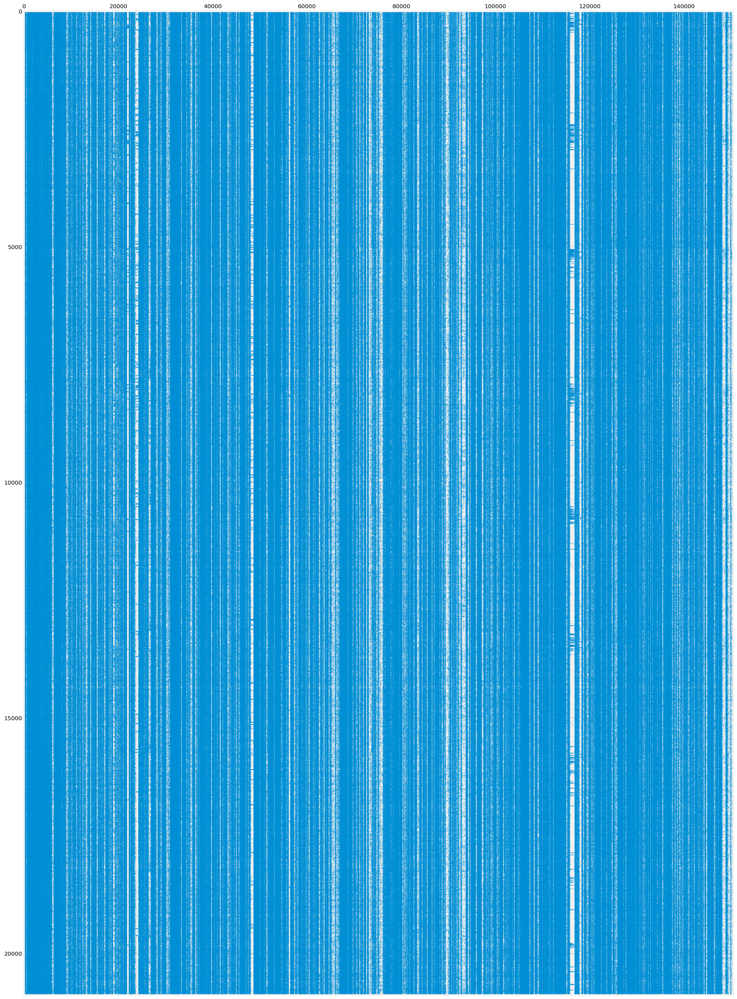

In [130]:
plt.figure(figsize=(20, 200))
plt.spy(cvec_mat, markersize=0.001, aspect=10)
plt.show()

In [2]:
#this plot shows how most words are used in almost all texts
# but also highlights that there are some appearing in less frequently which has the potential to explain differences

In [ ]:
all_words_df = cvec_mat.sum(axis=0)

In [ ]:
word_count_df = pd.DataFrame(all_words_df, columns=words).transpose().sort_values(by=0, ascending=False)

In [18]:
word_count_df.rename(columns={0:'frequency'}, inplace=True)

In [19]:
word_count_df.head(20)

,frequency
year,952687
quarter,928898
million,659925
think,646230
chief,635815
officer,635282
just,573844
analyst,504962
executive,469536
growth,420198


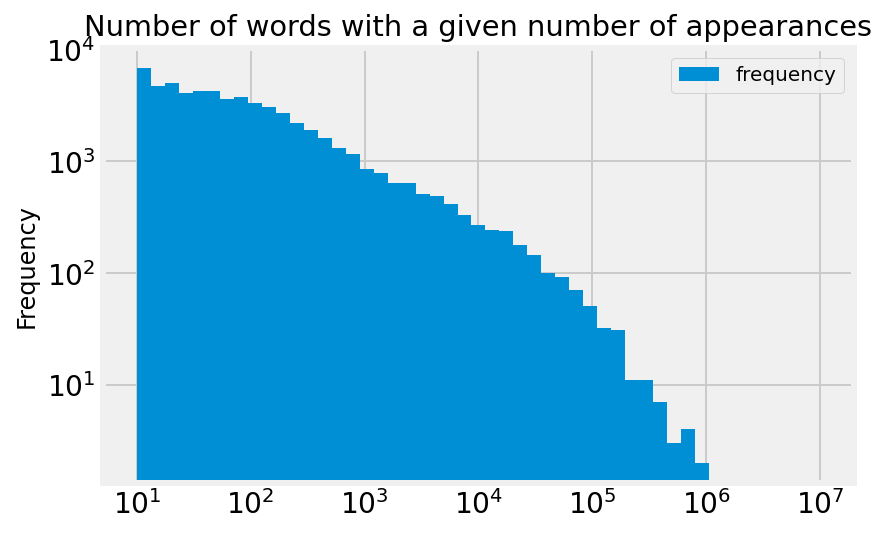

In [21]:
word_count_df.plot(kind='hist',
                       bins=np.logspace(1, 7, 50),
                       loglog=True,
                       title='Number of words with a given number of appearances',
                       fontsize=14)
plt.show()

In [144]:
UP_words_mat = cvec_mat[df['price_move']=="UP"].sum(axis=0)
UP_words_df=pd.DataFrame(UP_words_mat, columns=words).transpose().sort_values(by=0, ascending=False)

In [147]:
UP_words_df.iloc[:20,:]

,0
quarter,442990
year,441121
think,313211
chief,305182
officer,304965
million,302487
just,274812
analyst,242210
executive,225536
business,203281


In [148]:
DOWN_words_mat = cvec_mat[df['price_move']=="DOWN"].sum(axis=0)
DOWN_words_df = pd.DataFrame(DOWN_words_mat, columns=words).transpose().sort_values(by=0, ascending=False)

In [149]:
DOWN_words_df[:20]

,0
year,511566
quarter,485908
million,357438
think,333019
chief,330633
officer,330317
just,299032
analyst,262752
executive,244000
growth,221319


In [19]:
negative_word_list_df = pd.read_excel(r'SentimentWordLists_2018.xlsx', sheet_name='Negative', header = None)

In [21]:
negative_word_list_df.head(5)

,0
0,ABANDON
1,ABANDONED
2,ABANDONING
3,ABANDONMENT
4,ABANDONMENTS


In [22]:
negative_word_list_df.shape

(2355, 1)

In [23]:
negative_word_list = [negative_word_list_df.iloc[i, 0].lower() for i in range(len(negative_word_list_df))]

In [24]:
len(negative_word_list)

2355

In [25]:
negative_word_list[:20]

['abandon',
 'abandoned',
 'abandoning',
 'abandonment',
 'abandonments',
 'abandons',
 'abdicated',
 'abdicates',
 'abdicating',
 'abdication',
 'abdications',
 'aberrant',
 'aberration',
 'aberrational',
 'aberrations',
 'abetting',
 'abnormal',
 'abnormalities',
 'abnormality',
 'abnormally']

In [26]:
cvec_negative = CountVectorizer(vocabulary=negative_word_list)

In [27]:
cvec_negative.fit(df['text'])

CountVectorizer(vocabulary=['abandon', 'abandoned', 'abandoning', 'abandonment',
                            'abandonments', 'abandons', 'abdicated',
                            'abdicates', 'abdicating', 'abdication',
                            'abdications', 'aberrant', 'aberration',
                            'aberrational', 'aberrations', 'abetting',
                            'abnormal', 'abnormalities', 'abnormality',
                            'abnormally', 'abolish', 'abolished', 'abolishes',
                            'abolishing', 'abrogate', 'abrogated', 'abrogates',
                            'abrogating', 'abrogation', 'abrogations', ...])

In [28]:
cvec_negative_mat = cvec_negative.transform(df['text'])

In [45]:
negative_details_df = pd.DataFrame(cvec_negative_mat.toarray(),
                  columns=cvec_negative.get_feature_names())

In [52]:
negative_details_df.sum(axis=0).sort_values(ascending =False).head(20)

question         388930
questions        106383
decline           47741
loss              41918
closing           38356
negative          29448
against           23665
difficult         22989
challenges        21606
declined          20765
late              20601
closed            20282
challenging       18209
crisis            17894
critical          17794
losses            17641
restructuring     14954
volatility        13539
force             13343
declines          11638
dtype: int64

Counting negative word frequency for "UP" and "DOWN" texts

In [39]:
UP_negative_sum_df = negative_details_df[df['price_move']=="UP"].copy()

In [41]:
UP_negative_sum_df.shape

(9870, 2355)

In [115]:
UP_neg_frequent = pd.DataFrame(UP_negative_sum_df.sum(axis=0).sort_values(ascending =False))

In [120]:
UP_neg_frequent.reset_index(level=0, inplace=True)

In [55]:
DOWN_negative_sum_df = negative_details_df[df['price_move']=="DOWN"].copy()

In [117]:
DOWN_neg_frequent = pd.DataFrame(DOWN_negative_sum_df.sum(axis=0).sort_values(ascending =False))

In [119]:
DOWN_neg_frequent.reset_index(level=0, inplace=True)

Merging the different counts of each ord for comparison

In [121]:
word_comparison = pd.merge(UP_neg_frequent, DOWN_neg_frequent, on= 'index', how='outer')

In [124]:
word_comparison.rename(columns={'0_x':'UP_count',
                               '0_y': 'DOWN_count'}, inplace=True)

In [125]:
word_comparison['down-up_count'] = word_comparison['DOWN_count']- word_comparison['UP_count']

In [127]:
word_comparison.sort_values(by='down-up_count', ascending=False, inplace=True)

word frequency comparison between UP and DOWN texts

In [128]:
word_comparison.head()

,index,UP_count,DOWN_count,down-up_count
0,question,188041,200889,12848
1,questions,50488,55895,5407
3,loss,19355,22563,3208
4,closing,18081,20275,2194
2,decline,22840,24901,2061


"question" and "questions" checked separately as those words are commonly used in earnings call Q&A section

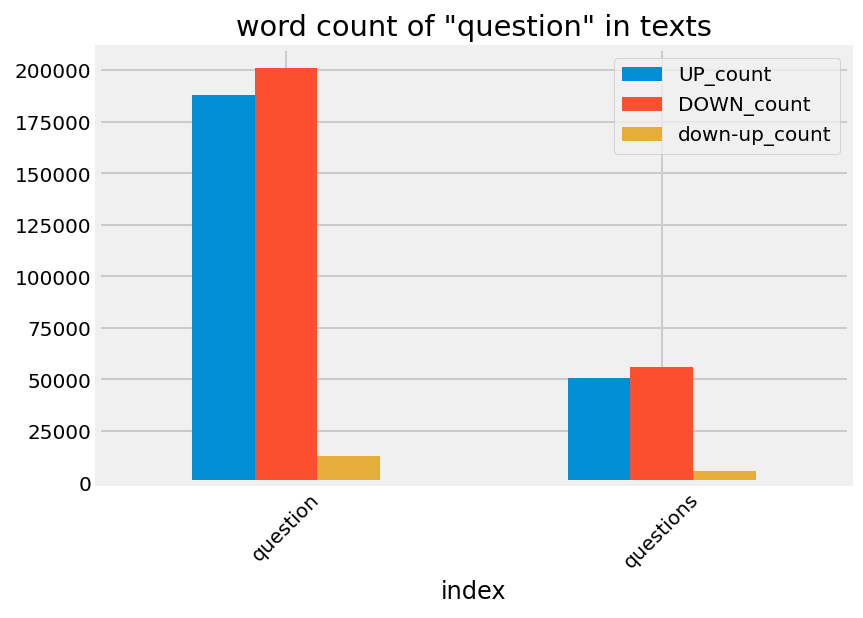

In [143]:
word_comparison[0:2].plot(x = 'index', kind = 'bar')
plt.title('word count of "question" in texts')
plt.xticks(rotation = 45)
plt.show()

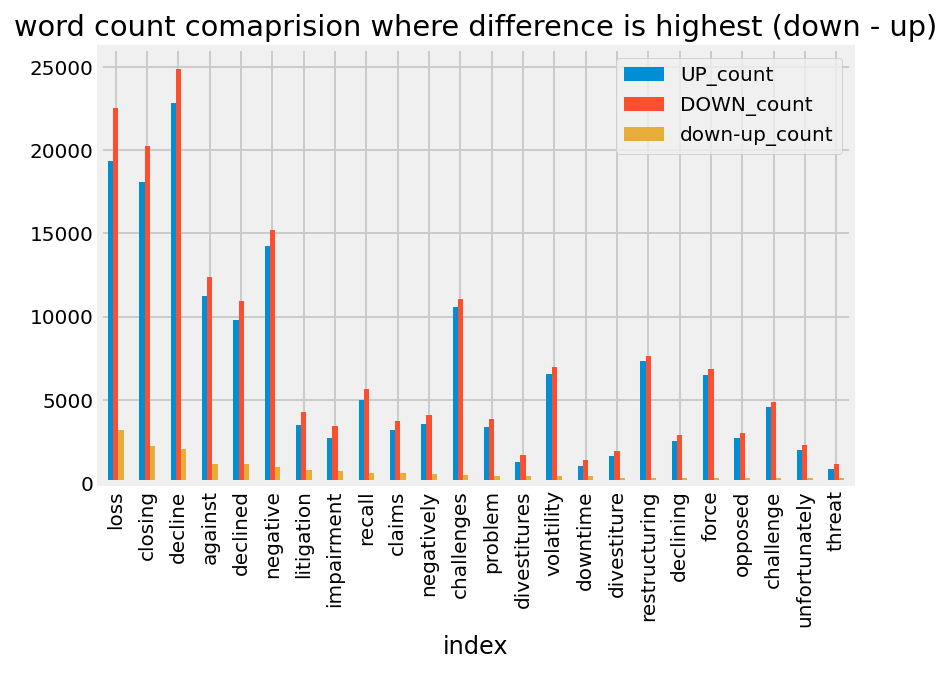

In [144]:
word_comparison[2:26].plot(x = 'index', kind = 'bar')
plt.title('word count comaprision where difference is highest (down - up) part 1')
plt.show()

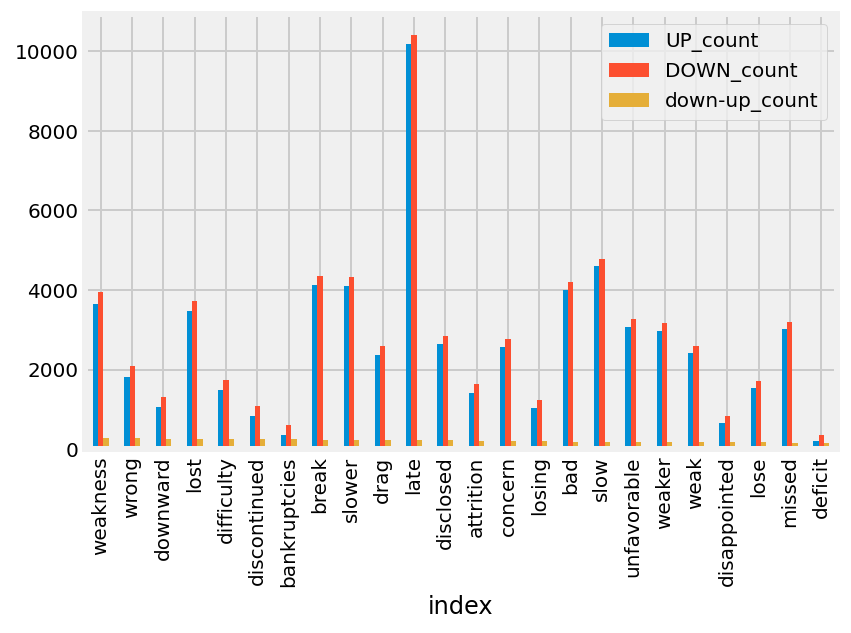

In [139]:
word_comparison[26:50].plot(x = 'index', kind = 'bar')
plt.title('word count comaprision where difference is highest (down - up) part 2')
plt.show()

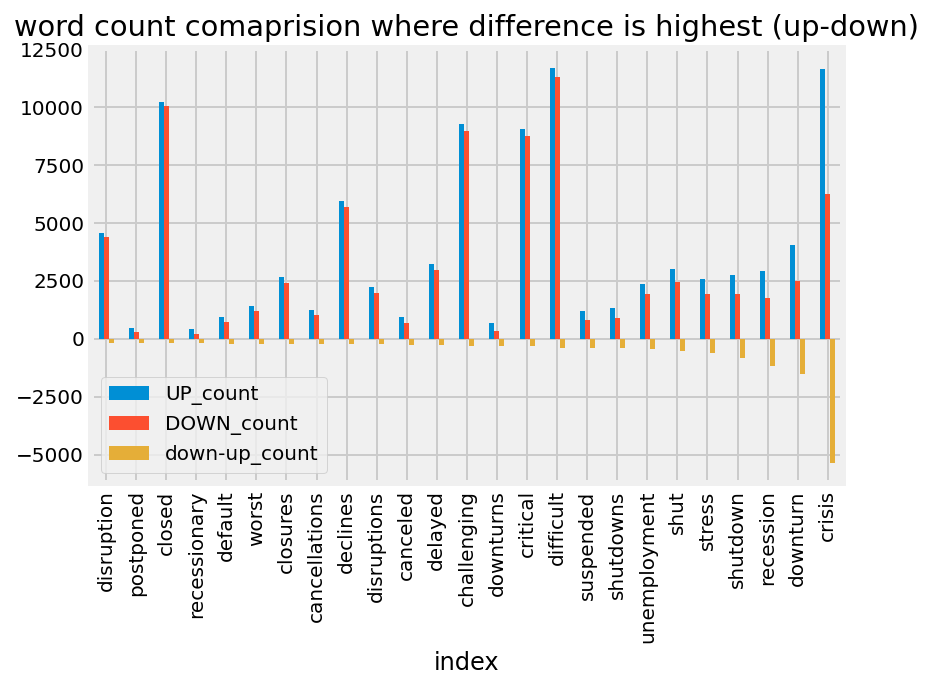

In [145]:
word_comparison[-25:].plot(x = 'index', kind = 'bar')
plt.title('word count comaprision where difference is highest (up-down)')
plt.show()

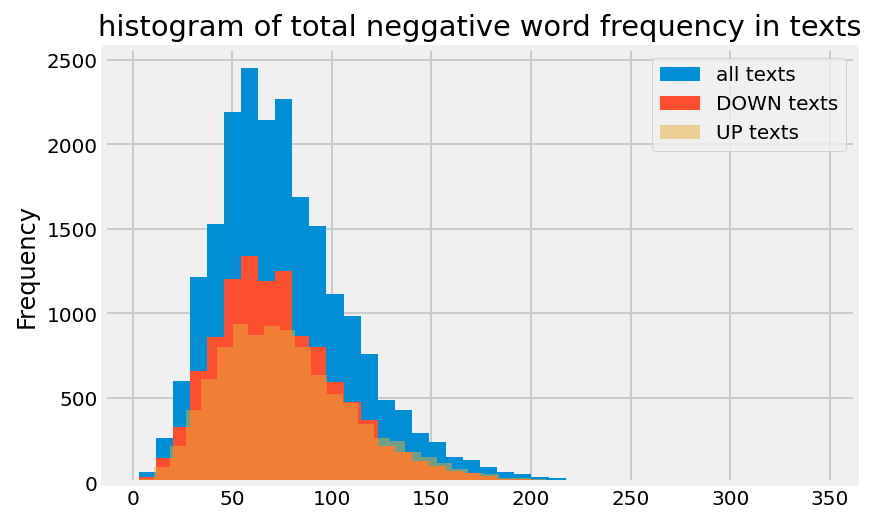

In [169]:
negative_details_df.sum(axis=1).plot(kind='hist',bins= 40, label = 'all texts')
negative_details_df.sum(axis=1)[df['price_move']=='DOWN'].plot(kind='hist', bins= 40, label='DOWN texts')
negative_details_df.sum(axis=1)[df['price_move']=='UP'].plot(kind='hist', bins=40, label='UP texts', alpha= 0.5)
plt.legend(loc='best')
plt.title('histogram of total neggative word frequency in texts')
plt.show()

# Pre-processing and Modelling

I will do a stratified train -test split and use 5 fold crossvalidation on my train set.
Iwill use roc_auc scoring as that I want to give equal importance. toboth classes and this scoring automatically adjust for the baseline.
I consider that my classes are fairly balanced at 53-47% split.
I will also check confusion matrix and classification report, especially where roc_auc scores are in the higher end of results.

I will experiment with different pre-processing:
- count vectorizer vs tf-idf vectorizer
- using all words vs using only negative words from my word collection
- using all word features of text vs limited by frequency (not using those occuring in 80% of texts, or not appearing in 1000 texts)

## Train - test plit

In [11]:
df_train, df_test, y_train, y_test = train_test_split(df, y, test_size = 0.2, shuffle=True, random_state=42, stratify = y)

In [15]:
df_train.price_move.value_counts(normalize=True)

DOWN    0.527214
UP      0.472786
Name: price_move, dtype: float64

In [16]:
df_test.price_move.value_counts(normalize=True)

DOWN    0.527299
UP      0.472701
Name: price_move, dtype: float64

In [17]:
y_train.value_counts(normalize=True)

DOWN    0.527214
UP      0.472786
Name: price_move, dtype: float64

In [18]:
y_test.value_counts(normalize=True)

DOWN    0.527299
UP      0.472701
Name: price_move, dtype: float64

## Count Vectorizer - All Words (not limited by frequency)

In [19]:
cvec = CountVectorizer(stop_words='english')
cvec.fit(df_train['text'])
cvec_mat = cvec.transform(df_train['text'])

words = cvec.get_feature_names()

# number of different words
print(len(words))

138884


In [20]:
X_train = cvec_mat

X_test = cvec.transform(df_test['text'])


Checking how many negative words were actually used

In [38]:
all_words = cvec.get_feature_names()

In [37]:
len(cvec_negative.get_feature_names())

2355

In [39]:
other_words = [word for word in all_words if word not in negative_word_list]

In [40]:
len(other_words)

136925

In [41]:
used_neg_words = [word for word in all_words if word not in other_words]

In [42]:
len(used_neg_words)

1959

### Logistic regression

In [28]:
lr_all_words.fit(X_train, y_train)
print(lr_all_words.score(X_train, y_train))
print(lr_all_words.score(X_test, y_test))

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:  5.2min finished


1.0
0.5596264367816092


In [34]:
all_words_scores = cross_val_score(lr_all_words, X_train, y_train, cv=5, scoring = 'roc_auc')

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:  5.4min finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:  3.4min finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:  3.8min finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:  5.0min finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:  3.3min finished


In [35]:
all_words_scores

array([0.56076812, 0.57268076, 0.57630369, 0.56220252, 0.56476813])

In [36]:
all_words_scores.mean()

0.5673446442926393

In [26]:
gs_logreg_dict1 = {'C': np.logspace(-4, 4, 10),
          'penalty': ['l1', 'l2'],
                 'solver': ['liblinear'],
          'fit_intercept': [True, False],
                'random_state' : [42]}

In [28]:
gs_logreg=GridSearchCV(estimator = lr_all_words, param_grid = gs_logreg_dict1, cv=5, scoring= 'roc_auc')

In [29]:
gs_logreg.fit(X_train, y_train)

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=50000, n_jobs=2, verbose=1),
             param_grid={'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                         'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2'], 'random_state': [42],
                         'solver': ['liblinear']},
             scoring='roc_auc')

In [31]:
gs_logreg.best_estimator_

LogisticRegression(C=0.005994842503189409, fit_intercept=False, max_iter=50000,
                   n_jobs=2, penalty='l1', random_state=42, solver='liblinear',
                   verbose=1)

In [32]:
gs_logreg.best_params_

{'C': 0.005994842503189409,
 'fit_intercept': False,
 'penalty': 'l1',
 'random_state': 42,
 'solver': 'liblinear'}

In [33]:
gs_logreg.best_score_

0.6291577654863397

In [55]:
joblib.dump(gs_logreg, 'gs_logreg_all_cvec_full.jlib')

['gs_logreg_all_cvec_full.jlib']

In [36]:
confusion_matrix(y_train, gs_logreg.predict(X_train))

array([[6185, 2620],
       [3578, 4318]])

In [37]:
confusion_matrix(y_test, gs_logreg.predict(X_test))

array([[1479,  723],
       [ 990,  984]])

In [38]:
print(classification_report(y_train, gs_logreg.predict(X_train)))

print(classification_report(y_test, gs_logreg.predict(X_test)))

              precision    recall  f1-score   support

        DOWN       0.63      0.70      0.67      8805
          UP       0.62      0.55      0.58      7896

    accuracy                           0.63     16701
   macro avg       0.63      0.62      0.62     16701
weighted avg       0.63      0.63      0.63     16701

              precision    recall  f1-score   support

        DOWN       0.60      0.67      0.63      2202
          UP       0.58      0.50      0.53      1974

    accuracy                           0.59      4176
   macro avg       0.59      0.59      0.58      4176
weighted avg       0.59      0.59      0.59      4176



### Random Forest

In [82]:
gs_dict2 = {'criterion': ['gini', 'entropy'],
            'max_features': ['auto', 'sqrt'],
    'max_depth': [6, 7, 8, 9, 10, 11, 20, None],
           'min_samples_leaf': [5, 10, 20],
           'min_samples_split': [2, 5, 10]}

In [63]:
model = RandomForestClassifier(random_state=42, verbose=1 )

In [119]:
random_rf_allwords=RandomizedSearchCV(estimator=model, param_distributions=gs_dict2, scoring='roc_auc', n_iter=100, verbose=1, n_jobs=2, random_state=42, return_train_score=True,)

In [120]:
random_rf_allwords.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  6.8min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed: 34.2min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed: 76.9min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed: 86.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.8s finished


RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42, verbose=1),
                   n_iter=100, n_jobs=2,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [6, 7, 8, 9, 10, 11, 20,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [5, 10, 20],
                                        'min_samples_split': [2, 5, 10]},
                   random_state=42, return_train_score=True, scoring='roc_auc',
                   verbose=1)

In [121]:
random_rf_allwords.best_score_

0.6159122333388467

In [221]:
joblib.dump(random_rf_allwords, 'random_rf_allwords_cvec_full.jlib')

['random_rf_allwords_cvec_full.jlib']

In [62]:
random_rf_allwords_reloaded = joblib.load(r'../part-03/random_rf_allwords_cvec_full.jlib')

In [122]:
random_rf_allwords.score(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.5s finished


0.9466951329808808

In [123]:
random_rf_allwords.score(X_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished


0.6168089339432606

In [124]:
confusion_matrix(y_train, random_rf_allwords.predict(X_train))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.5s finished


array([[8610,  195],
       [3791, 4105]])

In [125]:
confusion_matrix(y_test, random_rf_allwords.predict(X_test))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished


array([[1945,  257],
       [1508,  466]])

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.8s finished


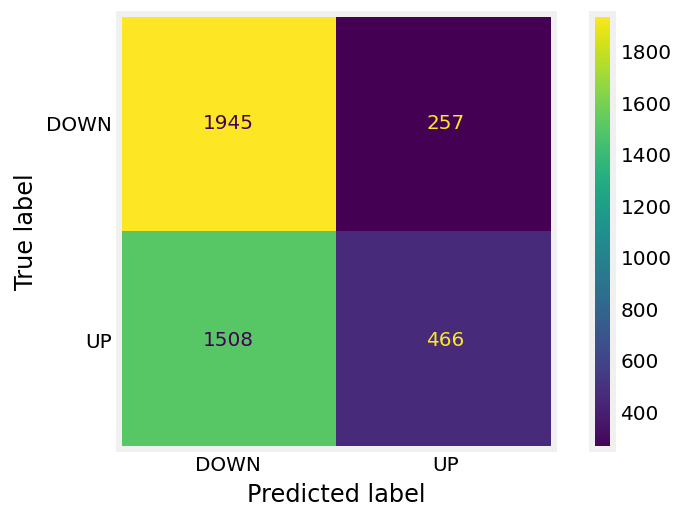

In [64]:
plot_confusion_matrix(random_rf_allwords_reloaded, X_test, y_test)
plt.grid(b=None)
plt.show()

In [66]:
print(classification_report(y_test, random_rf_allwords_reloaded.best_estimator_.predict(X_test)))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


              precision    recall  f1-score   support

        DOWN       0.56      0.88      0.69      2202
          UP       0.64      0.24      0.35      1974

    accuracy                           0.58      4176
   macro avg       0.60      0.56      0.52      4176
weighted avg       0.60      0.58      0.53      4176



[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished


In [204]:
gs_dict4={'min_samples_split': [3,4, 5, 6,7],
 'min_samples_leaf': [8,9, 10, 11,12],
 'max_features': ['auto'],
 'max_depth': [15, 20, 25],
 'criterion': ['entropy']}

In [205]:
gs_rf_all = GridSearchCV(estimator=model, param_grid=gs_dict4, cv=5, scoring='roc_auc', return_train_score=True)

In [206]:
gs_rf_all.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    6.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.8s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    6.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.5s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   11.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   12.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   13.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   12.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   13.1s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   11.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   11.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   15.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   15.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.7s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   15.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   15.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   13.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   15.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   14.0s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   15.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   13.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   14.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   15.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.2s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   15.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   15.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   14.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   14.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   13.6s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   21.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   20.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   20.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   10.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   20.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   16.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   17.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   17.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   16.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   18.3s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   13.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   21.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   19.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   18.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   18.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   16.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   16.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(random_state=42, verbose=1),
             param_grid={'criterion': ['entropy'], 'max_depth': [15, 20, 25],
                         'max_features': ['auto'],
                         'min_samples_leaf': [8, 9, 10, 11, 12],
                         'min_samples_split': [3, 4, 5, 6, 7]},
             return_train_score=True, scoring='roc_auc')

In [207]:
gs_rf_all.best_params_

{'criterion': 'entropy',
 'max_depth': 25,
 'max_features': 'auto',
 'min_samples_leaf': 12,
 'min_samples_split': 3}

In [208]:
gs_rf_all.best_score_

0.6135246143467527

In [209]:
gs_rf_all.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=25, min_samples_leaf=12,
                       min_samples_split=3, random_state=42, verbose=1)

I don't include further investigation to confusion matrix and classification report as the randomized search gave better cv score

### Support Vector Classifier

In [58]:
clf = svm.SVC(C=1 , kernel = 'rbf',  gamma='scale')

In [59]:
clf.fit(X_train, y_train)

SVC(C=1)

In [61]:
cross_val_score(clf, X_train, y_train, cv=5, scoring = 'roc_auc').mean()

0.6206500070303533

Since it ran for very long time, I did not spend more time tuning this model

## Count Vectorizer - Negative Words (not limited by frequency)

In [49]:
cvec_negative = CountVectorizer(vocabulary=negative_word_list)

In [50]:
cvec_negative.fit(df_train['text'])

CountVectorizer(vocabulary=['abandon', 'abandoned', 'abandoning', 'abandonment',
                            'abandonments', 'abandons', 'abdicated',
                            'abdicates', 'abdicating', 'abdication',
                            'abdications', 'aberrant', 'aberration',
                            'aberrational', 'aberrations', 'abetting',
                            'abnormal', 'abnormalities', 'abnormality',
                            'abnormally', 'abolish', 'abolished', 'abolishes',
                            'abolishing', 'abrogate', 'abrogated', 'abrogates',
                            'abrogating', 'abrogation', 'abrogations', ...])

In [51]:
X_neg_train = cvec_negative.transform(df_train['text'])

In [52]:
X_neg_test = cvec_negative.transform(df_test['text'])

### Logistic regression

In [40]:
lr_neg = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=50000, verbose = 1, n_jobs=2)

In [49]:
lr_neg.fit(X_neg_train, y_train)
print(lr_neg.score(X_neg_train, y_train))
print(lr_neg.score(X_neg_test, y_test))

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    5.1s finished


0.6387042692054368
0.5428639846743295


In [51]:
neg_words_scores = cross_val_score(lr_neg, X_neg_train, y_train, cv=skf, scoring='roc_auc')

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    5.0s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    3.8s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    3.7s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    3.4s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    3.9s finished


In [52]:
neg_words_scores

array([0.55127193, 0.53515458, 0.54376633, 0.5559237 , 0.55347856])

In [53]:
neg_words_scores.mean()

0.5479190216370228

In [41]:
gs_logreg_neg=GridSearchCV(estimator = lr_neg, param_grid = gs_logreg_dict1, cv=5, scoring= 'roc_auc')

In [53]:
gs_logreg_neg.fit(X_neg_train, y_train)

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got

[LibLinear][LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got

[LibLinear][LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got

[LibLinear][LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got

[LibLinear][LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=50000, n_jobs=2, verbose=1),
             param_grid={'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                         'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2'], 'random_state': [42],
                         'solver': ['liblinear']},
             scoring='roc_auc')

In [56]:
gs_logreg_neg.best_score_

0.5677555838912308

In [57]:
gs_logreg_neg.best_params_

{'C': 0.046415888336127774,
 'fit_intercept': True,
 'penalty': 'l1',
 'random_state': 42,
 'solver': 'liblinear'}

not investigated further as best score is inferior to logistic regression on "count vectorized - all words"

### Random Forest

In [151]:
rf_neg = RandomForestClassifier(n_jobs=2, verbose=1, random_state=42)

In [152]:
rf_neg.fit(X_neg_train, y_train)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    8.5s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:   18.1s finished


RandomForestClassifier(n_jobs=2, random_state=42, verbose=1)

In [153]:
print(rf_neg.score(X_neg_train, y_train))
print(rf_neg.score(X_neg_test, y_test))

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.6s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.9s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.1s finished


0.999580863421352
0.5531609195402298


In [155]:
rf_neg_scores = cross_val_score(rf_neg, X_neg_train, y_train, cv=5, scoring = 'roc_auc')

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   10.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:   18.9s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    8.6s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:   17.4s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    6.9s
[Parallel(n_jobs=2)]: Done 100

In [156]:
rf_neg_scores

array([0.56539797, 0.55439185, 0.55612473, 0.55406692, 0.56550538])

In [157]:
rf_neg_scores.mean()

0.5590973689079457

In [63]:
model = RandomForestClassifier(random_state=42, verbose=1 )

In [64]:
model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 1,
 'warm_start': False}

In [65]:
max_dep = [i for i in range (1,11)]

In [66]:
max_dep.append(None)

In [67]:
max_dep

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, None]

In [68]:
gs_dict1={
 'max_depth': max_dep
    }

In [72]:
gs_rf = GridSearchCV(estimator=model, param_grid=gs_dict1, cv=5, scoring='roc_auc', return_train_score=True)

In [73]:
gs_rf.fit(X_neg_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.6s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(random_state=42, verbose=1),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, None]},
             return_train_score=True, scoring='roc_auc')

In [74]:
gs_rfbest = gs_rf.best_estimator_
gs_rfbest

RandomForestClassifier(max_depth=9, random_state=42, verbose=1)

In [75]:
gs_rf.best_score_

0.5616569999364636

In [76]:
gs_rf.score(X_neg_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished


0.715784255514764

In [77]:
gs_rf.score(X_neg_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


0.5678564756917125

## Count Vectorizer - All words - limited by frequency

In [12]:

cvec = CountVectorizer(max_df=0.8, min_df = 1000, stop_words='english')
cvec.fit(df_train['text'])
cvec_mat = cvec.transform(df_train['text'])

words = cvec.get_feature_names()

# number of different words
print(len(words))

3430


In [29]:
all_words_df_train = cvec_mat.sum(axis=0)
word_count_df = pd.DataFrame(all_words_df_train, columns=words).transpose().sort_values(by=0, ascending=False)
word_count_df.head(20)

,0
customers,151699
vice,131162
2018,122002
morning,106899
product,104466
okay,99796
chairman,98185
billion,93274
yeah,92425
adjusted,88082


In [30]:
word_count_df.tail(20)

,0
recording,1200
strides,1197
fortunately,1194
foresee,1193
removed,1191
regularly,1184
accessed,1184
opposite,1176
mentioning,1175
generates,1174


In [35]:
word_count_df.shape

(3430, 1)

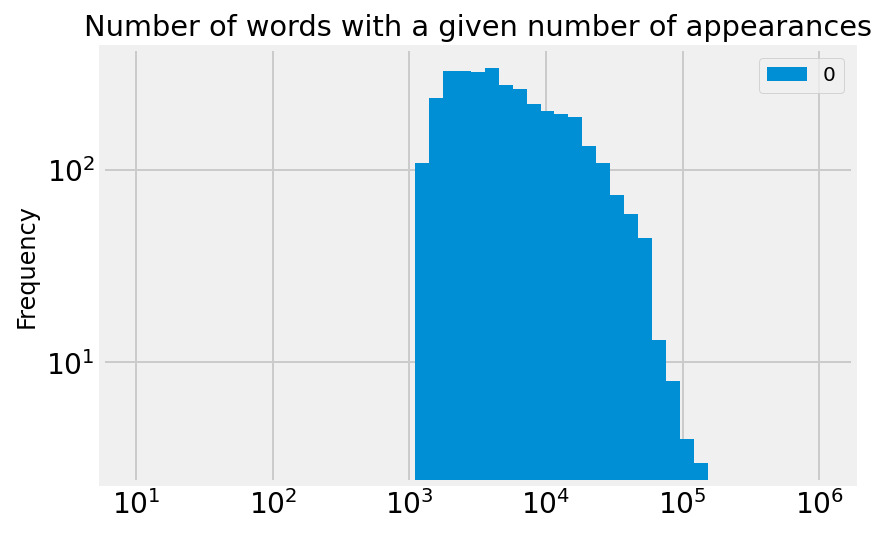

In [44]:
word_count_df.plot(kind='hist',
                       bins=np.logspace(1, 6, 50),
                       loglog=True,
                       title='Number of words with a given number of appearances',
                       fontsize=14)
plt.show()

In [30]:
X_train = cvec_mat

X_test = cvec.transform(df_test['text'])


### Logistic Regression

In [20]:
lr_all_words = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=50000, verbose = 1, n_jobs=2)

In [25]:
lr_all_words.fit(X_train, y_train)
print(lr_all_words.score(X_train, y_train))
print(lr_all_words.score(X_test, y_test))

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   33.2s finished


0.7359439554517694
0.571360153256705


In [35]:
all_words_scores

array([0.58383902, 0.60185772, 0.58572785, 0.57347231, 0.57929979])

In [36]:
all_words_scores.mean()

0.5848393368162752

In [207]:
gs_logreg_dict1={'C': np.logspace(-4, 4, 10),
          'penalty': ['l1', 'l2'],
                 'solver': ['liblinear'],
          'fit_intercept': [True, False],
                'random_state' : [42]}

In [208]:
gs_logreg_all = GridSearchCV(estimator=lr_all_words, 
                             param_grid = gs_logreg_dict1,
                            cv=5,
                             scoring='roc_auc',
                            return_train_score=True)

In [209]:
gs_logreg_all.fit(X_train, y_train)

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=LogisticRegression(max_iter=50000, n_jobs=2, verbose=1),
             param_grid={'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                         'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2'], 'random_state': [42],
                         'solver': ['liblinear']},
             return_train_score=True, scoring='roc_auc')

In [210]:
gs_logreg_all.best_estimator_

LogisticRegression(C=0.005994842503189409, max_iter=50000, n_jobs=2,
                   penalty='l1', random_state=42, solver='liblinear',
                   verbose=1)

In [211]:
gs_logreg_all.best_params_

{'C': 0.005994842503189409,
 'fit_intercept': True,
 'penalty': 'l1',
 'random_state': 42,
 'solver': 'liblinear'}

In [212]:
gs_logreg_all.best_score_

0.6276983454294243

In [242]:
joblib.dump(gs_logreg_all, 'gs_logreg_all_cvec_limit.jlib')

['gs_logreg_all_cvec_limit.jlib']

In [13]:
gs_logreg_all_reloaded = joblib.load(r'../part-03/gs_logreg_all_cvec_limit.jlib')

In [213]:
confusion_matrix(y_train, gs_logreg_all.predict(X_train))

array([[6269, 2536],
       [3844, 4052]])

In [214]:
confusion_matrix(y_test, gs_logreg_all.predict(X_test))

array([[1518,  684],
       [1037,  937]])

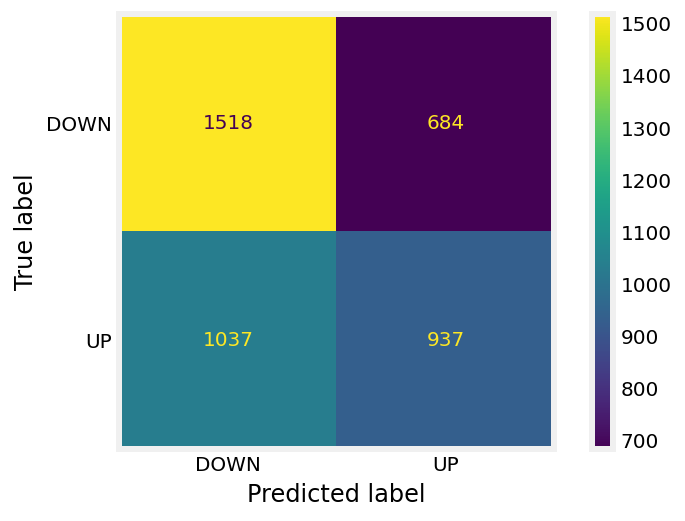

In [338]:
plot_confusion_matrix(gs_logreg_all_reloaded, X_test, y_test)
plt.grid(b=None)
plt.show()

In [215]:
print(classification_report(y_train, gs_logreg_all.predict(X_train)))

print(classification_report(y_test, gs_logreg_all.predict(X_test)))

              precision    recall  f1-score   support

        DOWN       0.62      0.71      0.66      8805
          UP       0.62      0.51      0.56      7896

    accuracy                           0.62     16701
   macro avg       0.62      0.61      0.61     16701
weighted avg       0.62      0.62      0.61     16701

              precision    recall  f1-score   support

        DOWN       0.59      0.69      0.64      2202
          UP       0.58      0.47      0.52      1974

    accuracy                           0.59      4176
   macro avg       0.59      0.58      0.58      4176
weighted avg       0.59      0.59      0.58      4176



#### Analysing coefficients - logistic regression

In [526]:
gs_logreg_coeftable=pd.DataFrame(list(zip(cvec.get_feature_names(), gs_logreg_all_reloaded.best_estimator_.coef_[0])), 
             columns=['feature', 'coef'])

In [527]:
gs_logreg_coeftable['abs_coef']=np.abs(gs_logreg_coeftable['coef'])

In [529]:
gs_logreg_coeftable.head(20)

,feature,coef,abs_coef
521,callfeb,-0.361699,0.361699
809,coronavirus,-0.088789,0.088789
732,congrats,0.072259,0.072259
43,2021,-0.044288,0.044288
1040,downturn,0.043274,0.043274
2860,shutdown,0.043242,0.043242
334,april,0.036364,0.036364
1916,march,0.029850,0.029850
2272,piper,-0.029407,0.029407
1727,jaffray,0.029300,0.029300


In [69]:
logregtoplot = gs_logreg_coeftable.sort_values(by = 'abs_coef', ascending=False).head(20).sort_values(by = 'abs_coef', ascending=True).copy()


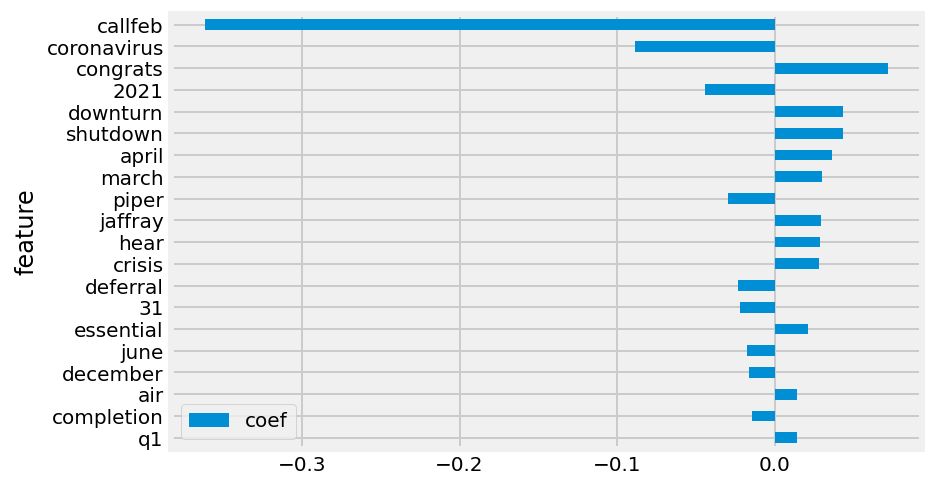

In [70]:
logregtoplot.plot(kind='barh', x='feature', y='coef')
plt.legend(loc = 'lower left')
plt.show()

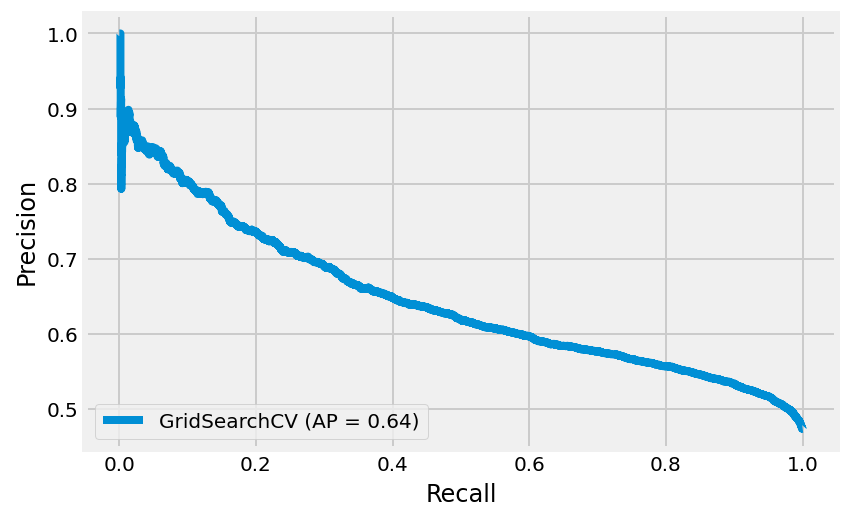

In [438]:
plot_precision_recall_curve(gs_logreg_all_reloaded, X_train, y_train)
plt.show()

saving prediction probabilities for future us

results_table and results_table_test is used at random forest 3.4.2.1

In [353]:
results_table2= pd.DataFrame(gs_logreg_all_reloaded.best_estimator_.predict_proba(X_train), columns=['logreg_Down_pp', 'logreg_Up_pp'], index=df_train.index)

In [367]:
results_table2_test= pd.DataFrame(gs_logreg_all_reloaded.best_estimator_.predict_proba(X_test), columns=['logreg_Down_pp', 'logreg_Up_pp'], index=df_test.index)

### Random Forest

In [139]:
model

RandomForestClassifier(random_state=42, verbose=1)

In [171]:
gs_dict2

{'criterion': ['gini', 'entropy'],
 'max_features': ['auto', 'sqrt'],
 'max_depth': [6, 7, 8, 9, 10, 11, 20, None],
 'min_samples_leaf': [5, 10, 20],
 'min_samples_split': [2, 5, 10]}

In [140]:
random_rf_allwords=RandomizedSearchCV(estimator=model, param_distributions=gs_dict2, scoring='roc_auc', n_iter=100, verbose=1, n_jobs=2, random_state=42, return_train_score=True,)

In [141]:
random_rf_allwords.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  9.7min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed: 57.4min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed: 150.4min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed: 169.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.1min finished


RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42, verbose=1),
                   n_iter=100, n_jobs=2,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [6, 7, 8, 9, 10, 11, 20,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [5, 10, 20],
                                        'min_samples_split': [2, 5, 10]},
                   random_state=42, return_train_score=True, scoring='roc_auc',
                   verbose=1)

In [142]:
random_rf_allwords.best_score_

0.6435077857015363

In [143]:
random_rf_allwords.score(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    4.1s finished


0.98162442674703

In [144]:
random_rf_allwords.score(X_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.1s finished


0.658958605375789

In [147]:
random_rf_allwords.best_params_

{'min_samples_split': 5,
 'min_samples_leaf': 20,
 'max_features': 'sqrt',
 'max_depth': None,
 'criterion': 'entropy'}

In [172]:
gs_dict4={'min_samples_split': [3,4, 5, 6,7],
 'min_samples_leaf': [18,19,20,21,22,30],
 'max_features': ['sqrt'],
 'max_depth': [None],
 'criterion': ['entropy']}

In [173]:
gs_rf_all = GridSearchCV(estimator=model, param_grid=gs_dict4, cv=skf, scoring='roc_auc', return_train_score=True)

In [174]:
gs_rf_all.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   46.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   50.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   48.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   52.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   49.1s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   42.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   46.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   39.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   39.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   39.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   40.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   44.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   40.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.1min finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   44.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   40.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   30.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   34.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   28.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   28.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(random_state=42, verbose=1),
             param_grid={'criterion': ['entropy'], 'max_depth': [None],
                         'max_features': ['sqrt'],
                         'min_samples_leaf': [18, 19, 20, 21, 22, 30],
                         'min_samples_split': [3, 4, 5, 6, 7]},
             return_train_score=True, scoring='roc_auc')

In [175]:
gs_rf_all.best_params_

{'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'sqrt',
 'min_samples_leaf': 21,
 'min_samples_split': 3}

In [ ]:
#Best score (word features only)

In [176]:
gs_rf_all.best_score_

0.6448730519209909

In [238]:
joblib.dump(gs_rf_all, 'gs_rf_all_cvec_limit.jlib')

['gs_rf_all_cvec_limit.jlib']

In [58]:
gs_rf_all_reloaded = joblib.load('gs_rf_all_cvec_limit.jlib')

In [178]:
gs_rf_all.score(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.2s finished


0.9796928137910959

In [179]:
gs_rf_all.score(X_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


0.6523729924071973

In [180]:
confusion_matrix(y_train, gs_rf_all.predict(X_train))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.2s finished


array([[8494,  311],
       [1128, 6768]])

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.3s finished


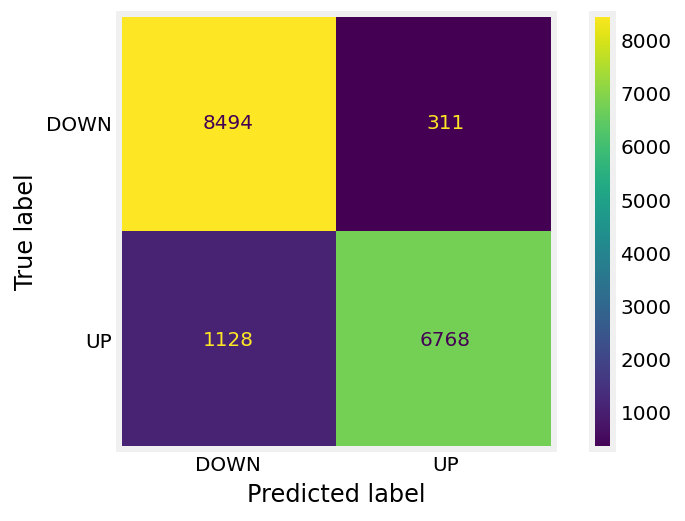

In [181]:
plot_confusion_matrix(gs_rf_all.best_estimator_, X_train, y_train)
plt.grid(b=None)
plt.show()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


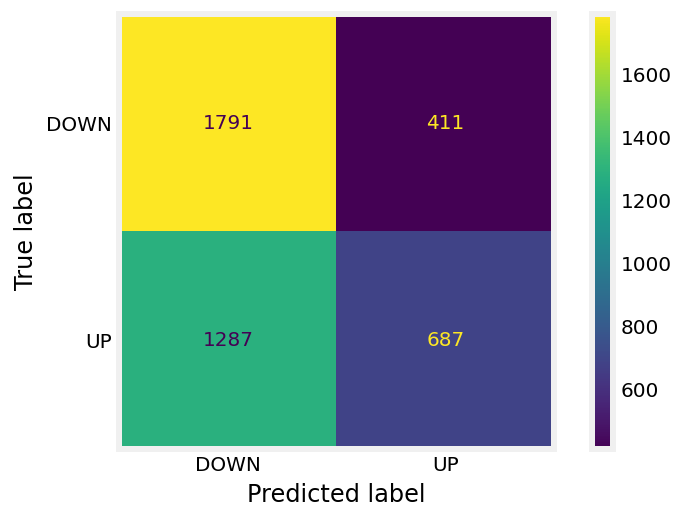

In [182]:
plot_confusion_matrix(gs_rf_all.best_estimator_, X_test, y_test)
plt.grid(b=None)
plt.show()

In [183]:
print(classification_report(y_train, gs_rf_all.best_estimator_.predict(X_train)))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.3s finished


              precision    recall  f1-score   support

        DOWN       0.88      0.96      0.92      8805
          UP       0.96      0.86      0.90      7896

    accuracy                           0.91     16701
   macro avg       0.92      0.91      0.91     16701
weighted avg       0.92      0.91      0.91     16701



In [184]:
print(classification_report(y_test, gs_rf_all.best_estimator_.predict(X_test)))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


              precision    recall  f1-score   support

        DOWN       0.58      0.81      0.68      2202
          UP       0.63      0.35      0.45      1974

    accuracy                           0.59      4176
   macro avg       0.60      0.58      0.56      4176
weighted avg       0.60      0.59      0.57      4176



[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


#### Analysing outcomes and feature importance of random forest model

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.2s finished


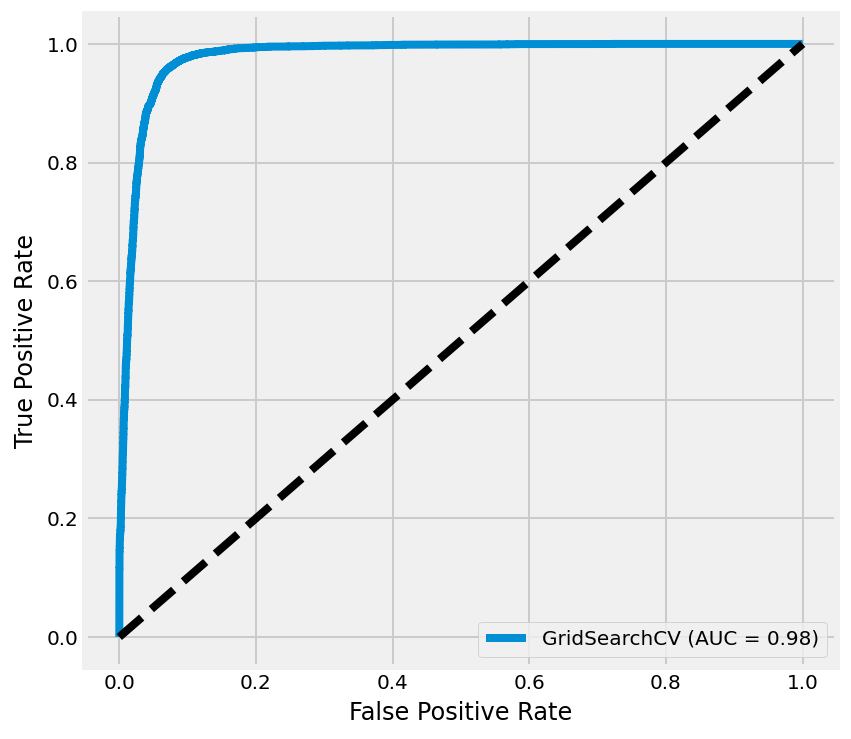

In [205]:
fig, ax = plt.subplots(figsize=(6, 6))
plot_roc_curve(gs_rf_all, X_train, y_train, ax=ax)
ax.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.show()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished


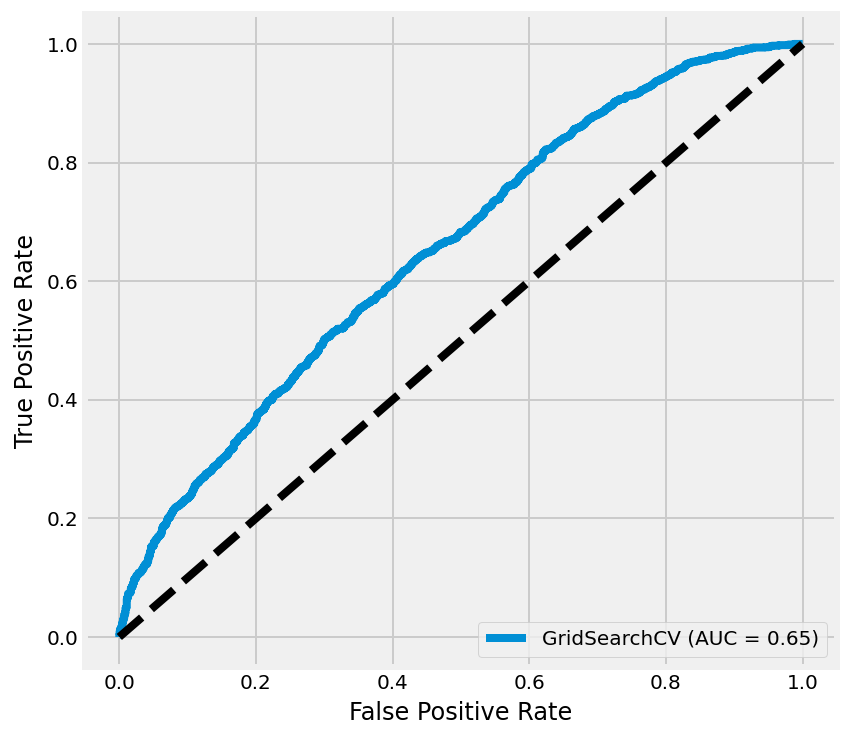

In [206]:
fig, ax = plt.subplots(figsize=(6, 6))
plot_roc_curve(gs_rf_all, X_test, y_test, ax=ax)
ax.plot([0, 1], [0, 1], 'k--', linewidth=4)
plt.show()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.9s finished


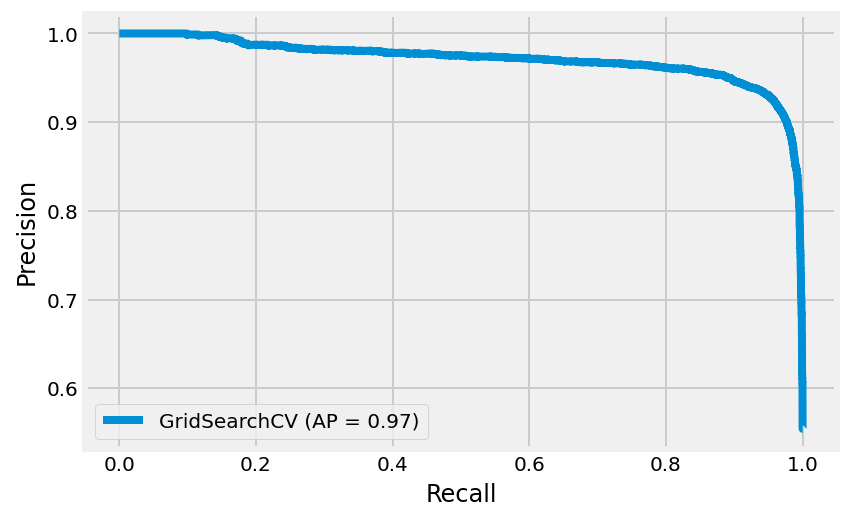

In [436]:
plot_precision_recall_curve(gs_rf_all_reloaded, X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.1s finished


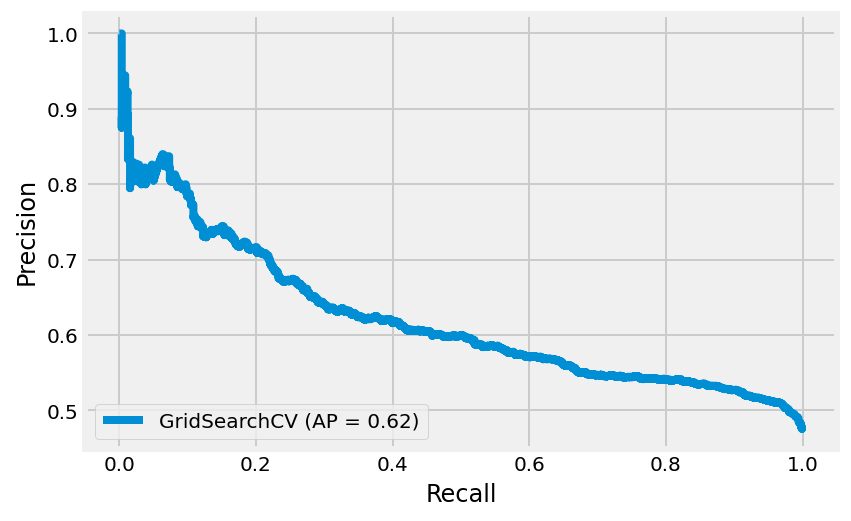

In [531]:
plot_precision_recall_curve(gs_rf_all_reloaded, X_test, y_test)
plt.show()

In [221]:
gs_rf_all_featurestable=pd.DataFrame(list(zip(cvec.get_feature_names(), gs_rf_all.best_estimator_.feature_importances_)), 
             columns=['feature', 'coef'])

gs_rf_all_featurestable.sort_values(by = 'coef' ,ascending=False, inplace=True)

gs_rf_all_featurestable.head(20)

,feature,coef
521,callfeb,0.017326
809,coronavirus,0.009463
524,callmay,0.008756
1916,march,0.007261
334,april,0.004881
43,2021,0.004133
42,2018,0.004081
2191,pandemic,0.003313
41,2017,0.003272
840,crisis,0.003242


I had to recreate the table above as I closed the notebook before plotting, and the features table was not saved

In [66]:
gs_rf_all_featurestable2=pd.DataFrame(list(zip(cvec.get_feature_names(), gs_rf_all_reloaded.best_estimator_.feature_importances_)), 
             columns=['feature', 'importance'])

gs_rf_all_featurestable2.sort_values(by = 'importance' ,ascending=False, inplace=True)

rftoplot=gs_rf_all_featurestable2.head(20).sort_values(by= 'importance', ascending= True).copy()

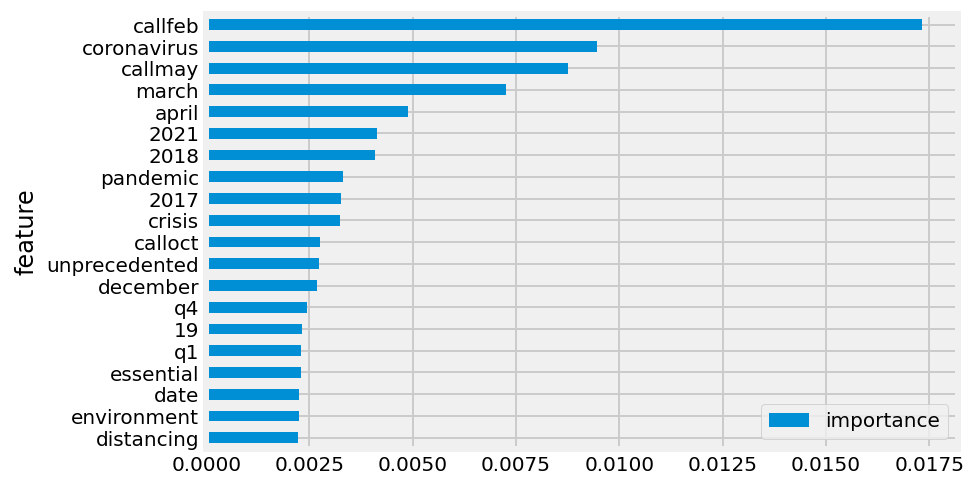

In [67]:
rftoplot.plot(kind = 'barh', x= 'feature', y='importance')
plt.show()

In [344]:
gs_rf_all_reloaded.best_estimator_.predict_proba(X_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.5s finished


array([[0.67090494, 0.32909506],
       [0.44694676, 0.55305324],
       [0.49940418, 0.50059582],
       ...,
       [0.58881079, 0.41118921],
       [0.45438868, 0.54561132],
       [0.56055594, 0.43944406]])

In [345]:
gs_rf_all_reloaded.best_estimator_.predict(X_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.8s finished


array(['DOWN', 'UP', 'UP', ..., 'DOWN', 'UP', 'DOWN'], dtype=object)

Saving prediction probabilities for further use

In [349]:
results_table = pd.DataFrame(gs_rf_all_reloaded.best_estimator_.predict_proba(X_train), columns=['rf_Down_pp','rf_Up_pp'], index=df_train.index)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.6s finished


In [350]:
results_table.head()

,rf_Down_pp,rf_Up_pp
5924,0.670905,0.329095
3014,0.446947,0.553053
1315,0.499404,0.500596
2251,0.415430,0.584570
20590,0.467142,0.532858


In [369]:
results_table_test = pd.DataFrame(gs_rf_all_reloaded.best_estimator_.predict_proba(X_test), columns=['rf_Down_pp','rf_Up_pp'], index=df_test.index)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.3s finished


### KNN

In [227]:
knn_all = KNeighborsClassifier(n_neighbors=3 )

knn_all.fit(X_train, y_train)

knn_all_score = cross_val_score(knn_all, X_train, y_train, cv=skf, scoring = 'roc_auc', verbose=1 )

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  3.3min finished


In [228]:
knn_all_score.mean()

0.4790943939078568

In [229]:
knn_all.score(X_train, y_train)

0.7346266690617328

In [230]:
knn_all.score(X_test, y_test)

0.49473180076628354

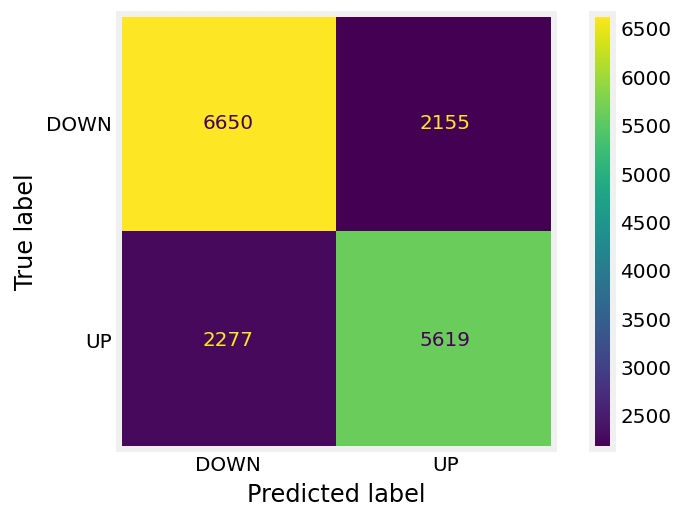

In [231]:
plot_confusion_matrix(knn_all, X_train, y_train)
plt.grid(b=None)
plt.show()

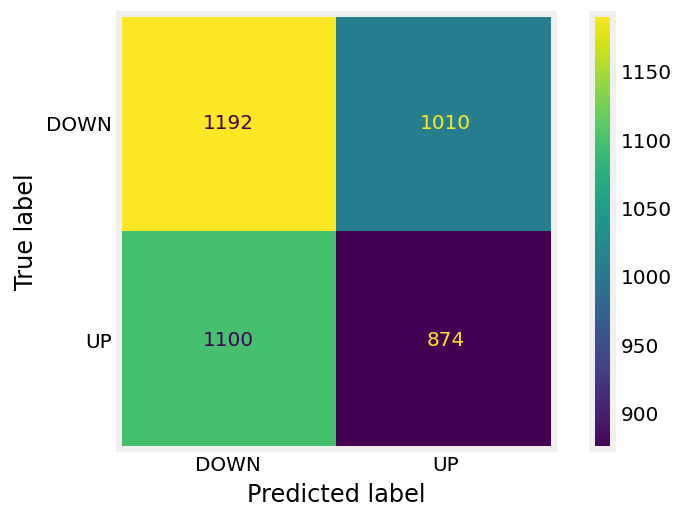

In [232]:
plot_confusion_matrix(knn_all, X_test, y_test)
plt.grid(b=None)
plt.show()

In [233]:
print(classification_report(y_train, knn_all.predict(X_train)))

print(classification_report(y_test, knn_all.predict(X_test)))

              precision    recall  f1-score   support

        DOWN       0.74      0.76      0.75      8805
          UP       0.72      0.71      0.72      7896

    accuracy                           0.73     16701
   macro avg       0.73      0.73      0.73     16701
weighted avg       0.73      0.73      0.73     16701

              precision    recall  f1-score   support

        DOWN       0.52      0.54      0.53      2202
          UP       0.46      0.44      0.45      1974

    accuracy                           0.49      4176
   macro avg       0.49      0.49      0.49      4176
weighted avg       0.49      0.49      0.49      4176



not investigated further as cv scores are inferior to previous models

### Support Vector Classifier

In [52]:
clf_linear_all = svm.LinearSVC(loss='hinge', max_iter=5000, class_weight='balanced')

In [53]:
clf_linear_all.fit(X_train, y_train)

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


LinearSVC(class_weight='balanced', loss='hinge', max_iter=5000)

In [54]:
cross_val_score(clf_linear_all, X_train, y_train, cv=5, scoring = 'roc_auc').mean()

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_b

0.5672013942019039

not investigated further as mean cv score was inferior to other models, and it took very loong to run

### Neural network - multi-layer perceptron classifier

In [ ]:
clf = MLPClassifier(solver='adam',
                    alpha=10**(0),
                    hidden_layer_sizes=(8, 8, 8, 8, 8),
                    activation='relu',
                    random_state=42,
                    batch_size=50,
                    max_iter=500)
# other parameters: learning rate, early stopping (batch-like processing), n_iter_no_change, 
clf.fit(X_train, y_train)


In [155]:
gs_nn_dict = {'hidden_layer_sizes': [(4,4), (10, 10,10), (42,42,42,42,42,42,42), (3,3,3,3), (100,50,100)],
             'learning_rate': [0.1, 0.01, 'constant'],
              'alpha': [0.0001, 0.05, 1],
             'max_iter' : [50000],
             'n_iter_no_change' : [100]}

In [156]:
gs_nn = GridSearchCV(clf, gs_nn_dict, scoring='roc_auc', n_jobs=-1, verbose=1, cv=5 )

In [157]:
gs_nn.fit(X_train, y_train)

Fitting 5 folds for each of 45 candidates, totalling 225 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed: 103.9min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 385.9min
[Parallel(n_jobs=-1)]: Done 225 out of 225 | elapsed: 535.7min finished


GridSearchCV(cv=5,
             estimator=MLPClassifier(alpha=1, batch_size=50,
                                     hidden_layer_sizes=(8, 8, 8, 8, 8),
                                     max_iter=500, random_state=42),
             n_jobs=-1,
             param_grid={'alpha': [0.0001, 0.05, 1],
                         'hidden_layer_sizes': [(4, 4), (10, 10, 10),
                                                (42, 42, 42, 42, 42, 42, 42),
                                                (3, 3, 3, 3), (100, 50, 100)],
                         'learning_rate': [0.1, 0.01, 'constant'],
                         'max_iter': [50000], 'n_iter_no_change': [100]},
             scoring='roc_auc', verbose=1)

In [158]:
gs_nn.best_score_

0.5948387507979567

In [159]:
gs_nn.best_params_

{'alpha': 0.0001,
 'hidden_layer_sizes': (100, 50, 100),
 'learning_rate': 'constant',
 'max_iter': 50000,
 'n_iter_no_change': 100}

In [160]:
joblib.dump(gs_nn, r'gs_nn')

['gs_nn']

due to lack of time, long run time, and inferior mean cv score, this model was not further investigated

## Count Vectorizer - negative words - limited by frequency

In [22]:
cvec_negative = CountVectorizer(max_df=0.8, min_df=1000, vocabulary=negative_word_list)

In [23]:
cvec_negative.fit(df_train['text'])

CountVectorizer(max_df=0.8, min_df=1000,
                vocabulary=['abandon', 'abandoned', 'abandoning', 'abandonment',
                            'abandonments', 'abandons', 'abdicated',
                            'abdicates', 'abdicating', 'abdication',
                            'abdications', 'aberrant', 'aberration',
                            'aberrational', 'aberrations', 'abetting',
                            'abnormal', 'abnormalities', 'abnormality',
                            'abnormally', 'abolish', 'abolished', 'abolishes',
                            'abolishing', 'abrogate', 'abrogated', 'abrogates',
                            'abrogating', 'abrogation', 'abrogations', ...])

In [58]:
X_neg_train = cvec_negative.transform(df_train['text'])

In [59]:
X_neg_test = cvec_negative.transform(df_test['text'])

In [50]:
limited_word_list = cvec.get_feature_names() #this is taking countvectorizer features from 3.4

In [51]:
len(limited_word_list)

3430

In [52]:
other_words=[word for word in limited_word_list if word not in negative_word_list]

In [53]:
used_neg_words=[word for word in limited_word_list if word not in other_words]

In [54]:
len(used_neg_words)

105

### Logistic Regression

In [38]:
lr_neg = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=50000, verbose = 1, n_jobs=2)

In [49]:
lr_neg.fit(X_neg_train, y_train)
print(lr_neg.score(X_neg_train, y_train))
print(lr_neg.score(X_neg_test, y_test))

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    6.7s finished


0.6387042692054368
0.5428639846743295


In [51]:
neg_words_scores = cross_val_score(lr_neg, X_neg_train, y_train, cv=5, scoring='roc_auc')

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    4.8s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    4.5s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    4.7s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    4.6s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    5.1s finished


In [52]:
neg_words_scores

array([0.55127193, 0.53515458, 0.54376633, 0.5559237 , 0.55347856])

In [53]:
neg_words_scores.mean()

0.5479190216370228

In [40]:
gs_lr_neg_dict = {'C': np.logspace(-4, 4, 10),
          'penalty': ['l1', 'l2'],
                 'solver': ['liblinear'],
          'fit_intercept': [True, False],
                'random_state' : [42]}

In [41]:
gs_lr_neg= GridSearchCV(estimator=lr_neg, param_grid=gs_lr_neg_dict, cv=5, scoring='roc_auc', return_train_score=True)

In [45]:
gs_lr_neg.fit(X_neg_train, y_train)

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=50000, n_jobs=2, verbose=1),
             param_grid={'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                         'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2'], 'random_state': [42],
                         'solver': ['liblinear']},
             return_train_score=True, scoring='roc_auc')

In [46]:
gs_lr_neg.best_score_

0.5677555838912308

In [47]:
gs_lr_neg.best_params_

{'C': 0.046415888336127774,
 'fit_intercept': True,
 'penalty': 'l1',
 'random_state': 42,
 'solver': 'liblinear'}

In [50]:
joblib.dump(gs_lr_neg, 'gs_lr_neg_cvec_limit.jlib')

['gs_lr_neg_cvec_limit.jlib']

not investigated further as cv score is inferior to tuned logistic regression in 3.4.1

### Random Forest

In [59]:
rf_neg = RandomForestClassifier(n_jobs=2, verbose=1, random_state=42)

In [60]:
rf_neg.fit(X_neg_train, y_train)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    8.8s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:   19.0s finished


RandomForestClassifier(n_jobs=2, random_state=42, verbose=1)

In [61]:
print(rf_neg.score(X_neg_train, y_train))
print(rf_neg.score(X_neg_test, y_test))

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.3s


0.999580863421352
0.5531609195402298


[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.1s finished


In [62]:
print(classification_report(y_test, rf_neg.predict(
    X_neg_test)))

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.2s finished


              precision    recall  f1-score   support

        DOWN       0.56      0.73      0.63      2202
          UP       0.54      0.36      0.43      1974

    accuracy                           0.55      4176
   macro avg       0.55      0.54      0.53      4176
weighted avg       0.55      0.55      0.54      4176



In [63]:
rf_neg_scores = cross_val_score(rf_neg, X_neg_train, y_train, cv=5, scoring = 'roc_auc')

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    6.6s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:   14.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    6.5s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:   14.5s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    6.5s
[Parallel(n_jobs=2)]: Done 100

In [64]:
rf_neg_scores

array([0.56539797, 0.55439185, 0.55612473, 0.55406692, 0.56550538])

In [65]:
rf_neg_scores.mean()

0.5590973689079457

In [71]:
model = RandomForestClassifier(random_state=42, verbose=1 )

In [72]:
model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 1,
 'warm_start': False}

In [75]:
max_dep

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, None]

In [76]:
gs_dict1={
 'max_depth': max_dep
    }

In [78]:
gs_rf = GridSearchCV(estimator=model, param_grid=gs_dict1, cv=5, scoring='roc_auc', return_train_score=True)

In [81]:
gs_rf.fit(X_neg_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(random_state=42, verbose=1),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, None]},
             return_train_score=True, scoring='roc_auc')

In [82]:
gs_rfbest = gs_rf.best_estimator_
gs_rfbest

RandomForestClassifier(max_depth=9, random_state=42, verbose=1)

In [83]:
gs_rf.best_score_

0.5616569999364636

In [84]:
gs_rf.score(X_neg_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished


0.715784255514764

In [85]:
gs_rf.score(X_neg_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


0.5678564756917125

not investigated further as cv score is inferior to model tuned in 3.4.1

## Count Vectorizer - positive words

In [55]:
positive_word_list_df = pd.read_excel(r'/Users/ritatolgyesi/Fileok/Raw_pages/SentimentWordLists_2018.xlsx', sheet_name='Positive', header = None)

In [56]:
positive_word_list_df.shape

(354, 1)

In [64]:
positive_word_list = [positive_word_list_df.iloc[i, 0].lower() for i in range(len(positive_word_list_df))]

In [65]:
len(positive_word_list)

354

In [66]:
cvec_positive = CountVectorizer(max_df=0.8, min_df=1000, vocabulary=positive_word_list)

In [67]:
cvec_positive.fit(df_train['text'])

CountVectorizer(max_df=0.8, min_df=1000,
                vocabulary=['able', 'abundance', 'abundant', 'acclaimed',
                            'accomplish', 'accomplished', 'accomplishes',
                            'accomplishing', 'accomplishment',
                            'accomplishments', 'achieve', 'achieved',
                            'achievement', 'achievements', 'achieves',
                            'achieving', 'adequately', 'advancement',
                            'advancements', 'advances', 'advancing',
                            'advantage', 'advantaged', 'advantageous',
                            'advantageously', 'advantages', 'alliance',
                            'alliances', 'assure', 'assured', ...])

In [68]:
X_pos_train = cvec_positive.transform(df_train['text'])

In [69]:
X_pos_test = cvec_positive.transform(df_test['text'])

In [70]:
non_pos_words = [word for word in limited_word_list if word not in positive_word_list]

In [71]:
used_pos_words=[word for word in limited_word_list if word not in non_pos_words]

## Sentiment Score analysis based on limited frequency

train set pre-processing

In [60]:
X_neg_sum_train = X_neg_train.sum(axis=1)

In [61]:
X_neg_sum_train.shape

(16701, 1)

In [62]:
sentiment_score_df = pd.DataFrame(X_neg_sum_train, columns = ['sum_neg_word'], index=df_train.index)

In [235]:
sentiment_score_df.head()

,sum_neg_word
5924,55
3014,191
1315,117
2251,172
20590,108


In [75]:
X_pos_sum_train = X_pos_train.sum(axis=1)

In [76]:
sentiment_score_df['sum_pos_word'] = pd.DataFrame(X_pos_sum_train, index=df_train.index)

In [77]:
X_all_sum_train = X_train.sum(axis=1)

In [78]:
sentiment_score_df['sum_all_word'] = pd.DataFrame(X_all_sum_train, index=df_train.index)

In [239]:
sentiment_score_df.head()

,sum_neg_word,sum_pos_word,sum_all_word
5924,55,85,1369
3014,191,101,2481
1315,117,172,2417
2251,172,153,3078
20590,108,259,2991


test set preparation

In [79]:
X_neg_sum_test = X_neg_test.sum(axis=1)

In [80]:
sentiment_score_df_test = pd.DataFrame(X_neg_sum_test, columns = ['sum_neg_word'], index=df_test.index)

In [81]:
X_pos_sum_test = X_pos_test.sum(axis=1)

In [82]:
sentiment_score_df_test['sum_pos_word'] = pd.DataFrame(X_pos_sum_test, index = df_test.index)

In [83]:
X_all_sum_test = X_test.sum(axis=1)

In [84]:
sentiment_score_df_test['sum_all_word'] = pd.DataFrame(X_all_sum_test, index = df_test.index)

In [85]:
sentiment_score_df.head()

,sum_neg_word,sum_pos_word,sum_all_word
5924,55,85,1369
3014,191,101,2481
1315,117,172,2417
2251,172,153,3078
20590,108,259,2991


In [86]:
sentiment_score_df_test.head()

,sum_neg_word,sum_pos_word,sum_all_word
12698,135,142,2453
10467,113,36,1647
16628,108,189,2790
14723,24,50,737
18384,53,35,1111


In [87]:
sentiment_score_df.shape

(16701, 3)

In [88]:
sentiment_score_df_test.shape

(4176, 3)

### Logisitc regression - equal weight to count of negative, positive and all words

In [104]:
sent_logreg =LogisticRegression()

In [105]:
sent_logreg.fit(sentiment_score_df, y_train)

LogisticRegression()

In [106]:
sent_logreg.score(sentiment_score_df, y_train)

0.5435003891982516

In [110]:
cross_val_score(sent_logreg, sentiment_score_df, y_train, scoring='roc_auc').mean()

0.5348499665184742

In [111]:
sent_logreg.score(sentiment_score_df_test, y_test)

0.54477969348659

mean cross validated scores are inferior to previous models, so not investigated further

### Logisitc regression - equal weight to count of negative and count of positive words¶

In [112]:
sent_logreg2 =LogisticRegression()

In [117]:
sent_logreg2.fit(sentiment_score_df.iloc[:, :2], y_train)

LogisticRegression()

In [118]:
cross_val_score(sent_logreg2, sentiment_score_df.iloc[:, :2], y_train, scoring='roc_auc').mean()

0.5331883083668726

mean cross validated scores are inferior to previous models, so not investigated further

### Further score engineering

In [89]:
sentiment_score_df['final_score'] = sentiment_score_df['sum_pos_word']-2*sentiment_score_df['sum_neg_word']

In [90]:
sentiment_score_df_test['final_score'] = sentiment_score_df_test['sum_pos_word']-2*sentiment_score_df_test['sum_neg_word']

In [91]:
sentiment_score_df['normalized_score'] =(sentiment_score_df['sum_pos_word']-2*sentiment_score_df['sum_neg_word'])/sentiment_score_df['sum_all_word']

In [92]:
sentiment_score_df['weighted_score'] =(sentiment_score_df['sum_pos_word']-2*sentiment_score_df['sum_neg_word'])/(sentiment_score_df['sum_pos_word']+sentiment_score_df['sum_neg_word'])

In [93]:
sentiment_score_df.head()

,sum_neg_word,sum_pos_word,sum_all_word,final_score,normalized_score,weighted_score
5924,55,85,1369,-25,-0.018262,-0.178571
3014,191,101,2481,-281,-0.113261,-0.962329
1315,117,172,2417,-62,-0.025652,-0.214533
2251,172,153,3078,-191,-0.062053,-0.587692
20590,108,259,2991,43,0.014376,0.117166


In [94]:
sentiment_score_df.describe()

,sum_neg_word,sum_pos_word,sum_all_word,final_score,normalized_score,weighted_score
count,16701.000000,16701.000000,16701.000000,16701.000000,16701.000000,16701.000000
mean,77.212981,124.058559,1913.766002,-30.367403,-0.016517,-0.162268
std,35.872944,52.959388,620.751171,67.143889,0.033657,0.313880
min,3.000000,5.000000,187.000000,-569.000000,-0.228352,-1.769231
25%,52.000000,85.000000,1467.000000,-64.000000,-0.036426,-0.363636
50%,72.000000,118.000000,1921.000000,-23.000000,-0.013504,-0.134545
75%,96.000000,158.000000,2343.000000,11.000000,0.006383,0.063348
max,346.000000,444.000000,6013.000000,214.000000,0.111927,0.871429


In [95]:
sentiment_score_df_test['normalized_score'] =(sentiment_score_df_test['sum_pos_word']-2*sentiment_score_df_test['sum_neg_word'])/sentiment_score_df_test['sum_all_word']

sentiment_score_df_test['weighted_score'] =(sentiment_score_df_test['sum_pos_word']-2*sentiment_score_df_test['sum_neg_word'])/(sentiment_score_df_test['sum_pos_word']+sentiment_score_df_test['sum_neg_word'])

In [96]:
sentiment_score_df_test.head()

,sum_neg_word,sum_pos_word,sum_all_word,final_score,normalized_score,weighted_score
12698,135,142,2453,-128,-0.052181,-0.462094
10467,113,36,1647,-190,-0.115361,-1.275168
16628,108,189,2790,-27,-0.009677,-0.090909
14723,24,50,737,2,0.002714,0.027027
18384,53,35,1111,-71,-0.063906,-0.806818


The codes below will process mainly the time aspects of the call to usable features.

Train set:

In [97]:
df_train.head()

,call_date,periodend,next_per_end,ticker,next_per_end_next_workingday,price_at_call,price_next_pe,shareprice_diff,price_move,text,duration_names,text_length
5924,2020-02-26,2019-12-31,2020-03-31,CGBD,2020-03-31,12.92,5.22,-7.70,DOWN,"TCG BDC, Inc. (NASDAQ:CGBD)Q4 2019 Earnings C...",33 minutes Daniel Harris -- Head of Investor ...,29693
3014,2020-05-11,2020-03-31,2020-06-30,CBAY,2020-06-30,1.84,3.49,1.65,UP,CymaBay Therapeutics Inc (NASDAQ:CBAY)Q1 2020...,"78 minutes Dan Menold -- Vice President, Fina...",64991
1315,2020-08-03,2020-06-30,2020-09-30,NBIX,2020-09-30,123.01,96.16,-26.85,DOWN,Neurocrine Biosciences Inc (NASDAQ:NBIX)Q2 20...,66 minutes Todd Tushla -- Vice President of I...,59755
2251,2020-07-21,2020-06-30,2020-09-30,CMA,2020-09-30,37.24,38.25,1.01,UP,Comerica Inc (NYSE:CMA)Q2 2020 Earnings CallJ...,66 minutes Darlene Persons -- Director of Inv...,66683
20590,2018-03-29,2017-12-31,2018-03-31,STZ,2018-04-02,227.92,228.16,0.24,UP,Constellation Brands Inc. (NYSE:STZ)Q4 2018 E...,92 minutes Patty Yahn-Urlaub -- Senior Vice P...,72255


In [98]:
df_train['call_date'] = pd.to_datetime(df_train.call_date)

<ipython-input-98-572314314195>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['call_date'] = pd.to_datetime(df_train.call_date)


In [99]:
df_train['month']= df_train['call_date'].apply(lambda x: x.month)

<ipython-input-99-4444e074bcb5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['month']= df_train['call_date'].apply(lambda x: x.month)


In [100]:
df_train['dayofweek']=df_train['call_date'].apply(lambda x: x.weekday())

<ipython-input-100-2c87fb5c5f76>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['dayofweek']=df_train['call_date'].apply(lambda x: x.weekday())


In [101]:
df_train['year'] =  df_train['call_date'].apply(lambda x: x.year)

<ipython-input-101-daae42ea1cd9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['year'] =  df_train['call_date'].apply(lambda x: x.year)


In [102]:
def duration_extractor(x):
    try:
        return int(re.findall(re.compile(r'\d{2}'), x)[0])
    except:
        return np.nan

In [103]:
df_train['duration'] =df_train['duration_names'].apply(duration_extractor)

<ipython-input-103-842ab6f45f4e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['duration'] =df_train['duration_names'].apply(duration_extractor)


In [225]:
df_train.head()

,call_date,periodend,next_per_end,ticker,next_per_end_next_workingday,price_at_call,price_next_pe,shareprice_diff,price_move,text,duration_names,text_length,month,dayofweek,year,duration
5924,2020-02-26,2019-12-31,2020-03-31,CGBD,2020-03-31,12.92,5.22,-7.70,DOWN,"TCG BDC, Inc. (NASDAQ:CGBD)Q4 2019 Earnings C...",33 minutes Daniel Harris -- Head of Investor ...,29693,2,2,2020,33.0
3014,2020-05-11,2020-03-31,2020-06-30,CBAY,2020-06-30,1.84,3.49,1.65,UP,CymaBay Therapeutics Inc (NASDAQ:CBAY)Q1 2020...,"78 minutes Dan Menold -- Vice President, Fina...",64991,5,0,2020,78.0
1315,2020-08-03,2020-06-30,2020-09-30,NBIX,2020-09-30,123.01,96.16,-26.85,DOWN,Neurocrine Biosciences Inc (NASDAQ:NBIX)Q2 20...,66 minutes Todd Tushla -- Vice President of I...,59755,8,0,2020,66.0
2251,2020-07-21,2020-06-30,2020-09-30,CMA,2020-09-30,37.24,38.25,1.01,UP,Comerica Inc (NYSE:CMA)Q2 2020 Earnings CallJ...,66 minutes Darlene Persons -- Director of Inv...,66683,7,1,2020,66.0
20590,2018-03-29,2017-12-31,2018-03-31,STZ,2018-04-02,227.92,228.16,0.24,UP,Constellation Brands Inc. (NYSE:STZ)Q4 2018 E...,92 minutes Patty Yahn-Urlaub -- Senior Vice P...,72255,3,3,2018,92.0


In [104]:
X_df_train = df_train[['price_move',
       'text_length', 'month', 'dayofweek', 'year', 'duration']].copy()

In [105]:
data_train = pd.merge(X_df_train, sentiment_score_df, left_index= True, right_index = True, how='inner')

In [106]:
data_train.head()

,price_move,text_length,month,dayofweek,year,duration,sum_neg_word,sum_pos_word,sum_all_word,final_score,normalized_score,weighted_score
5924,DOWN,29693,2,2,2020,33.0,55,85,1369,-25,-0.018262,-0.178571
3014,UP,64991,5,0,2020,78.0,191,101,2481,-281,-0.113261,-0.962329
1315,DOWN,59755,8,0,2020,66.0,117,172,2417,-62,-0.025652,-0.214533
2251,UP,66683,7,1,2020,66.0,172,153,3078,-191,-0.062053,-0.587692
20590,UP,72255,3,3,2018,92.0,108,259,2991,43,0.014376,0.117166


test set preparation

In [107]:
df_test['call_date'] = pd.to_datetime(df_test.call_date)

<ipython-input-107-97764cd98edc>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['call_date'] = pd.to_datetime(df_test.call_date)


In [108]:
df_test['month']= df_test['call_date'].apply(lambda x: x.month)

<ipython-input-108-54e3491bb8fe>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['month']= df_test['call_date'].apply(lambda x: x.month)


In [109]:
df_test['dayofweek']=df_test['call_date'].apply(lambda x: x.weekday())

<ipython-input-109-44567d32ae6f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['dayofweek']=df_test['call_date'].apply(lambda x: x.weekday())


In [110]:
df_test['year'] =  df_test['call_date'].apply(lambda x: x.year)

<ipython-input-110-7e346c0d83a5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['year'] =  df_test['call_date'].apply(lambda x: x.year)


In [111]:

df_test['duration'] =df_test['duration_names'].apply(duration_extractor)

<ipython-input-111-b5f98bd44ef6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['duration'] =df_test['duration_names'].apply(duration_extractor)


In [268]:
df_test.head()

,call_date,periodend,next_per_end,ticker,next_per_end_next_workingday,price_at_call,price_next_pe,shareprice_diff,price_move,text,duration_names,text_length,month,dayofweek,year,duration
12698,2019-07-25,2019-06-30,2019-09-30,IP,2019-09-30,45.99,41.82,-4.17,DOWN,International Paper (NYSE:IP)Q2 2019 Earnings...,60 minutes Guillermo Gutierrez -- Vice Presid...,56810,7,3,2019,60.0
10467,2019-10-10,2019-09-30,2019-12-31,PKE,2019-12-31,16.22,16.27,0.05,UP,Park Electrochemical (NYSE:PKE)Q2 2020 Earnin...,48 minutes Brian Shore -- Chairman and Chief ...,42737,10,3,2019,48.0
16628,2019-02-25,2018-12-31,2019-03-31,TWOU,2019-04-01,71.20,72.02,0.82,UP,2U (NASDAQ:TWOU) Q4 2018 Earnings Conference ...,78 minutes Ed Goodwin -- Senior Vice Presiden...,72518,2,0,2019,78.0
14723,2019-05-01,2019-03-31,2019-06-30,NVEC,2019-07-01,95.00,69.90,-25.10,DOWN,NVE (NASDAQ:NVEC)Q4 2019 Earnings CallMay. 01...,23 minutes Dan Baker -- President and Chief E...,17964,5,2,2019,23.0
18384,2018-11-28,2018-09-30,2018-12-31,SINA,2018-12-31,63.01,53.64,-9.37,DOWN,Sina Corporation (NASDAQ:SINA)Q3 2018 Earnin...,33 minutes Sandra Zhang -- Investor Relations...,25539,11,2,2018,33.0


In [112]:
X_df_test = df_test[['price_move',
       'text_length', 'month', 'dayofweek', 'year', 'duration']].copy()

data_test = pd.merge(X_df_test, sentiment_score_df_test, left_index= True, right_index = True, how='inner')

data_test.head()

,price_move,text_length,month,dayofweek,year,duration,sum_neg_word,sum_pos_word,sum_all_word,final_score,normalized_score,weighted_score
12698,DOWN,56810,7,3,2019,60.0,135,142,2453,-128,-0.052181,-0.462094
10467,UP,42737,10,3,2019,48.0,113,36,1647,-190,-0.115361,-1.275168
16628,UP,72518,2,0,2019,78.0,108,189,2790,-27,-0.009677,-0.090909
14723,DOWN,17964,5,2,2019,23.0,24,50,737,2,0.002714,0.027027
18384,DOWN,25539,11,2,2018,33.0,53,35,1111,-71,-0.063906,-0.806818


In [113]:
data_train.drop(columns=['sum_neg_word','sum_pos_word', 'sum_all_word', 'final_score', 'normalized_score'], inplace=True)

In [114]:
data_test.drop(columns=['sum_neg_word','sum_pos_word', 'sum_all_word', 'final_score', 'normalized_score'], inplace=True)

In [115]:
data_train.isna().sum()

price_move         0
text_length        0
month              0
dayofweek          0
year               0
duration          93
weighted_score     0
dtype: int64

In [275]:
data_train.shape

(16701, 7)

In [116]:
data_test.isna().sum()

price_move         0
text_length        0
month              0
dayofweek          0
year               0
duration          29
weighted_score     0
dtype: int64

In [117]:
data_test.shape

(4176, 7)

In [118]:
data_train.dropna(inplace=True)

In [119]:
data_train.shape

(16608, 7)

In [120]:
data_test.dropna(inplace=True)

In [121]:
data_test.shape

(4147, 7)

dummifying variables

In [282]:
dummified_train = pd.get_dummies(data_train, columns=['price_move', 'month', 'dayofweek', 'year'] , drop_first=True)

In [286]:
dummified_test = pd.get_dummies(data_test, columns=['price_move', 'month', 'dayofweek', 'year'] , drop_first=True)

In [283]:
dummified_train.shape

(16608, 22)

In [284]:
dummified_train.head()

,text_length,duration,weighted_score,price_move_UP,month_2,month_3,month_4,month_5,month_6,month_7,...,month_10,month_11,month_12,dayofweek_1,dayofweek_2,dayofweek_3,dayofweek_4,year_2018,year_2019,year_2020
5924,29693,33.0,-0.178571,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
3014,64991,78.0,-0.962329,1,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
1315,59755,66.0,-0.214533,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2251,66683,66.0,-0.587692,1,0,0,0,0,0,1,...,0,0,0,1,0,0,0,0,0,1
20590,72255,92.0,0.117166,1,0,1,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0


In [285]:
dummified_train.corr()

,text_length,duration,weighted_score,price_move_UP,month_2,month_3,month_4,month_5,month_6,month_7,...,month_10,month_11,month_12,dayofweek_1,dayofweek_2,dayofweek_3,dayofweek_4,year_2018,year_2019,year_2020
text_length,1.000000,0.846809,0.067410,0.031677,0.022831,-0.057854,0.068715,-0.049415,0.014174,0.064000,...,0.036193,-0.066365,0.004340,0.036854,0.023438,-0.022064,-0.010029,0.077165,-0.123018,0.072842
duration,0.846809,1.000000,0.037254,0.039168,0.020465,-0.037702,0.051354,-0.027629,0.016020,0.044627,...,0.018772,-0.054833,-0.001224,0.033156,0.019300,-0.027602,-0.004775,0.070671,-0.133504,0.088847
weighted_score,0.067410,0.037254,1.000000,-0.041030,0.110146,-0.002329,-0.127687,-0.152820,-0.005601,-0.023317,...,0.057140,0.059154,0.052382,0.006232,0.025344,0.031197,-0.048822,0.129796,0.193792,-0.290132
price_move_UP,0.031677,0.039168,-0.041030,1.000000,-0.159758,-0.033864,0.086744,0.134297,0.004672,-0.020462,...,0.049539,0.019944,-0.004701,0.018593,0.000256,-0.017927,0.003177,-0.113321,0.198980,-0.128971
month_2,0.022831,0.020465,0.110146,-0.159758,1.000000,-0.102249,-0.135140,-0.195029,-0.058991,-0.151581,...,-0.139325,-0.142287,-0.045998,-0.020430,0.004070,0.050577,-0.016666,-0.120346,-0.037119,0.120801
month_3,-0.057854,-0.037702,-0.002329,-0.033864,-0.102249,1.000000,-0.071558,-0.103269,-0.031236,-0.080263,...,-0.073773,-0.075342,-0.024356,-0.009593,-0.027967,0.001901,-0.001332,-0.012936,-0.043343,0.053906
month_4,0.068715,0.051354,-0.127687,0.086744,-0.135140,-0.071558,1.000000,-0.136488,-0.041284,-0.106081,...,-0.097504,-0.099577,-0.032191,0.041926,-0.021243,0.008813,-0.042106,-0.058881,-0.015878,0.057450
month_5,-0.049415,-0.027629,-0.152820,0.134297,-0.195029,-0.103269,-0.136488,1.000000,-0.059579,-0.153092,...,-0.140714,-0.143705,-0.046457,-0.025018,0.007354,-0.027765,0.040238,-0.112547,-0.029204,0.106961
month_6,0.014174,0.016020,-0.005601,0.004672,-0.058991,-0.031236,-0.041284,-0.059579,1.000000,-0.046307,...,-0.042563,-0.043467,-0.014052,0.000634,0.005440,0.002003,-0.019955,0.052037,-0.055061,0.021631
month_7,0.064000,0.044627,-0.023317,-0.020462,-0.151581,-0.080263,-0.106081,-0.153092,-0.046307,1.000000,...,-0.109366,-0.111691,-0.036107,0.000483,0.045252,-0.034134,0.007298,-0.040033,-0.011230,0.040284


In [130]:
dummified_train.drop(columns=['text_length', 'price_move_UP'], inplace=True)

In [132]:
dummified_test.drop(columns=['text_length', 'price_move_UP'], inplace=True)

In [134]:
dummified_y_train = pd.merge(data_train, y_train, left_index= True, right_index = True, how='inner')


In [135]:
dummified_y_test = pd.merge(data_test, y_test, left_index= True, right_index = True, how='inner')


In [137]:
y_train_d = dummified_y_train.pop('price_move_y')

In [138]:
y_train_d.shape

(16608,)

In [139]:
y_test_d = dummified_y_test.pop('price_move_y')

#### Logistic regression - elastic net on engineered features

In [318]:
dummy_logreg= LogisticRegression(penalty='elasticnet',solver='saga', fit_intercept=True, max_iter=50000, random_state=42)

In [324]:
gs_dummy_lr_dict = {'C': np.logspace(-4, 4, 5),
                    'l1_ratio': np.linspace(0,1,5)
                   }

In [325]:
gs_dummy_lr = GridSearchCV(estimator=dummy_logreg, param_grid=gs_dummy_lr_dict, cv=5, scoring='roc_auc', verbose=1, return_train_score=True, n_jobs=-1)

In [326]:
gs_dummy_lr.fit(dummified_train, y_train_d)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   34.8s
[Parallel(n_jobs=-1)]: Done 125 out of 125 | elapsed:  8.1min finished


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=50000, penalty='elasticnet',
                                          random_state=42, solver='saga'),
             n_jobs=-1,
             param_grid={'C': array([1.e-04, 1.e-02, 1.e+00, 1.e+02, 1.e+04]),
                         'l1_ratio': array([0.  , 0.25, 0.5 , 0.75, 1.  ])},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [327]:
gs_dummy_lr.best_score_

0.6753211643092147

In [334]:
joblib.dump(gs_dummy_lr, 'gs_dummy_lr.jlib')

['gs_dummy_lr.jlib']

In [390]:
gs_dummy_lr_reloaded = joblib.load(r'../part-03/gs_dummy_lr.jlib')

In [328]:
gs_dummy_lr.best_estimator_

LogisticRegression(l1_ratio=1.0, max_iter=50000, penalty='elasticnet',
                   random_state=42, solver='saga')

In [329]:
gs_dummy_lr.best_params_

{'C': 1.0, 'l1_ratio': 1.0}

In [330]:
confusion_matrix(y_train_d, gs_dummy_lr.best_estimator_.predict(dummified_train))

array([[5587, 3175],
       [2899, 4947]])

In [331]:
confusion_matrix(y_test_d, gs_dummy_lr.best_estimator_.predict(dummified_test))

array([[1363,  824],
       [ 754, 1206]])

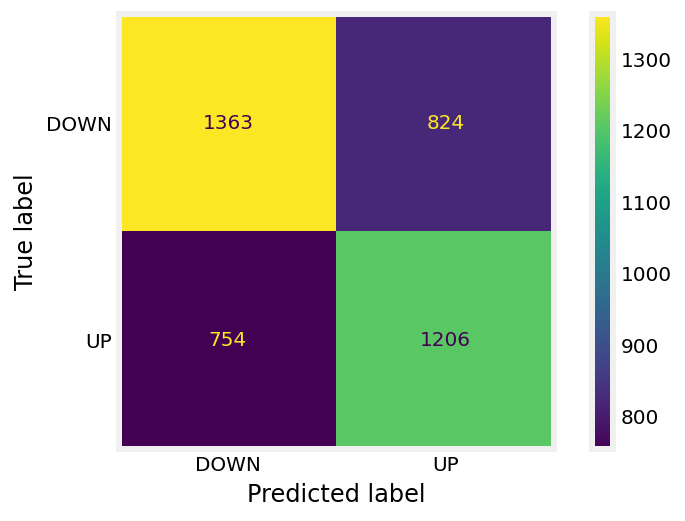

In [336]:
plot_confusion_matrix(gs_dummy_lr.best_estimator_, dummified_test, y_test_d)
plt.grid(b=None)
plt.show()

In [333]:
print(classification_report(y_train_d, gs_dummy_lr.best_estimator_.predict(dummified_train)))

              precision    recall  f1-score   support

        DOWN       0.66      0.64      0.65      8762
          UP       0.61      0.63      0.62      7846

    accuracy                           0.63     16608
   macro avg       0.63      0.63      0.63     16608
weighted avg       0.64      0.63      0.63     16608



In [332]:
print(classification_report(y_test_d, gs_dummy_lr.best_estimator_.predict(dummified_test)))

              precision    recall  f1-score   support

        DOWN       0.64      0.62      0.63      2187
          UP       0.59      0.62      0.60      1960

    accuracy                           0.62      4147
   macro avg       0.62      0.62      0.62      4147
weighted avg       0.62      0.62      0.62      4147



In [513]:
gs_dummy_lr.best_estimator_.intercept_

array([-0.74406442])

In [510]:
gs_dummy_lr.best_estimator_.coef_

array([[ 0.01039893, -0.22320109, -0.33788488,  0.2379987 ,  0.99532337,
         1.07778209,  0.71603447,  0.30744912,  0.38218836,  0.29295609,
         0.76023605,  0.55424883,  0.33237506,  0.00430413, -0.04065659,
        -0.06940963,  0.01187037, -1.0947033 ,  0.07994994, -0.72551813]])

In [519]:

gs_dummy_logreg_coeftable=pd.DataFrame(list(zip(dummified_train.columns, gs_dummy_lr.best_estimator_.coef_[0])), 
             columns=['feature', 'coef'])

gs_dummy_logreg_coeftable['abs_coef']=np.abs(gs_dummy_logreg_coeftable['coef'])


In [520]:
gs_dummy_logreg_coeftable.sort_values(by ='abs_coef', ascending=False, inplace=True)
gs_dummy_logreg_coeftable.head(20)

,feature,coef,abs_coef
17,year_2018,-1.094703,1.094703
5,month_5,1.077782,1.077782
4,month_4,0.995323,0.995323
10,month_10,0.760236,0.760236
19,year_2020,-0.725518,0.725518
6,month_6,0.716034,0.716034
11,month_11,0.554249,0.554249
8,month_8,0.382188,0.382188
2,month_2,-0.337885,0.337885
12,month_12,0.332375,0.332375


saving probabilities for later use

In [391]:
dum_results_train = pd.DataFrame(gs_dummy_lr_reloaded.predict_proba(dummified_train), columns=['dum_logreg_Down_pp', 'dum_logreg_Up_pp'], index=dummified_train.index)

In [392]:
dum_results_test = pd.DataFrame(gs_dummy_lr_reloaded.predict_proba(dummified_test), columns=['dum_logreg_Down_pp', 'dum_logreg_Up_pp'], index=dummified_test.index)

In [397]:
dum_results_train['true_class']= y_train_d

In [399]:
dum_results_test['true_class']= y_test_d

#### Logisitc regression - elastic net on engineered features - no 'year' aspect used

re-doing the train - test set without the year-related features.

The year columns will not be relevant in the future, but maybe there is a seasonal effect in the month, and potentially there is relevance of day of the week.

In [123]:
dummified_train2 = pd.get_dummies(data_train, columns=['price_move', 'month', 'dayofweek'] , drop_first=True)

In [124]:
dummified_train2.drop(columns='year', inplace=True)

In [125]:
dummified_test2 = pd.get_dummies(data_test, columns=['price_move', 'month', 'dayofweek'] , drop_first=True)

In [126]:
dummified_test2.drop(columns='year', inplace=True)

In [127]:
dummified_train2.corr()

,text_length,duration,weighted_score,price_move_UP,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,dayofweek_1,dayofweek_2,dayofweek_3,dayofweek_4
text_length,1.000000,0.846809,0.067410,0.031677,0.022831,-0.057854,0.068715,-0.049415,0.014174,0.064000,-0.061794,0.009030,0.036193,-0.066365,0.004340,0.036854,0.023438,-0.022064,-0.010029
duration,0.846809,1.000000,0.037254,0.039168,0.020465,-0.037702,0.051354,-0.027629,0.016020,0.044627,-0.046347,0.003319,0.018772,-0.054833,-0.001224,0.033156,0.019300,-0.027602,-0.004775
weighted_score,0.067410,0.037254,1.000000,-0.041030,0.110146,-0.002329,-0.127687,-0.152820,-0.005601,-0.023317,0.008348,0.042542,0.057140,0.059154,0.052382,0.006232,0.025344,0.031197,-0.048822
price_move_UP,0.031677,0.039168,-0.041030,1.000000,-0.159758,-0.033864,0.086744,0.134297,0.004672,-0.020462,-0.017807,-0.018535,0.049539,0.019944,-0.004701,0.018593,0.000256,-0.017927,0.003177
month_2,0.022831,0.020465,0.110146,-0.159758,1.000000,-0.102249,-0.135140,-0.195029,-0.058991,-0.151581,-0.181090,-0.052418,-0.139325,-0.142287,-0.045998,-0.020430,0.004070,0.050577,-0.016666
month_3,-0.057854,-0.037702,-0.002329,-0.033864,-0.102249,1.000000,-0.071558,-0.103269,-0.031236,-0.080263,-0.095888,-0.027756,-0.073773,-0.075342,-0.024356,-0.009593,-0.027967,0.001901,-0.001332
month_4,0.068715,0.051354,-0.127687,0.086744,-0.135140,-0.071558,1.000000,-0.136488,-0.041284,-0.106081,-0.126733,-0.036684,-0.097504,-0.099577,-0.032191,0.041926,-0.021243,0.008813,-0.042106
month_5,-0.049415,-0.027629,-0.152820,0.134297,-0.195029,-0.103269,-0.136488,1.000000,-0.059579,-0.153092,-0.182896,-0.052941,-0.140714,-0.143705,-0.046457,-0.025018,0.007354,-0.027765,0.040238
month_6,0.014174,0.016020,-0.005601,0.004672,-0.058991,-0.031236,-0.041284,-0.059579,1.000000,-0.046307,-0.055321,-0.016013,-0.042563,-0.043467,-0.014052,0.000634,0.005440,0.002003,-0.019955
month_7,0.064000,0.044627,-0.023317,-0.020462,-0.151581,-0.080263,-0.106081,-0.153092,-0.046307,1.000000,-0.142151,-0.041147,-0.109366,-0.111691,-0.036107,0.000483,0.045252,-0.034134,0.007298


In [130]:
dummified_train2.drop(columns=['text_length', 'price_move_UP'], inplace=True)

In [132]:
dummified_test2.drop(columns=['text_length', 'price_move_UP'], inplace=True)

In [140]:
dummy_logreg2= LogisticRegression(penalty='elasticnet',solver='saga', fit_intercept=True, max_iter=50000, random_state=42)

In [141]:
gs_dummy_lr_dict = {'C': np.logspace(-4, 4, 5),
                    'l1_ratio': np.linspace(0,1,5)
                   }

In [145]:
gs_dummy_lr2 = GridSearchCV(estimator=dummy_logreg2, param_grid=gs_dummy_lr_dict, cv=5, scoring='roc_auc', verbose=1, return_train_score=True, n_jobs=-1)

In [146]:
gs_dummy_lr2.fit(dummified_train2, y_train_d)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   20.1s
[Parallel(n_jobs=-1)]: Done 125 out of 125 | elapsed:  4.3min finished


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=50000, penalty='elasticnet',
                                          random_state=42, solver='saga'),
             n_jobs=-1,
             param_grid={'C': array([1.e-04, 1.e-02, 1.e+00, 1.e+02, 1.e+04]),
                         'l1_ratio': array([0.  , 0.25, 0.5 , 0.75, 1.  ])},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [148]:
gs_dummy_lr2.best_score_

0.6310650837526048

In [149]:
gs_dummy_lr2.score(dummified_test2, y_test_d)

0.6179994494368392

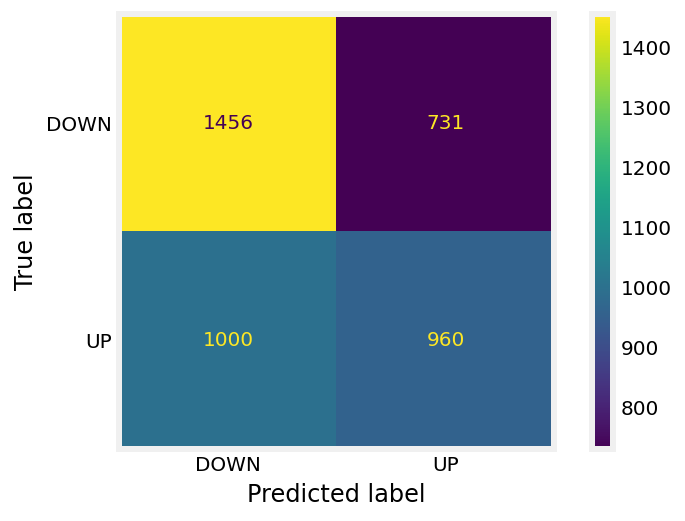

In [151]:
plot_confusion_matrix(gs_dummy_lr2, dummified_test2, y_test_d)
plt.grid(b=None)
plt.show()

In [152]:
print(classification_report(y_test_d, gs_dummy_lr2.best_estimator_.predict(dummified_test2)))

              precision    recall  f1-score   support

        DOWN       0.59      0.67      0.63      2187
          UP       0.57      0.49      0.53      1960

    accuracy                           0.58      4147
   macro avg       0.58      0.58      0.58      4147
weighted avg       0.58      0.58      0.58      4147



Due to lack of time, this was not investigated further. Mean cv score was inferior to models in 3.4. Accuracy is in the region where the better models scored. Probably still worths looking into changing prediction threshold and analysing which word's coefficients were most significant. 

## Tf-idf Vectorizer - All words (not limited on frequency)

In [20]:
tvec = TfidfVectorizer(stop_words='english')
tvec.fit(df_train['text'])
tvec_mat = tvec.transform(df_train['text'])

words = tvec.get_feature_names()

# number of different words
print(len(words))

138884


In [21]:
X_train = tvec_mat

X_test = tvec.transform(df_test['text'])


### Logisitc Regression

In [24]:
lr_all_words = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=50000, verbose = 1, n_jobs=2)
lr_all_words.fit(X_train, y_train)
print(lr_all_words.score(X_train, y_train))
print(lr_all_words.score(X_test, y_test))

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   14.7s finished


0.7575594275791869
0.5732758620689655


In [33]:
all_words_scores = cross_val_score(lr_all_words, X_train, y_train, cv=5, scoring = 'roc_auc')

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   11.9s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   11.4s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   11.6s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   11.2s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   13.3s finished


In [34]:
all_words_scores

array([0.59167655, 0.5912741 , 0.59897814, 0.59271191, 0.5932474 ])

In [35]:
all_words_scores.mean()

0.5935776212127541

In [170]:
gs_logreg_dict1={'C': np.logspace(-4, 4, 10),
          'penalty': ['l1', 'l2'],
                 'solver': ['liblinear'],
          'fit_intercept': [True, False],
                'random_state' : [42]}

In [171]:
gs_logreg_all = GridSearchCV(estimator=lr_all_words, 
                             param_grid = gs_logreg_dict1,
                            cv=skf,
                             scoring='roc_auc',
                            return_train_score=True)

In [172]:
gs_logreg_all.fit(X_train, y_train)

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=LogisticRegression(max_iter=50000, n_jobs=2, verbose=1),
             param_grid={'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                         'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2'], 'random_state': [42],
                         'solver': ['liblinear']},
             return_train_score=True, scoring='roc_auc')

In [175]:
gs_logreg_all.best_estimator_

LogisticRegression(C=2.782559402207126, fit_intercept=False, max_iter=50000,
                   n_jobs=2, penalty='l1', random_state=42, solver='liblinear',
                   verbose=1)

In [176]:
gs_logreg_all.best_params_

{'C': 2.782559402207126,
 'fit_intercept': False,
 'penalty': 'l1',
 'random_state': 42,
 'solver': 'liblinear'}

In [177]:
gs_logreg_all.best_score_

0.6101493935639073

In [226]:
joblib.dump(gs_logreg_all, 'gs_logreg_allwords_tvec_full.jlib')

['gs_logreg_allwords_tvec_full.jlib']

In [178]:
confusion_matrix(y_train, gs_logreg_all.predict(X_train))

array([[6840, 1965],
       [2329, 5567]])

In [179]:
confusion_matrix(y_test, gs_logreg_all.predict(X_test))

array([[1404,  798],
       [ 939, 1035]])

In [180]:
print(classification_report(y_train, gs_logreg_all.predict(X_train)))

              precision    recall  f1-score   support

        DOWN       0.75      0.78      0.76      8805
          UP       0.74      0.71      0.72      7896

    accuracy                           0.74     16701
   macro avg       0.74      0.74      0.74     16701
weighted avg       0.74      0.74      0.74     16701



In [181]:
print(classification_report(y_test, gs_logreg_all.predict(X_test)))

              precision    recall  f1-score   support

        DOWN       0.60      0.64      0.62      2202
          UP       0.56      0.52      0.54      1974

    accuracy                           0.58      4176
   macro avg       0.58      0.58      0.58      4176
weighted avg       0.58      0.58      0.58      4176



### Random Forest

In [97]:
gs_dict2

{'criterion': ['gini', 'entropy'],
 'max_features': ['auto', 'sqrt'],
 'max_depth': [6, 7, 8, 9, 10, 11, 20, None],
 'min_samples_leaf': [5, 10, 20],
 'min_samples_split': [2, 5, 10]}

In [135]:
model

RandomForestClassifier(random_state=42, verbose=1)

In [136]:
random_rf_allwords=RandomizedSearchCV(estimator=model, param_distributions=gs_dict2, scoring='roc_auc', n_iter=100, verbose=1, n_jobs=2, random_state=42, return_train_score=True,)

In [137]:
random_rf_allwords.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  7.6min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed: 38.1min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed: 86.1min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed: 97.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   37.8s finished


RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42, verbose=1),
                   n_iter=100, n_jobs=2,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [6, 7, 8, 9, 10, 11, 20,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [5, 10, 20],
                                        'min_samples_split': [2, 5, 10]},
                   random_state=42, return_train_score=True, scoring='roc_auc',
                   verbose=1)

In [138]:
random_rf_allwords.best_score_

0.609110554843628

In [227]:
joblib.dump(random_rf_allwords, 'random_rf_allwords_tvec_full.jlib')

['random_rf_allwords_tvec_full.jlib']

In [139]:
random_rf_allwords.score(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.4s finished


0.9997608892893245

In [140]:
random_rf_allwords.score(X_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished


0.6050134491348476

In [141]:
confusion_matrix(y_train, random_rf_allwords.predict(X_train))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.5s finished


array([[8782,   23],
       [ 134, 7762]])

In [142]:
confusion_matrix(y_test, random_rf_allwords.predict(X_test))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished


array([[1765,  437],
       [1311,  663]])

In [148]:
gs_dict4={'min_samples_split': [3,4,5,6,8],
 'min_samples_leaf': [8,9,10,11,12],
 'max_features': ['auto'],
 'max_depth': [None],
 'criterion': ['entropy']}

In [150]:
gs_rf_all = GridSearchCV(estimator=model, param_grid=gs_dict4, cv=5, scoring='roc_auc', return_train_score=True, n_jobs=2)

In [151]:
gs_rf_all.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   43.9s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(random_state=42, verbose=1),
             n_jobs=2,
             param_grid={'criterion': ['entropy'], 'max_depth': [None],
                         'max_features': ['auto'],
                         'min_samples_leaf': [8, 9, 10, 11, 12],
                         'min_samples_split': [3, 4, 5, 6, 8]},
             return_train_score=True, scoring='roc_auc')

In [152]:
gs_rf_all.best_params_

{'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'auto',
 'min_samples_leaf': 10,
 'min_samples_split': 3}

In [153]:
gs_rf_all.best_score_

0.6049283769121238

In [154]:
gs_rf_all.best_estimator_

RandomForestClassifier(criterion='entropy', min_samples_leaf=10,
                       min_samples_split=3, random_state=42, verbose=1)

In [155]:
gs_rf_all.score(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.6s finished


0.9997608892893245

In [156]:
gs_rf_all.score(X_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished


0.6050134491348476

In [157]:
confusion_matrix(y_train, gs_rf_all.predict(X_train))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.0s finished


array([[8782,   23],
       [ 134, 7762]])

In [158]:
confusion_matrix(y_train, gs_rf_all.best_estimator_.predict(X_train))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.3s finished


array([[8782,   23],
       [ 134, 7762]])

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.3s finished


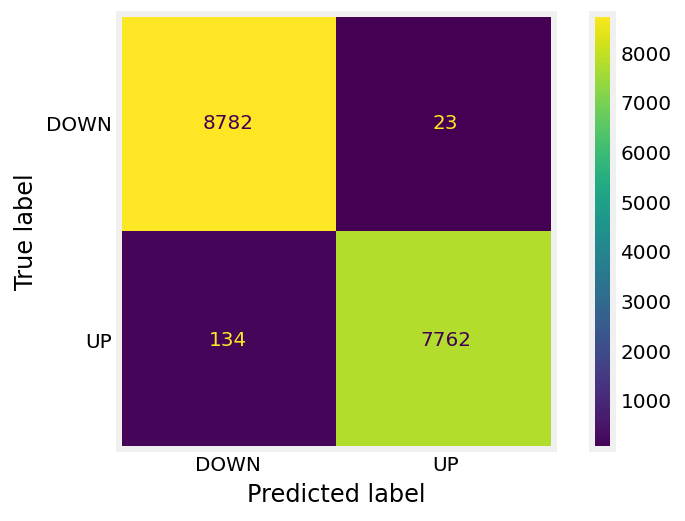

In [159]:
plot_confusion_matrix(gs_rf_all.best_estimator_, X_train, y_train)
plt.grid(b=None)
plt.show()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished


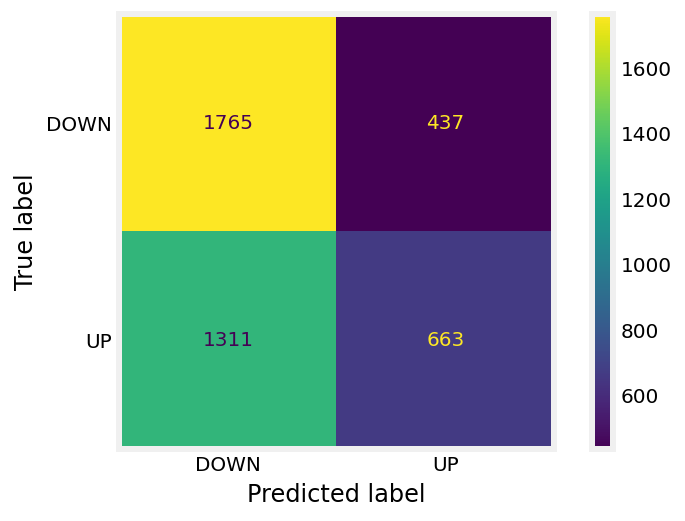

In [160]:
plot_confusion_matrix(gs_rf_all.best_estimator_, X_test, y_test)
plt.grid(b=None)
plt.show()

In [161]:
print(classification_report(y_train, gs_rf_all.best_estimator_.predict(X_train)))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.1s finished


              precision    recall  f1-score   support

        DOWN       0.98      1.00      0.99      8805
          UP       1.00      0.98      0.99      7896

    accuracy                           0.99     16701
   macro avg       0.99      0.99      0.99     16701
weighted avg       0.99      0.99      0.99     16701



In [162]:
print(classification_report(y_test, gs_rf_all.best_estimator_.predict(X_test)))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


              precision    recall  f1-score   support

        DOWN       0.57      0.80      0.67      2202
          UP       0.60      0.34      0.43      1974

    accuracy                           0.58      4176
   macro avg       0.59      0.57      0.55      4176
weighted avg       0.59      0.58      0.56      4176



[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.3s finished


### Naive Bayes

In [183]:
nb_all = MultinomialNB()

In [185]:
nb_all.fit(X_train, y_train)

MultinomialNB()

In [186]:
nb_all_scores = cross_val_score(nb_all, X_train, y_train, cv= 5, scoring='roc_auc', verbose=1)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    4.6s finished


In [187]:
nb_all_scores.mean()

0.5255538531146018

In [188]:
confusion_matrix(y_train, nb_all.predict(X_train))

array([[8492,  313],
       [5895, 2001]])

In [189]:
confusion_matrix(y_test, nb_all.predict(X_test))

array([[1975,  227],
       [1731,  243]])

In [190]:
print(classification_report(y_test, nb_all.predict(X_test)))

              precision    recall  f1-score   support

        DOWN       0.53      0.90      0.67      2202
          UP       0.52      0.12      0.20      1974

    accuracy                           0.53      4176
   macro avg       0.52      0.51      0.43      4176
weighted avg       0.53      0.53      0.45      4176



### KNN

In [215]:
knn_all = KNeighborsClassifier(n_neighbors=3)

In [216]:
knn_all.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [217]:
knn_all_score = cross_val_score(knn_all, X_train, y_train, cv=5, scoring = 'roc_auc', verbose=1 )

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  7.0min finished


In [218]:
knn_all.score(X_train, y_train)

0.7406742111250824

In [219]:
knn_all.score(X_test, y_test)

0.48227969348659006

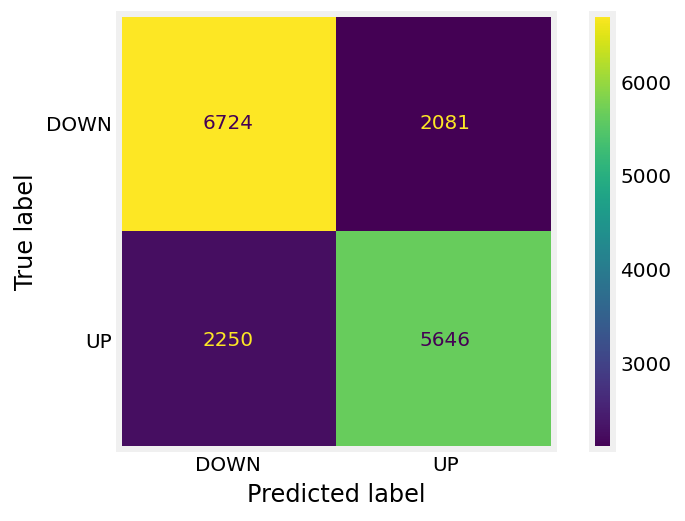

In [220]:
plot_confusion_matrix(knn_all, X_train, y_train)
plt.grid(b=None)
plt.show()

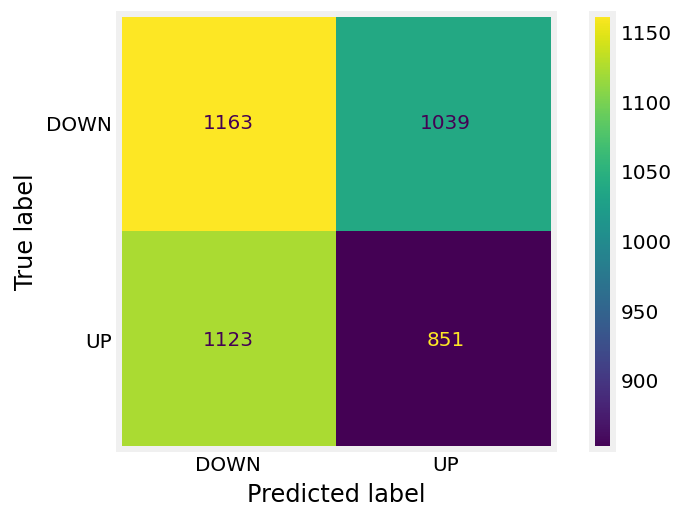

In [221]:
plot_confusion_matrix(knn_all, X_test, y_test)
plt.grid(b=None)
plt.show()

In [222]:
print(classification_report(y_train, knn_all.predict(X_train)))

              precision    recall  f1-score   support

        DOWN       0.75      0.76      0.76      8805
          UP       0.73      0.72      0.72      7896

    accuracy                           0.74     16701
   macro avg       0.74      0.74      0.74     16701
weighted avg       0.74      0.74      0.74     16701



In [223]:
print(classification_report(y_test, knn_all.predict(X_test)))

              precision    recall  f1-score   support

        DOWN       0.51      0.53      0.52      2202
          UP       0.45      0.43      0.44      1974

    accuracy                           0.48      4176
   macro avg       0.48      0.48      0.48      4176
weighted avg       0.48      0.48      0.48      4176



### Support Vector Classifier

In [42]:
clf = SVC(C=1 , kernel = 'rbf',  gamma='scale')

In [44]:
clf.fit(X_train, y_train)

SVC(C=1)

In [ ]:
cross_val_score(clf, X_train, y_train, cv=5, scoring = 'roc_auc').mean()

it took a very long time, I eventually interrupted

## Tf-idf Vectorizer - negative words (no limit on frequency)

In [29]:
tvec_negative = TfidfVectorizer(vocabulary=negative_word_list)

In [30]:
tvec_negative.fit(df_train['text'])

TfidfVectorizer(vocabulary=['abandon', 'abandoned', 'abandoning', 'abandonment',
                            'abandonments', 'abandons', 'abdicated',
                            'abdicates', 'abdicating', 'abdication',
                            'abdications', 'aberrant', 'aberration',
                            'aberrational', 'aberrations', 'abetting',
                            'abnormal', 'abnormalities', 'abnormality',
                            'abnormally', 'abolish', 'abolished', 'abolishes',
                            'abolishing', 'abrogate', 'abrogated', 'abrogates',
                            'abrogating', 'abrogation', 'abrogations', ...])

In [31]:
X_neg_train = tvec_negative.transform(df_train['text'])

In [32]:
X_neg_test = tvec_negative.transform(df_test['text'])

### Logisitic Regression

In [33]:
lr_neg = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=50000, verbose = 1, n_jobs=2)

In [48]:
lr_neg.fit(X_neg_train, y_train)
print(lr_neg.score(X_neg_train, y_train))
print(lr_neg.score(X_neg_test, y_test))

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.5s finished


0.6188850967007964
0.5486111111111112


In [50]:
neg_words_scores = cross_val_score(lr_neg, X_neg_train, y_train, cv=skf, scoring='roc_auc')

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.2s finished


In [51]:
neg_words_scores

array([0.56144811, 0.54949455, 0.56707697, 0.56620271, 0.5686277 ])

In [52]:
neg_words_scores.mean()

0.5625700097621009

In [49]:
print(classification_report(y_test, lr_neg.predict(
    X_neg_test)))

              precision    recall  f1-score   support

        DOWN       0.56      0.68      0.62      2202
          UP       0.53      0.40      0.45      1974

    accuracy                           0.55      4176
   macro avg       0.54      0.54      0.53      4176
weighted avg       0.55      0.55      0.54      4176



In [34]:
gs_lr_neg_dict = {'C': np.logspace(-4, 4, 10),
          'penalty': ['l1', 'l2'],
                 'solver': ['liblinear'],
          'fit_intercept': [True, False],
                'random_state' : [42]}

In [35]:
gs_lr_neg= GridSearchCV(estimator=lr_neg, param_grid=gs_lr_neg_dict, cv=5, scoring='roc_auc', return_train_score=True)

In [36]:
gs_lr_neg.fit(X_neg_train, y_train)

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear][LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=50000, n_jobs=2, verbose=1),
             param_grid={'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                         'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2'], 'random_state': [42],
                         'solver': ['liblinear']},
             return_train_score=True, scoring='roc_auc')

In [37]:
gs_lr_neg.best_score_

0.5700826183402266

In [38]:
gs_lr_neg.best_estimator_

LogisticRegression(C=0.046415888336127774, fit_intercept=False, max_iter=50000,
                   n_jobs=2, random_state=42, solver='liblinear', verbose=1)

not investigated further as I had better scores with count vectorizer

### Random Forest

In [58]:
rf_neg = RandomForestClassifier(n_jobs=2, verbose=1, random_state=42)

In [59]:
rf_neg.fit(X_neg_train, y_train)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    6.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:   13.1s finished


RandomForestClassifier(n_jobs=2, random_state=42, verbose=1)

In [60]:
print(rf_neg.score(X_neg_train, y_train))
print(rf_neg.score(X_neg_test, y_test))

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.2s


0.999580863421352
0.5557950191570882


[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.1s finished


In [62]:
rf_neg_scores = cross_val_score(rf_neg, X_neg_train, y_train, cv=skf, scoring = 'roc_auc')

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    4.9s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:   10.3s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    4.7s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:   10.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    4.7s
[Parallel(n_jobs=2)]: Done 100

In [63]:
rf_neg_scores

array([0.55218572, 0.56569221, 0.56678351, 0.55170899, 0.54996819])

In [64]:
rf_neg_scores.mean()

0.5572677235499985

In [61]:
print(classification_report(y_test, rf_neg.predict(
    X_neg_test)))

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.1s finished


              precision    recall  f1-score   support

        DOWN       0.56      0.75      0.64      2202
          UP       0.55      0.34      0.42      1974

    accuracy                           0.56      4176
   macro avg       0.55      0.54      0.53      4176
weighted avg       0.55      0.56      0.54      4176



In [74]:
max_dep

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, None]

In [75]:
gs_dict1={
 'max_depth': max_dep
    }

In [76]:
gs_rf = GridSearchCV(estimator=model, param_grid=gs_dict1, cv=5, scoring='roc_auc', return_train_score=True)

In [78]:
gs_rf.fit(X_neg_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(random_state=42, verbose=1),
             param_grid={'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, None]},
             return_train_score=True, scoring='roc_auc')

In [79]:
gs_rfbest = gs_rf.best_estimator_
gs_rfbest

RandomForestClassifier(max_depth=10, random_state=42, verbose=1)

In [80]:
gs_rf.best_score_

0.5633032707711321

In [81]:
gs_rf.score(X_neg_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished


0.8024327831945903

In [82]:
gs_rf.score(X_neg_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


0.5655372706216233

not investigated further, better scores with count vectorizer

## Tf-idf Vectorizer - all words - limited by frequency

In [20]:

tvec = TfidfVectorizer(max_df=0.8, min_df = 1000,stop_words='english')
tvec.fit(df_train['text'])
tvec_mat = tvec.transform(df_train['text'])

words = tvec.get_feature_names()

# number of different words
print(len(words))

3430


In [21]:
X_train = tvec_mat

X_test = tvec.transform(df_test['text'])


### Logisitc Regression

In [36]:
lr_all_words = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=50000, verbose = 1, n_jobs=2)

In [24]:
lr_all_words.fit(X_train, y_train)
print(lr_all_words.score(X_train, y_train))
print(lr_all_words.score(X_test, y_test))

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.


0.6799592838752171
0.5890804597701149


[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    8.7s finished


In [32]:
all_words_scores = cross_val_score(lr_all_words, X_train, y_train, cv=skf, scoring = 'roc_auc')

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   40.8s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    3.8s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   13.1s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:  2.5min finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    5.8s finished


In [33]:
all_words_scores

array([0.62462316, 0.62901714, 0.61083557, 0.61071797, 0.61005445])

In [34]:
all_words_scores.mean()

0.6170496597058135

In [33]:
gs_logreg_dict1={'C': np.logspace(-4, 4, 10),
          'penalty': ['l1', 'l2'],
                 'solver': ['liblinear'],
          'fit_intercept': [True, False],
                'random_state' : [42]}

In [38]:
gs_logreg_all = GridSearchCV(estimator=lr_all_words, 
                             param_grid = gs_logreg_dict1,
                            cv=5,
                             scoring='roc_auc',
                            return_train_score=True)

In [39]:
gs_logreg_all.fit(X_train, y_train)

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1353: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn("'n_jobs' > 1 does not have any effect when"


[LibLinear]

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=LogisticRegression(max_iter=50000, n_jobs=2, verbose=1),
             param_grid={'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                         'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2'], 'random_state': [42],
                         'solver': ['liblinear']},
             return_train_score=True, scoring='roc_auc')

In [40]:
gs_logreg_all.best_estimator_

LogisticRegression(C=0.3593813663804626, max_iter=50000, n_jobs=2, penalty='l1',
                   random_state=42, solver='liblinear', verbose=1)

In [41]:
gs_logreg_all.best_params_

{'C': 0.3593813663804626,
 'fit_intercept': True,
 'penalty': 'l1',
 'random_state': 42,
 'solver': 'liblinear'}

In [108]:
joblib.dump(gs_logreg_all, 'gs_logreg_all_tvec_limit.jlib')

['gs_logreg_all_tvec_limit.jlib']

In [54]:
gs_logreg_all_reloaded = joblib.load(r'../part-03/gs_logreg_all_tvec_limit.jlib')

In [42]:
gs_logreg_all.best_score_

0.622405042487102

In [43]:
confusion_matrix(y_train, gs_logreg_all.predict(X_train))

array([[6623, 2182],
       [4488, 3408]])

In [44]:
confusion_matrix(y_test, gs_logreg_all.predict(X_test))

array([[1632,  570],
       [1184,  790]])

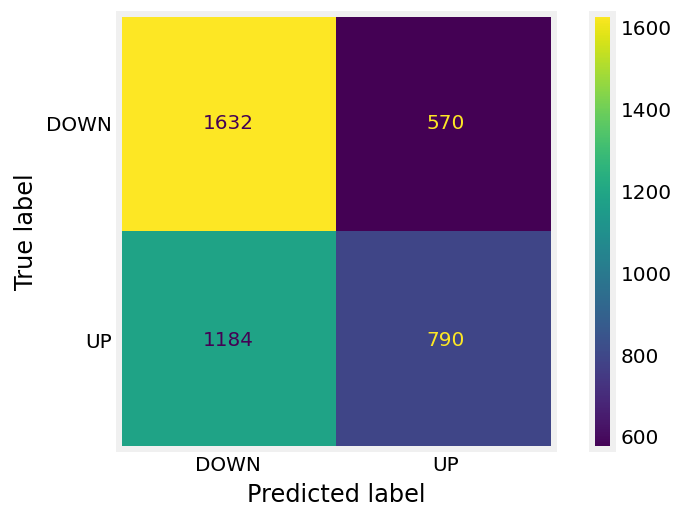

In [56]:
plot_confusion_matrix(gs_logreg_all_reloaded.best_estimator_, X_test, y_test)
plt.grid(b=None)
plt.show()

In [45]:
print(classification_report(y_train, gs_logreg_all.predict(X_train)))

print(classification_report(y_test, gs_logreg_all.predict(X_test)))

              precision    recall  f1-score   support

        DOWN       0.60      0.75      0.67      8805
          UP       0.61      0.43      0.51      7896

    accuracy                           0.60     16701
   macro avg       0.60      0.59      0.59     16701
weighted avg       0.60      0.60      0.59     16701

              precision    recall  f1-score   support

        DOWN       0.58      0.74      0.65      2202
          UP       0.58      0.40      0.47      1974

    accuracy                           0.58      4176
   macro avg       0.58      0.57      0.56      4176
weighted avg       0.58      0.58      0.57      4176



#### Analysis of Logisitc Regression coefficients

In [46]:

gs_logreg_coeftable=pd.DataFrame(list(zip(tvec.get_feature_names(), gs_logreg_all.best_estimator_.coef_[0])), 
             columns=['feature', 'coef'])

gs_logreg_coeftable.sort_values(by = 'coef', ascending = False, inplace=True)

gs_logreg_coeftable.head(20)

,feature,coef
334,april,5.139370
732,congrats,3.743090
840,crisis,3.733160
1916,march,3.565155
1040,downturn,2.891407
2860,shutdown,2.483744
1727,jaffray,1.617064
2467,q1,1.490549
2469,q3,1.441443
1164,essential,1.371640


### Naive Bayes

In [115]:
nb_all = MultinomialNB()

nb_all.fit(X_train, y_train)

nb_all_scores = cross_val_score(nb_all, X_train, y_train, cv= skf, scoring='roc_auc', verbose=1)

nb_all_scores.mean()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.0s finished


0.5846739144472709

In [116]:
confusion_matrix(y_train, nb_all.predict(X_train))

array([[7369, 1436],
       [5399, 2497]])

In [126]:
confusion_matrix(y_test, nb_all.predict(X_test))

array([[1831,  371],
       [1383,  591]])

In [118]:
print(classification_report(y_train, nb_all.predict(X_train)))

print(classification_report(y_test, nb_all.predict(X_test)))

              precision    recall  f1-score   support

        DOWN       0.58      0.84      0.68      8805
          UP       0.63      0.32      0.42      7896

    accuracy                           0.59     16701
   macro avg       0.61      0.58      0.55     16701
weighted avg       0.60      0.59      0.56     16701

              precision    recall  f1-score   support

        DOWN       0.57      0.83      0.68      2202
          UP       0.61      0.30      0.40      1974

    accuracy                           0.58      4176
   macro avg       0.59      0.57      0.54      4176
weighted avg       0.59      0.58      0.55      4176



In [128]:
gs_nb_all_dict={'alpha': np.linspace(0, 1, 10)}

In [129]:
gs_nb_all = GridSearchCV(estimator = nb_all, param_grid= gs_nb_all_dict, scoring = 'roc_auc', cv = skf, verbose=1, return_train_score=True)

In [130]:
gs_nb_all.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/naive_bayes.py:511: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn('alpha too small will result in numeric errors, '
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/naive_bayes.py:511: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn('alpha too small will result in numeric errors, '
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/naive_bayes.py:511: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn('alpha too small will result in numeric errors, '
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/naive_bayes.py:511: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn('alpha to

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=MultinomialNB(),
             param_grid={'alpha': array([0.        , 0.11111111, 0.22222222, 0.33333333, 0.44444444,
       0.55555556, 0.66666667, 0.77777778, 0.88888889, 1.        ])},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [131]:
gs_nb_all.best_score_

0.5850191762465274

In [132]:
gs_nb_all.best_params_

{'alpha': 0.0}

In [133]:
gs_nb_all_dict2={'alpha': np.linspace(0, 0.1, 10)}

In [134]:
gs_nb_all2 = GridSearchCV(estimator = nb_all, param_grid= gs_nb_all_dict2, scoring = 'roc_auc', cv = 5, verbose=1, return_train_score=True)

In [135]:
gs_nb_all2.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/naive_bayes.py:511: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn('alpha too small will result in numeric errors, '
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/naive_bayes.py:511: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn('alpha too small will result in numeric errors, '
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/naive_bayes.py:511: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn('alpha too small will result in numeric errors, '
/Users/ritatolgyesi/opt/anaconda3/lib/python3.8/site-packages/sklearn/naive_bayes.py:511: UserWarning: alpha too small will result in numeric errors, setting alpha = 1.0e-10
  warnings.warn('alpha to

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=MultinomialNB(),
             param_grid={'alpha': array([0.        , 0.01111111, 0.02222222, 0.03333333, 0.04444444,
       0.05555556, 0.06666667, 0.07777778, 0.08888889, 0.1       ])},
             return_train_score=True, scoring='roc_auc', verbose=1)

In [136]:
gs_nb_all2.best_score_

0.5850191762465274

In [137]:
gs_nb_all2.best_params_

{'alpha': 0.0}

### KNN

In [119]:
knn_all = KNeighborsClassifier(n_neighbors=3)

knn_all.fit(X_train, y_train)

knn_all_score = cross_val_score(knn_all, X_train, y_train, cv=5, scoring = 'roc_auc', verbose=1 )

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.7min finished


In [120]:
knn_all_score.mean()

0.4796118363154191

In [121]:
knn_all.score(X_train, y_train)

0.7376205017663613

In [122]:
knn_all.score(X_test, y_test)

0.49018199233716475

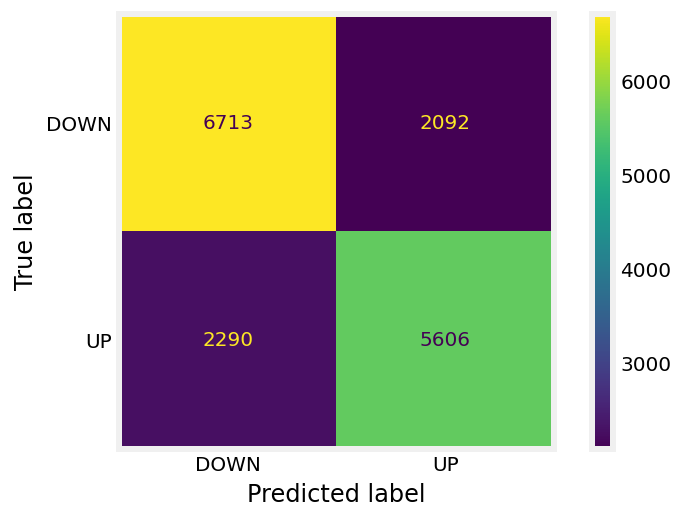

In [123]:
plot_confusion_matrix(knn_all, X_train, y_train)
plt.grid(b=None)
plt.show()

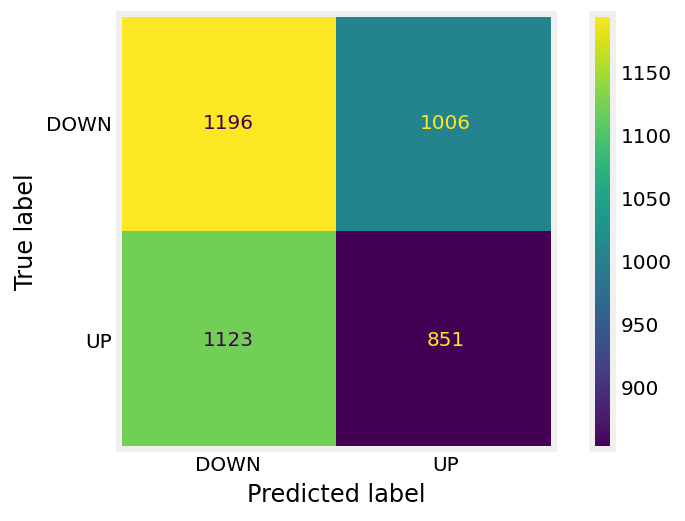

In [124]:
plot_confusion_matrix(knn_all, X_test, y_test)
plt.grid(b=None)
plt.show()

In [125]:
print(classification_report(y_train, knn_all.predict(X_train)))

print(classification_report(y_test, knn_all.predict(X_test)))

              precision    recall  f1-score   support

        DOWN       0.75      0.76      0.75      8805
          UP       0.73      0.71      0.72      7896

    accuracy                           0.74     16701
   macro avg       0.74      0.74      0.74     16701
weighted avg       0.74      0.74      0.74     16701

              precision    recall  f1-score   support

        DOWN       0.52      0.54      0.53      2202
          UP       0.46      0.43      0.44      1974

    accuracy                           0.49      4176
   macro avg       0.49      0.49      0.49      4176
weighted avg       0.49      0.49      0.49      4176



not investigated further as mean cv score is inferior toprevious models

## Tf-idf Vectorizer - negative words - limited by frequency

In [28]:
tvec_negative = TfidfVectorizer(max_df=0.8, min_df = 1000,vocabulary=negative_word_list)

In [29]:
tvec_negative.fit(df_train['text'])

TfidfVectorizer(max_df=0.8, min_df=1000,
                vocabulary=['abandon', 'abandoned', 'abandoning', 'abandonment',
                            'abandonments', 'abandons', 'abdicated',
                            'abdicates', 'abdicating', 'abdication',
                            'abdications', 'aberrant', 'aberration',
                            'aberrational', 'aberrations', 'abetting',
                            'abnormal', 'abnormalities', 'abnormality',
                            'abnormally', 'abolish', 'abolished', 'abolishes',
                            'abolishing', 'abrogate', 'abrogated', 'abrogates',
                            'abrogating', 'abrogation', 'abrogations', ...])

In [44]:
X_neg_train = tvec_negative.transform(df_train['text'])

In [45]:
X_neg_test = tvec_negative.transform(df_test['text'])

### Logistic Regression

In [31]:
lr_neg = LogisticRegression(solver='lbfgs', penalty='l2', max_iter=50000, verbose = 1, n_jobs=2)

In [59]:
lr_neg.fit(X_neg_train, y_train)
print(lr_neg.score(X_neg_train, y_train))
print(lr_neg.score(X_neg_test, y_test))

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.


0.6188850967007964
0.5486111111111112


[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    2.5s finished


In [61]:
neg_words_scores = cross_val_score(lr_neg, X_neg_train, y_train, cv=5, scoring='roc_auc')

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.8s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.4s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.3s finished


In [62]:
neg_words_scores

array([0.56144811, 0.54949455, 0.56707697, 0.56620271, 0.5686277 ])

In [63]:
neg_words_scores.mean()

0.5625700097621009

 not investigated further as scores were better with countvectorizer

### Random Forest

In [77]:
gs_dict2 = {'criterion': ['gini', 'entropy'],
            'max_features': ['auto', 'sqrt'],
    'max_depth': [6, 7, 8, 9, 10, 11, 20, None],
           'min_samples_leaf': [5, 10, 20],
           'min_samples_split': [2, 5, 10]}

In [80]:
model

RandomForestClassifier(random_state=42, verbose=1)

In [81]:
random_rf_allwords=RandomizedSearchCV(estimator=model, param_distributions=gs_dict2, scoring='roc_auc', n_iter=100, verbose=1, n_jobs=2, random_state=42, return_train_score=True,)

In [82]:
random_rf_allwords.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed: 10.4min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed: 58.3min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed: 128.7min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed: 147.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.2min finished


RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42, verbose=1),
                   n_iter=100, n_jobs=2,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [6, 7, 8, 9, 10, 11, 20,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [5, 10, 20],
                                        'min_samples_split': [2, 5, 10]},
                   random_state=42, return_train_score=True, scoring='roc_auc',
                   verbose=1)

In [83]:
random_rf_allwords.best_score_

0.6374694694721489

In [84]:
random_rf_allwords.score(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.7s finished


0.9999684570627699

In [85]:
random_rf_allwords.score(X_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


0.6399927025905343

In [86]:
confusion_matrix(y_train, random_rf_allwords.predict(X_train))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.7s finished


array([[8802,    3],
       [  82, 7814]])

In [87]:
confusion_matrix(y_test, random_rf_allwords.predict(X_test))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


array([[1747,  455],
       [1264,  710]])

In [88]:
random_rf_allwords.best_params_

{'min_samples_split': 10,
 'min_samples_leaf': 5,
 'max_features': 'auto',
 'max_depth': 20,
 'criterion': 'entropy'}

In [93]:
gs_dict4={'min_samples_split': [3,4,5,6,7],
 'min_samples_leaf': [8,9,10,11,12],
 'max_features': ['auto'],
 'max_depth': [19, 20, 21],
 'criterion': ['entropy']}

In [94]:
gs_rf_all = GridSearchCV(estimator=model, param_grid=gs_dict4, cv=5, scoring='roc_auc', return_train_score=True)

In [95]:
gs_rf_all.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   44.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   44.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   46.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   46.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   46.5s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   45.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   45.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   45.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   44.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   45.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   45.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   44.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   44.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   44.8s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   43.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   44.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   49.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   50.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   49.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   49.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   49.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   49.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   48.6s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   47.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   47.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   50.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   47.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   46.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   47.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   46.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   46.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   46.7s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   52.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   52.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   56.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   53.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   51.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   51.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   52.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   52.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   52.5s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   55.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   54.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   52.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   55.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   51.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(random_state=42, verbose=1),
             param_grid={'criterion': ['entropy'], 'max_depth': [19, 20, 21],
                         'max_features': ['auto'],
                         'min_samples_leaf': [8, 9, 10, 11, 12],
                         'min_samples_split': [3, 4, 5, 6, 7]},
             return_train_score=True, scoring='roc_auc')

In [96]:
gs_rf_all.best_params_

{'criterion': 'entropy',
 'max_depth': 19,
 'max_features': 'auto',
 'min_samples_leaf': 8,
 'min_samples_split': 3}

In [97]:
gs_rf_all.best_score_

0.6404187397468701

In [109]:
joblib.dump(gs_rf_all, 'gs_rf_all_tvec_limit.jlib')

['gs_rf_all_tvec_limit.jlib']

In [98]:
gs_rf_all.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=19, min_samples_leaf=8,
                       min_samples_split=3, random_state=42, verbose=1)

In [99]:
gs_rf_all.score(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.7s finished


0.9996958616471828

In [100]:
gs_rf_all.score(X_test, y_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished


0.6481696201390096

In [101]:
confusion_matrix(y_train, gs_rf_all.predict(X_train))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.8s finished


array([[8794,   11],
       [ 274, 7622]])

In [102]:
confusion_matrix(y_train, gs_rf_all.best_estimator_.predict(X_train))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.7s finished


array([[8794,   11],
       [ 274, 7622]])

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.8s finished


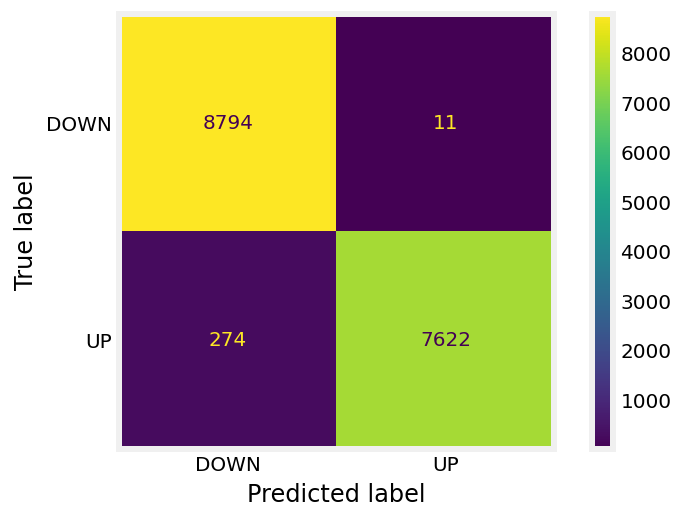

In [103]:
plot_confusion_matrix(gs_rf_all.best_estimator_, X_train, y_train)
plt.grid(b=None)
plt.show()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished


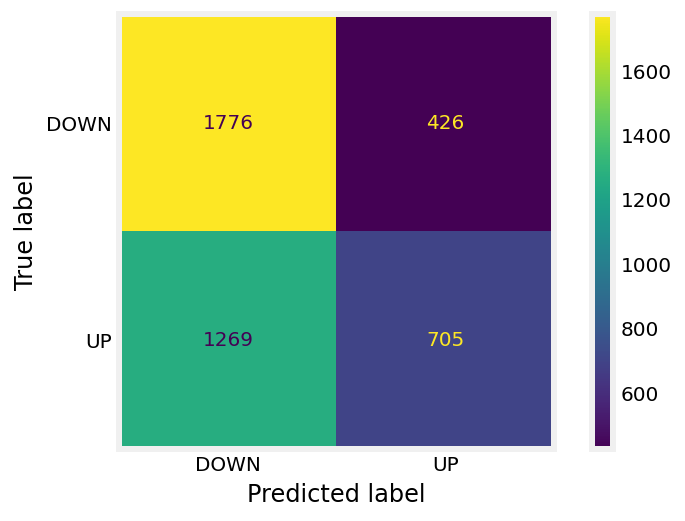

In [104]:
plot_confusion_matrix(gs_rf_all.best_estimator_, X_test, y_test)
plt.grid(b=None)
plt.show()

#### Analysing feature importance of Random Forest classifier

In [58]:
gs_rf_all_reloaded = joblib.load(r'../part-03/gs_rf_all_tvec_limit.jlib')

In [60]:
gs_rf_all_reloaded.best_estimator_.feature_importances_

array([7.76608123e-04, 9.84884478e-04, 9.81284891e-05, ...,
       1.21414763e-04, 4.63397368e-05, 1.95631829e-04])

In [61]:
gs_rf_all_featurestable=pd.DataFrame(list(zip(tvec.get_feature_names(), gs_rf_all_reloaded.best_estimator_.feature_importances_)), 
             columns=['feature', 'importance'])

gs_rf_all_featurestable.sort_values(by = 'importance' ,ascending=False, inplace=True)

gs_rf_all_featurestable.head(20)

,feature,importance
521,callfeb,0.011428
809,coronavirus,0.007123
1916,march,0.005318
524,callmay,0.004749
334,april,0.003316
43,2021,0.003112
42,2018,0.002485
840,crisis,0.002430
526,calloct,0.002154
1164,essential,0.001981


# Analysis of outcomes

results_tabble and results_table2 are defined in section 3.4.2.1 and 3.4.1.1, respectively

In [356]:
merged_results = pd.merge(results_table, results_table2, left_index=True, right_index=True)

In [370]:
merged_results_test = pd.merge(results_table_test, results_table2_test, left_index=True, right_index=True)

In [357]:
merged_results.shape

(16701, 4)

In [358]:
merged_results['true_Class'] = y_train

In [371]:
merged_results_test['true_Class'] = y_test

In [359]:
merged_results.head()

,rf_Down_pp,rf_Up_pp,logreg_Down_pp,logreg_Up_pp,true_Class
5924,0.670905,0.329095,0.697541,0.302459,DOWN
3014,0.446947,0.553053,0.454756,0.545244,UP
1315,0.499404,0.500596,0.429426,0.570574,DOWN
2251,0.415430,0.584570,0.514194,0.485806,UP
20590,0.467142,0.532858,0.513097,0.486903,UP


In [539]:
df_results_analysis_train= pd.merge(df_train, merged_results, right_index=True, left_index=True, how='left')

In [537]:
df_results_analysis_test= pd.merge(df_test, merged_results_test, right_index=True, left_index=True, how='left')

In [10]:
df_results_test.drop(columns=['rf_Up_pp','logreg_Up_pp', 'true_Class'], inplace=True)

In [11]:
df_results_train.drop(columns=['rf_Up_pp','logreg_Up_pp', 'true_Class'], inplace=True)

In [12]:
df_results_test['next_per_end_next_workingday'] = pd.to_datetime(df_results_test['next_per_end_next_workingday'])

In [13]:
df_results_test['call_date'] = pd.to_datetime(df_results_test['call_date'])

## Analysing best random forest model from 3.4.2

### Analysis of impact of changing prediction threshold

In [15]:
def predict_at_threshold(x, threshold = 0.5):
    if x>=threshold:
        return "DOWN"
    else:
        return "UP"

In [14]:
df_results_test['days_delta'] = df_results_test['next_per_end_next_workingday']-df_results_test['call_date']

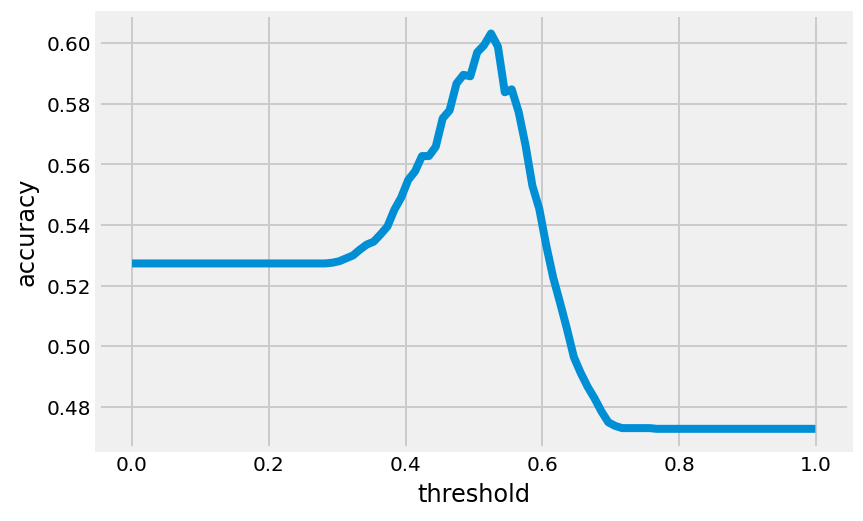

In [20]:
thresholds = np.linspace(0.0001, 0.999, 100)

plot_dict={}
for t in thresholds:
    plot_dict[t]= accuracy_score(df_results_test.price_move, df_results_test.rf_Down_pp.apply(predict_at_threshold, threshold=t))

plt.plot(list(plot_dict.keys()), list(plot_dict.values()))
plt.xlabel('threshold')
plt.ylabel('accuracy')
plt.show()

In [21]:
max(plot_dict.items(), key=lambda k: k[1])

(0.5247747474747475, 0.6032088122605364)

In [34]:
df_results_test['rf_predict_best_t']=df_results_test.rf_Down_pp.apply(predict_at_threshold, threshold= 0.5247747474747475)

In [35]:
df_results_test.head()

,call_date,periodend,next_per_end,ticker,next_per_end_next_workingday,price_at_call,price_next_pe,shareprice_diff,price_move,text,...,text_length,month,dayofweek,year,duration,rf_Down_pp,logreg_Down_pp,price_chg_%,days_delta,rf_predict_best_t
0,2019-07-25,2019-06-30,2019-09-30,IP,2019-09-30,45.99,41.82,-4.17,DOWN,International Paper (NYSE:IP)Q2 2019 Earnings...,...,56810,7,3,2019,60.0,0.538980,0.550342,-0.090672,67 days,DOWN
1,2019-10-10,2019-09-30,2019-12-31,PKE,2019-12-31,16.22,16.27,0.05,UP,Park Electrochemical (NYSE:PKE)Q2 2020 Earnin...,...,42737,10,3,2019,48.0,0.501172,0.637731,0.003083,82 days,UP
2,2019-02-25,2018-12-31,2019-03-31,TWOU,2019-04-01,71.20,72.02,0.82,UP,2U (NASDAQ:TWOU) Q4 2018 Earnings Conference ...,...,72518,2,0,2019,78.0,0.549759,0.726358,0.011517,35 days,DOWN
3,2019-05-01,2019-03-31,2019-06-30,NVEC,2019-07-01,95.00,69.90,-25.10,DOWN,NVE (NASDAQ:NVEC)Q4 2019 Earnings CallMay. 01...,...,17964,5,2,2019,23.0,0.537495,0.582405,-0.264211,61 days,DOWN
4,2018-11-28,2018-09-30,2018-12-31,SINA,2018-12-31,63.01,53.64,-9.37,DOWN,Sina Corporation (NASDAQ:SINA)Q3 2018 Earnin...,...,25539,11,2,2018,33.0,0.536186,0.505492,-0.148707,33 days,DOWN


In [43]:
df_results_test['rf_best_category']=np.where(((df_results_test['rf_predict_best_t']=='UP')&(df_results_test['price_move']=='DOWN')), 'false positive', np.where(((df_results_test['rf_predict_best_t']=='UP')&(df_results_test['price_move']=='UP')), 'true negative', np.where(((df_results_test['rf_predict_best_t']=='DOWN')&(df_results_test['price_move']=='DOWN')), 'true positive','false negative')))

In [44]:
df_results_test['rf_best_category'].value_counts()

true positive     1440
true negative     1079
false negative     895
false positive     762
Name: rf_best_category, dtype: int64

In [45]:
df_results_test['rf_best_category'].value_counts(normalize=True)

true positive     0.344828
true negative     0.258381
false negative    0.214320
false positive    0.182471
Name: rf_best_category, dtype: float64

### Analysis of timeframe where model works best

In [47]:
max(df_results_test['days_delta'])

Timedelta('91 days 00:00:00')

In [48]:
fractions_timediff_test_modrf = []
for i in range(2, 92):
    accuracy =(i, len(df_results_test[(df_results_test['days_delta']<timedelta(days=i))&((df_results_test['rf_best_category']=='true positive')|(df_results_test['rf_best_category']=='true negative'))])/len(df_results_test[df_results_test['days_delta']<timedelta(days=i)]))
    fractions_timediff_test_modrf.append(accuracy)

In [50]:
fractions_timediff_test_modrf

[(2, 1.0),
 (3, 1.0),
 (4, 0.5714285714285714),
 (5, 0.36),
 (6, 0.5227272727272727),
 (7, 0.4827586206896552),
 (8, 0.4696969696969697),
 (9, 0.47058823529411764),
 (10, 0.47058823529411764),
 (11, 0.4583333333333333),
 (12, 0.4375),
 (13, 0.45161290322580644),
 (14, 0.44761904761904764),
 (15, 0.45454545454545453),
 (16, 0.4608695652173913),
 (17, 0.4608695652173913),
 (18, 0.452991452991453),
 (19, 0.45112781954887216),
 (20, 0.43137254901960786),
 (21, 0.4367816091954023),
 (22, 0.465),
 (23, 0.4782608695652174),
 (24, 0.4782608695652174),
 (25, 0.4786729857819905),
 (26, 0.496),
 (27, 0.5051194539249146),
 (28, 0.5180722891566265),
 (29, 0.5254237288135594),
 (30, 0.5340599455040872),
 (31, 0.5340599455040872),
 (32, 0.5358090185676393),
 (33, 0.5448430493273543),
 (34, 0.5672727272727273),
 (35, 0.5885167464114832),
 (36, 0.5958702064896755),
 (37, 0.6031518624641834),
 (38, 0.6048502139800286),
 (39, 0.602510460251046),
 (40, 0.6002587322121604),
 (41, 0.6156501726121979),
 (42,

In [54]:
max(fractions_timediff_test_modrf[2:], key=lambda x: x[1])

(52, 0.6302201974183751)

In [56]:
len(fractions_timediff_test_modrf)

90

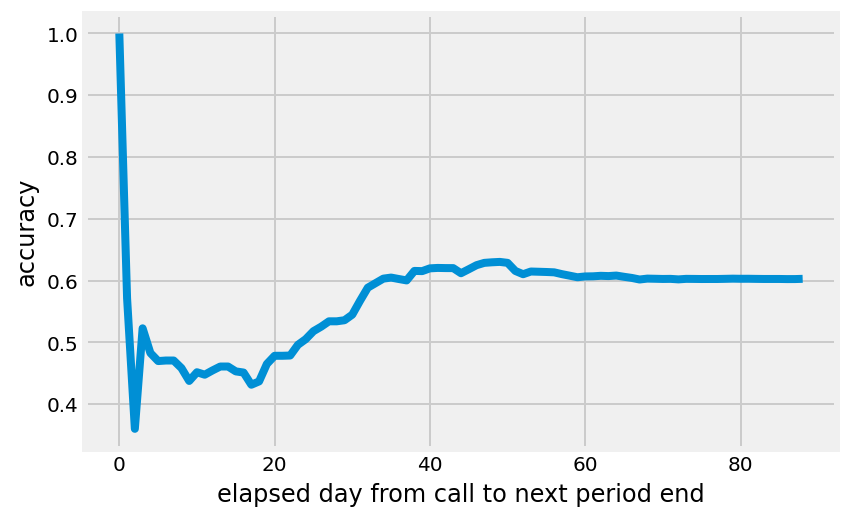

In [58]:
plt.plot([fractions_timediff_test_modrf[i][1] for i in range(1,90)])
plt.xlabel('elapsed day from call to next period end')
plt.ylabel('accuracy')
plt.show()

### Analysis of price change where model is working better

In [139]:
fractions_pricemove_test = []
for i in np.linspace(-0.844474, 13.147188, 100):
    if len(df_results_test[df_results_test['price_chg_%']<i])>0:
        accuracy =(i, len(df_results_test[(df_results_test['price_chg_%']<i)&((df_results_test['rf_category']=='true positive')|(df_results_test['rf_category']=='true negative'))])/len(df_results_test[df_results_test['price_chg_%']<i]))
        fractions_pricemove_test.append(accuracy)
    else:
        pass
           
        

In [145]:
fractions_pricemove_test[:15]

[(-0.7031440808080808, 1.0),
 (-0.5618141616161616, 0.9861111111111112),
 (-0.4204842424242423, 0.9942196531791907),
 (-0.27915432323232314, 0.9664948453608248),
 (-0.13782440404040397, 0.89728453364817),
 (0.003505515151515315, 0.7960264900662252),
 (0.1448354343434345, 0.6137798517705189),
 (0.28616535353535366, 0.59675),
 (0.42749527272727295, 0.5947329919531822),
 (0.568825191919192, 0.5942414710863779),
 (0.7101551111111113, 0.5934410417169038),
 (0.8514850303030306, 0.5938402309913379),
 (0.9928149494949496, 0.5939452186448823),
 (1.134144868686869, 0.5938025462406918),
 (1.275474787878788, 0.5937575030012004)]

In [131]:
len(df_results_test[df_results_test['price_chg_%']<-0.3])

347

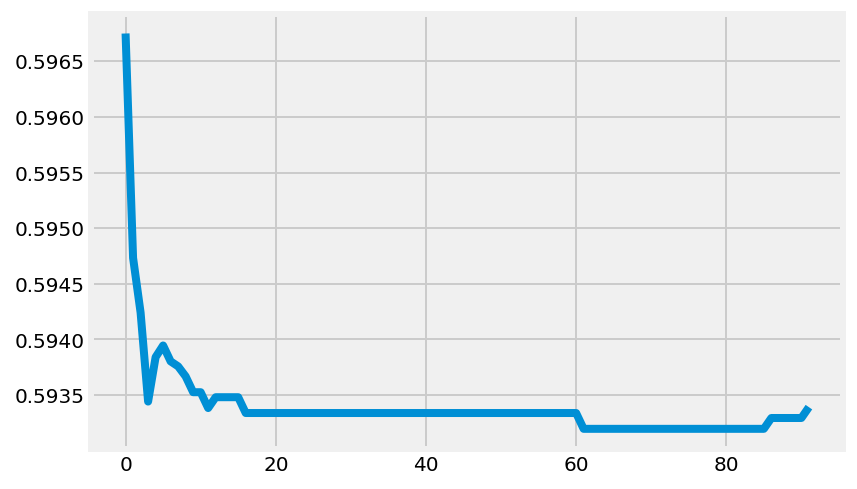

In [153]:
plt.plot([fractions_pricemove_test[7:][i][1] for i in range(92)])
plt.show()

## Analysing logistic regression built on engineered score and time aspects (with year) - section 3.7.3.1

In [463]:
thresholds = np.linspace(0.0001, 0.999, 100)

In [464]:
plot_dict={}
for t in thresholds:
    plot_dict[t]= accuracy_score(y_test_d, dum_results_test.dum_logreg_Down_pp.apply(predict_at_threshold, threshold=t))

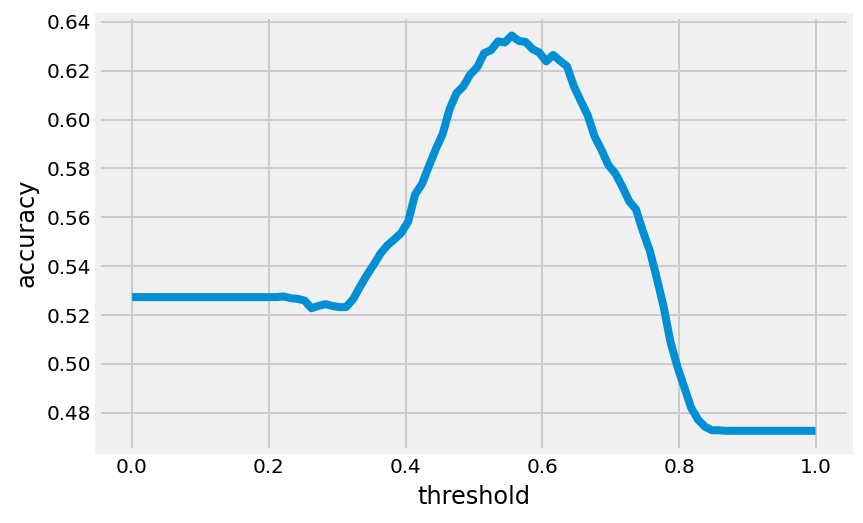

In [467]:
plt.plot(list(plot_dict.keys()), list(plot_dict.values()))
plt.xlabel('threshold')
plt.ylabel('accuracy')
plt.show()

In [469]:
max(plot_dict.items(), key=lambda k: k[1])

(0.5550444444444445, 0.6344345309862551)